# Game Awards

## Table of contents

1. <a href="#Introduction">Introduction</a>
2. <a href="#Imports">Imports</a>
3. <a href="#Data-acquisition">Data acquisition</a><br>
    3.1 <a href="#Crawling-challenges">Crawling challenges</a><br>
    i) <a href="#Collecting-the-game-pages">Collecting the game pages</a><br>
    ii) <a href="#Age authentication">Age authentication</a><br>
    iii) <a href="#Varying page structure">Varying page structure</a><br>
    3.2 <a href="#Pre crawling process">Pre-crawling process</a><br>
    3.3 <a href="#Crawling process">Crawling process</a><br>

4. <a href="#Data cleaning">Data Cleaning</a><br>
    4.1 <a href="#Duplicates handling">Duplicates</a><br>
    4.2 <a href="#Null price">Missing Price</a><br>
    4.3 <a href="#Handling the empty genres">Missing Genres</a><br>
    4.4 <a href="#Handling missing developer data">Missing Developer </a><br>
    4.5 <a href="#Handling missing publisher">Missing Publisher</a><br>
    4.6 <a href="#Handling missing publication date">Missing Publication Date</a><br>
    4.7 <a href="#Handling missing os compatibility">Missing OS Compatibility</a><br>
    4.8 <a href="#Handling missing franchise">Missing Franchise</a><br>
    4.9 <a href="#Non-game programs">Non-game Programs</a><br>

5. <a href="#EDA">EDA</a><br>
    5.1 <a href="#Genre distribution">Genre Distribution</a><br>
    5.2 <a href="#User tags distribution">User-tags Distribution</a><br>
    5.3 <a href="#Top 50 user tags distribution">Top 50- User-tags Distribution</a><br>
    5.4 <a href="#Language distribution">Language Distribution</a><br>
    5.5 <a href="#Top 50 language distribution">Top 50- Language Distribution</a><br>
    5.6 <a href="#conversion of review type to numeric">Conversion of Review Type to numeric</a><br>
    5.7 <a href="#Scater plot of reviews to games">Scatter Plot of Reviews to Games</a><br>
    5.8 <a href="#Review type to awards">Review Type to Awards</a><br>
    5.9 <a href="#Reviews amount to price">Reviews Amount to Price</a><br>
    5.10 <a href="#Game price histogram">Game Price Histogram</a><br>
    5.11 <a href="#Boxplots for price">Boxplots for Price</a><br>
    5.12 <a href="#More game price histograms">More Game and Price Histograms</a><br>

6. <a href="#EDA again after more cleaning">EDA again after more cleaning</a><br>
7. <a href="#Machine learning">Machine Learning</a><br>
    7.1 <a href="#Preprocessing">Pre-processing</a><br>
    7.2 <a href="#Decisions tree ml">Decision Tree ML</a><br>
    7.3 <a href="#First model attempt">First Model attempt</a><br>
    7.4 <a href="#Second model attempt">Second Model attempt</a><br>
    7.5 <a href="#Optimization">Optimization</a><br>
    7.6 <a href="#Prediction model- random forest">Prediction Model- Random Forest</a><br>
8. <a href="#Conclusion">Conclusions</a><br>
8. <a href="#Credits">Credits</a><br>
 


## Introduction
<a id='Introduction'></a>
<p>Video games have seen a monumental rise in popularity in recent years. What once was an enjoyable past time for kids, exclusivly in malls and arcades, now has become a media giant that netted almost 224.44 billion USD last year, leaving Hollywood in the dirt, who sat at around 95.45 billion USD in 2022. </p>
<p>There's no way of denying it, video games have taken over the world. As a result, the competition in the field is fierce, and many developers are fighting their way to the spotlight. Every year there are countless of ceremonies around the globe that feature games for their greatest achievments: Art Direction, Audio Design, Acting, Graphics, Gameplay, and too many more categories to name. </p>
<p>What if we could predict that? What if we could tell what game would win at being in the spotlight? </p>
That's the goal we've set for our research: Can we predict award winning games?

### Imports

<a id='Imports'></a>
<p>Here we include needed packages</p>

In [92]:
##_IMPORTS_##
import numpy as np
import pandas as pd

#notebook width
from IPython.core.display import display, HTML
display(HTML("<style>.container {width: 99% !important; }</style>"))
pd.options.display.max_columns = None

from bs4 import BeautifulSoup
import requests 

import time
from selenium import webdriver
from webdriver_manager.chrome import ChromeDriverManager
from urllib.parse import urljoin
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import seaborn as sns
from collections import Counter 
import sklearn
from itertools import islice

from sklearn import cluster
from sklearn import metrics, preprocessing, neighbors, cluster
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import silhouette_samples, silhouette_score

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 6)
plt.style.use('ggplot')

# Create color maps
from matplotlib.colors import ListedColormap
cmap = ListedColormap(["#e41a1c","#984ea3","#a65628","#377eb8","#ffff33","#4daf4a","#ff7f00"])

# selenium 4
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.options import Options

# decision tree
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
import pydot
import pydotplus
import os
import graphviz
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

In [2]:
#!pip install selenium
#!pip install webdriver-manager

# Data acquisition
<a id='Data-acquisition'></a>

<p>We needed a site that contained the information that we need. So we went for the biggest game destributor of them all: Steam.</p>
<p></p>

## Crawling Challenges
<a id='Crawling-challenges'></a>

<p> As we researched the site, we came to a few problems: The first challenge was that we needed to collect efficiently the pages for the games that we were trying to crawl through. <br>The issue was that the page that includes all of the games only loads once you reach the bottom. <br>Another challenge was that some pages required you to confirm your age. <br>On top of it all, each page has a slightly varying structure so the crawler that we'd build has to be able to handle those variations. </p>

#### Collecting the game pages
<a id='Collecting-the-game-pages'></a>

To harvest the data we need to go through the game pages one by one. Unfortunately for us, steam does not handle it's catalogue presentation with numbered pages. Instead it loads only the first 100 pages, and only then when the user reaches the bottom of the page, it loads an extra 50 each time.

<img src="docs/scrolling.gif">

We handled this issue using Selenium to scroll through the page and load enough games to prepare to crawl. 

In [ ]:
#comment: pip install as is has to be installed through jupyter notebook
#pip install selenium
#pip install webdriver-manager
import time
from selenium import webdriver
from bs4 import BeautifulSoup
from webdriver_manager.chrome import ChromeDriverManager
from urllib.parse import urljoin

##### Web scrapper for infinite scrolling page #####
driver = webdriver.Chrome()
driver.get("https://store.steampowered.com/search/?sort_by=_ASC&ignore_preferences=1")
time.sleep(2)         # Allow 2 seconds for the web page to open
scroll_pause_time = 4 # Time for more content to load after each scroll. Varies from machine. 
screen_height = driver.execute_script("return window.screen.height;")   # get the screen height of the web
i = 1

while True:
    break

    # scroll one screen height each time
    driver.execute_script("window.scrollTo(0, {screen_height}*{i});".format(screen_height=screen_height, i=i))  
    i += 1
    time.sleep(scroll_pause_time)
    # update scroll height each time after scrolled, as the scroll height can change after we scrolled the page
    scroll_height = driver.execute_script("return document.body.scrollHeight;")  
    # Break the loop when we've gone through 4500 iterations. Detailed explanation below the cell.
    if i>4500: 
        break
        
soup1 = BeautifulSoup(driver.page_source, "html.parser")
mtag=soup1.find("div",attrs={"id":"search_resultsRows"})
linksToPages=[t['href'] for t in mtag.findAll("a")]

#copying the list of urls to a txt file
with open(r'urls.txt', 'w') as fp:
    for item in linksToPages:
        # write each item on a new line
        fp.write("%s\n" % item)
    print('Done')
print("Number of game pages extracted: %d" %len(linksToPages))

#### Age authentication
<a id='Age authentication'></a>

Another issue we came across was that some game pages required us to authenticate our age. 
<img src="docs/agecheck.png">

#### Varying page structure
<a id='Varying page structure'></a>

<p>An issue we came across after several failed attempt at crawling was the varying page structure.</p>
<p>For example: We can see below that the pages have different pricing structure. One has a discount, and the other doesn't.</p>
<p><img src="docs/varyingPages1.png"></p>
<p><img src="docs/varyingPages2.png"></p>

### Pre crawling process
<a id='Pre crawling process'></a>
<p>We've checked manually several pages to see what useful data we can gather. <br>These are the parameters we saw fit for extraction:</p>
<p>game_name</p>
<p>genre</p>
<p>awards</p>
<p>publication_date</p>
<p>developer</p>
<p>publisher</p>
<p>franchise</p>
<p>price</p>
<p>user_tags</p>
<p>all_reviews</p>
<p>reviews_type</p>
<img src="docs/dataMarkings.png">
<img src="docs/dataMarkings1.png">

### Crawling Process
<a id='Crawling process'></a>

In [2]:
def MakeSoup(url,header):
    url1=url
    header1 = header
    response1 = requests.get(url1,headers=header)

    goodSoup = BeautifulSoup(response1.content, "html.parser")
    return goodSoup


In [3]:
def makeCSV(df,filename):
    df.to_csv('{}.csv'.format(filename))

In [4]:
def openCSV(filepath):
    dData = pd.read_csv(filepath)
    del dData["Unnamed: 0"]
    dData=mList(dData)
    return dData

In [ ]:
#get the games url list from file
#if rows=0 return all the links in the file 
#else return how many was requested or untill reach then eof
def getGameList(file,rows):
    GameList=list()
    idx=0
    with open(file, 'r') as f:
        content = f.readlines()
        for x in content:
            
                GameList.append(x.strip().split('\n')[0])
                
           
    #removing the bad links,we require only apps, not bundels or anything else
    CleanedLinks=list()
    for i in GameList:
        if(i.find("https://store.steampowered.com/app/")>=0):
            CleanedLinks.append(i)
   
    nList=list()
    while(idx<rows):
                    nList.append(CleanedLinks[idx])
                    idx=idx+1
    if(idx==0):return CleanedLinks                 
                        
                        
    return nList 

In [7]:
def DataExctractor(links,header1):

    urls=links
    game_name =list()
    genres=list()
    developer=list()
    publisher=list()
    franchise=list() 
    publication_date=list()
    price =list() 
    user_tags=list()
    all_reviews=list()
    reviews_type=list()
    languages =list()
    num_of_updates=list() #not sure is needed
    game_features=list()
    os_compatibility=list()
    awards=list() 
    idx=0
    
    textDF=pd.DataFrame()
    for url2 in urls:
        try:    
            soup1 = MakeSoup(url2,header1)

            #Using selenium to bypass age verification
            if ((soup1.find("div",attrs={"id":"genresAndManufacturer"}) is None) and (soup1.find("div",attrs={"id":"error_box"}) is None)):
                options = Options()
                options.binary_location = "D:\Program Files\Google\Chrome\Application\chrome.exe"
                driver = webdriver.Chrome(options = options)
                driver.get(url2)

                driver.find_element("name","ageYear").send_keys("1969")
                driver.find_element("id",'view_product_page_btn').click()                                    

                time.sleep(1)    
                soup1 = BeautifulSoup(driver.page_source, 'html.parser')
                driver.quit()
            if ((soup1.find("div",attrs={"id":"error_box"}) is not None)):
                #print("1")
                continue

            if(soup1.findAll("div",attrs={"id":"category_block"}) is None):
                #print("2")
                continue
            else:
                for feat in soup1.findAll("div",attrs={"id":"category_block"}):
                      rows = feat.findAll("a")
                      if(rows==[] or (rows is None)):
                             #print("3")
                             continue 

            if((soup1.findAll("div",attrs={"class":"game_area_bubble game_area_dlc_bubble"}) is not None) and soup1.findAll("div",attrs={"class":"game_area_bubble game_area_dlc_bubble"})!=[]):
                #print("4")
                continue
            if((soup1.findAll("div",attrs={"class":"game_area_mod_bubble game_area_bubble"}) is not None) and soup1.findAll("div",attrs={"class":"game_area_mod_bubble game_area_bubble"})!=[]):
                #print("5")
                continue   
            if((soup1.findAll("div",attrs={"id":"earlyAccessHeader"}) is not None) and soup1.findAll("div",attrs={"id":"earlyAccessHeader"})!=[]):
                #print("6")
                continue   
            if((soup1.findAll("div",attrs={"class":"game_area_bubble game_area_soundtrack_bubble"}) is not None) and soup1.findAll("div",attrs={"class":"game_area_bubble game_area_soundtrack_bubble"})!=[]):
                #print(soup1.findAll("div",attrs={"class":"game_area_bubble game_area_soundtrack_bubble"}))
                #print("7")
                continue
            if((soup1.findAll("div",attrs={"class":"game_area_comingsoon game_area_bubble"}) is not None) and soup1.findAll("div",attrs={"class":"game_area_comingsoon game_area_bubble"})!=[]):
                #print("8")
                continue
            if((soup1.findAll("span",attrs={"class":"game_review_summary","itemprop":"description"}) is None) or soup1.findAll("span",attrs={"class":"game_review_summary","itemprop":"description"})==[]):
                #print("9")
                continue
            if((soup1.findAll("span",attrs={"class":"game_review_summary not_enough_reviews","itemprop":"description"}) is not None) and soup1.findAll("span",attrs={"class":"game_review_summary not_enough_reviews","itemprop":"description"})!=[]):
                #print("10")
                continue
            if((soup1.find("div",attrs={"class":"summary column"}).text.strip() == "No user reviews")):
                #print("11")
                continue 
            if((soup1.find("span",attrs={"class":"platform_img streamingvideoseries"}) is not None) and soup1.find("span",attrs={"class":"platform_img streamingvideoseries"}) !=[]):
                #print("12")
                continue

            #get Genres
            for genre in soup1.findAll("div",attrs={"id":"genresAndManufacturer"}): 
                row_genres = genre.find_all("span")
                for g in row_genres:
                    genres.append(g.text)

            #get Games title name
            for name in soup1.findAll("span",attrs={"itemprop":"name"}): 
                game_name.append(name.text)  

            #get Games release date
            for rdate in soup1.findAll("div",attrs={"class":"date"}): 
                publication_date.append(rdate.text)      

            #get developer and publisher names
            l = list()
            for pub_dev in soup1.find_all("div",attrs={"class":"dev_row"}): 
                x = [b.strip() for b in pub_dev.text.strip().split('\n') if b.strip()]
                l.append(x)
            if(len(l)>=1):
                if(len(l)>1):
                    if(len(l[1])>1):
                        publisher.append(l[1][1])
                    else:
                        publisher.append(np.NaN)
                else:
                     publisher.append(np.NaN)
                if(len(l)>1):
                    if(len(l[0])>1):
                        developer.append(l[0][1])
                    else:
                        developer.append(np.NaN)
                else:
                     developer.append(np.NaN)

            #get user tags
            for utags in soup1.findAll("div",attrs={"class":"glance_tags popular_tags"}): 
                y = [g.strip() for g in utags.text.strip().split('\n') if g.strip()]
                user_tags.append(y) 
                

            #get Games number of reviews
            for reviewsAmount in soup1.findAll("meta",attrs={"itemprop":"reviewCount"}): 
                all_reviews.append(reviewsAmount.attrs.get("content"))

            #get Games type of reviews
            for rType in soup1.findAll("span",attrs={"class":"game_review_summary","itemprop":"description"}):
                reviews_type.append(rType.text)

            #get Languages the game is available for use
            lis = ""      
            for lang in soup1.findAll("td",attrs={"class":"ellipsis"}): 
                x1 = lang.text.strip().split('\n')
                lis = lis +str(x1[0])+" ,"
            if(len(lis)>=1):
                lis = lis[:-1] 
                languages.append(lis)

            # get os requirments
            x2 = list()    
            for osComp in soup1.findAll("div",attrs={"class":"game_area_sys_req","class":"sysreq_content"}):
                x2.append(osComp.attrs.get("data-os"))
            if(len(x2)>=1):
                os_compatibility.append(x2)

            #find if the game got awards or not, 1 - got, 0 - not
            award = soup1.findAll("div",attrs={"id":"AwardsDefault"}) 
            if(award == []):
                awards.append(0)
            else:
                awards.append(1)



            findPrice1 = soup1.findAll("div",attrs={"class":"game_area_purchase_game"}) #get game price block            
            if (findPrice1 is not None):
                flag = 0
                for findPrice2 in findPrice1:   
                    pric1 = findPrice2.find("div",attrs={"class":"game_purchase_price price"}) #get game price if no discount
                    if pric1 is not None:
                        if(pric1.text.strip()=="Free" or pric1.text.strip()=="Free to Play" or pric1.text.strip()=="Free To Play"):
                            price.append(0)
                            flag=1
                        else:
                            if(pric1.text.strip().find(".")!=-1): 
                                price.append(pric1.text.strip())
                                flag=1    
                    else:
                        pric2 = findPrice2.find("div",attrs={"class":"discount_block game_purchase_discount"}) #get game price if have discount
                        if pric2 is not None:
                            price.append(pric2.find("div",attrs={"class":"discount_original_price"}).text.strip())
                            flag=1  

                    if flag==1: break

            #get frachise,Sometimes games dont have that field so it get NaN
            
            l1=list()       
            for franch in soup1.findAll("div",attrs={"id":"genresAndManufacturer"}): 
                rows = franch.find_all("div",attrs={"class":"dev_row"})
                flag=0
                for f in rows:
                    if (f.find("b").text.strip() == "Franchise:"): 
                        z=f.find("a").text
                        franchise.append(z)
                        flag=1

                if flag==0: franchise.append(np.NaN)
            
            #get game features
            featList=list()
            for feat in soup1.findAll("div",attrs={"id":"category_block"}):
                rows = feat.findAll("a")

                for f in rows:
                        featList.append(f.text)
            game_features.append(featList)    
            idx = idx +1
            if(len(game_name) != idx):
                print(idx)
                break
            print(idx)
    #Putting everything into a dataframe and sending it   
    
    #filling some nulls so can put in df later on
    
    
        except:
                print("Got Error, Entry:{}".format(idx))
                if(len(genres)<len(game_name)):
                    genres.append(np.NaN)
                if(len(developer)<len(game_name)):
                    developer.append(np.NaN)
                if(len(publisher)<len(game_name)):
                    publisher.append(np.NaN)
                if(len(franchise)<len(game_name)):
                    franchise.append(np.NaN)
                if(len(publication_date)<len(game_name)):
                    publication_date.append(np.NaN)
                if(len(user_tags)<len(game_name)):
                    user_tags.append(np.NaN)
                if(len(all_reviews)<len(game_name)):
                    all_reviews.append(np.NaN)
                if(len(reviews_type)<len(game_name)):
                    reviews_type.append(np.NaN)
                if(len(languages)<len(game_name)):
                    languages.append(np.NaN)
                if(len(game_features)<len(game_name)):
                    game_features.append(np.NaN)
                if(len(os_compatibility)<len(game_name)):
                    os_compatibility.append(np.NaN)
                if(len(awards)<len(game_name)):
                    awards.append(np.NaN)
                if(len(price)<len(game_name)):
                    price.append(np.NaN)
    
                
                
        if(len(genres)<len(game_name)):
            genres.append(np.NaN)
        if(len(developer)<len(game_name)):
            developer.append(np.NaN)
        if(len(publisher)<len(game_name)):
            publisher.append(np.NaN)
        if(len(franchise)<len(game_name)):
            franchise.append(np.NaN)
        if(len(publication_date)<len(game_name)):
            publication_date.append(np.NaN)
        if(len(user_tags)<len(game_name)):
            user_tags.append(np.NaN)
        if(len(all_reviews)<len(game_name)):
            all_reviews.append(np.NaN)
        if(len(reviews_type)<len(game_name)):
            reviews_type.append(np.NaN)
        if(len(languages)<len(game_name)):
            languages.append(np.NaN)
        if(len(game_features)<len(game_name)):
            game_features.append(np.NaN)
        if(len(os_compatibility)<len(game_name)):
            os_compatibility.append(np.NaN)
        if(len(awards)<len(game_name)):
            awards.append(np.NaN)
        if(len(price)<len(game_name)):
            price.append(np.NaN)
        
    print("game len {},genres len {},developer len {},publisher len {},franchise len {},publication_date len {},price {},user tags len {},all reviews len {},langages len {},game features len {},os len {},awards len {}".format(len(game_name),len(genres),len(developer),len(publisher),len(franchise),len(publication_date),len(price),len(user_tags),len(all_reviews),len(languages),len(game_features),len(os_compatibility),len(awards)))

    df = pd.DataFrame({"game_name":game_name,"genres":genres,"franchise":franchise,"developer":developer,"publisher":publisher,
                       "publication_date":publication_date,"user_tags":user_tags,"all_reviews":all_reviews, "reviews_type":reviews_type,"awards":awards,
                        "price":price,"game_features":game_features,"languages":languages,"os_compatibility":os_compatibility})
    
    return df  



In [8]:
##Run Crawler##
def crawler():
    file="URLS.txt"
    header = {'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_10_1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/39.0.2171.95 Safari/537.36',
                   "Accept-Language":"en-US,en;q=0.9"}

    links=getGameList(file,0)


    df = DataExctractor(links,header)
    df.to_csv('AllData.csv')

    print("Done making dataset")

#crawler    

### **Data Cleaning**
<a id='Data cleaning'></a>

<p>Let's observe the data we've collected</p>

In [11]:
dataFile = pd.read_csv(r'AllData.csv')

In [12]:
dataFile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34617 entries, 0 to 34616
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        34617 non-null  int64  
 1   game_name         34617 non-null  object 
 2   genres            34549 non-null  object 
 3   franchise         9349 non-null   object 
 4   developer         34590 non-null  object 
 5   publisher         34575 non-null  object 
 6   publication_date  34577 non-null  object 
 7   user_tags         34614 non-null  object 
 8   all_reviews       34617 non-null  float64
 9   reviews_type      34617 non-null  object 
 10  awards            34617 non-null  float64
 11  price             33535 non-null  object 
 12  game_features     34617 non-null  object 
 13  languages         34617 non-null  object 
 14  os_compatibility  34598 non-null  object 
dtypes: float64(2), int64(1), object(12)
memory usage: 4.0+ MB


In [12]:
display(dataFile)

,Unnamed: 0,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
0,0,Counter-Strike: Global Offensive,"Action, Free to Play",NaN,"Valve, Hidden Path Entertainment",Valve,"21 Aug, 2012","['FPS', 'Shooter', 'Multiplayer', 'Competitive...",6833486.0,Very Positive,1.0,0,"['Steam Achievements', 'Full controller suppor...","English ,Czech ,Danish ,Dutch ,Finnish ,French...","['win', 'mac', 'linux']"
1,1,Dota 2,"Action, Free to Play, Strategy",Dota,Valve,Valve,"9 Jul, 2013","['Free to Play', 'MOBA', 'Multiplayer', 'Strat...",1903396.0,Very Positive,0.0,0,"['Steam Trading Cards', 'Steam Workshop', 'Ste...","English ,Bulgarian ,Czech ,Danish ,Dutch ,Finn...","['win', 'mac', 'linux']"
2,2,ELDEN RING,"Action, RPG",Bandai Namco Entertainment,FromSoftware Inc.,"FromSoftware Inc., Bandai Namco Entertainment","25 Feb, 2022","['Souls-like', 'Dark Fantasy', 'RPG', 'Open Wo...",457621.0,Very Positive,1.0,₪249.00,"['Single-player', 'Online PvP', 'Online Co-op'...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
3,3,Apex Legends™,"Action, Adventure, Free to Play",Apex Legends,Respawn Entertainment,Electronic Arts,"4 Nov, 2020","['Free to Play', 'Multiplayer', 'Battle Royale...",559929.0,Very Positive,1.0,0,"['Online PvP', 'Online Co-op', 'Steam Achievem...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
4,4,Call of Duty®: Modern Warfare® II,Action,Call of Duty,"Infinity Ward, Raven Software, Beenox, Treyarc...",Activision,"28 Oct, 2022","['FPS', 'Action', 'Shooter', 'Multiplayer', 'M...",160623.0,Mixed,0.0,₪395.00,"['Single-player', 'Online PvP', 'Online Co-op'...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34612,34612,Vigil: Blood Bitterness™,"Indie, RPG",NaN,Freegamer,Freegamer,"29 Jun, 2007","['Indie', 'RPG', 'Puzzle', 'Singleplayer', 'Ad...",110.0,Very Negative,0.0,NaN,['Single-player'],English,['win']
34613,34613,Patterns,"Casual, Simulation, Strategy",NaN,NaN,NaN,NaN,"['Casual', 'Simulation', 'Strategy', 'Sandbox'...",109.0,Very Negative,0.0,NaN,['Single-player'],English,"['win', 'mac']"
34614,34614,Walking In The Abyss,"Action, Indie",NaN,Studio Guirdy,Studio Guirdy,"17 Oct, 2022","['Horror', 'Action', 'Survival Horror', 'Psych...",10.0,Positive,0.0,₪3.50,"['Single-player', 'Steam Achievements']","English ,Portuguese - Brazil",['win']
34615,34615,Kinetic Void,"Action, Indie, Simulation",NaN,Badland Studio,Badland Studio,"21 Nov, 2014","['Space', 'Simulation', 'Indie', 'Action', 'Sa...",1377.0,Overwhelmingly Negative,0.0,NaN,"['Single-player', 'Steam Trading Cards', 'Stea...",English,"['win', 'mac', 'linux']"


In [11]:
def awardsPrint(DDF):
    _GotAward = len(DDF[DDF['awards'] == 1])
    _NoAward =len(DDF[DDF['awards'] == 0])
    print("Amount of games that got awards:",_GotAward)
    print("Amount of games that didnt get any awards:",_NoAward)
    o1 =(_GotAward / _NoAward)*100
    print("Percentage of games that won awards: ",o1,"%")

In [14]:
_GotAwards = len(dataFile[dataFile['awards'] == 1])
_NoAwards =len(dataFile[dataFile['awards'] == 0])
print("Amount of games that got awards:",_GotAwards)
print("Amount of games that didnt get any awards:",_NoAwards)
z1 =(_GotAwards / _NoAwards)*100
print("Percentage of games that won awards: ",z1,"%")


Amount of games that got awards: 4989
Amount of games that didnt get any awards: 29628
Percentage of games that won awards:  16.838801134062372 %


We can see we have some corrupted data, so we will be handling them in this section.

In [16]:
#the data frame we will do the cleaning on 
gData=dataFile.copy()
del gData["Unnamed: 0"]

<a id='Duplicates handling'></a>
First, we are checking for duplicates. 
Duplications happened because in the game data we acquired part of them were demos of existing games, 
that directed to the full game page.

In [17]:
len(gData["game_name"].unique())

32915

In [18]:
dups=gData[gData.duplicated()]
dups

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
261,The Past Within,"Adventure, Indie",Rusty Lake,Rusty Lake,Rusty Lake,"2 Nov, 2022","['Co-op', 'Puzzle', 'Multiplayer', 'Online Co-...",6873.0,Overwhelmingly Positive,0.0,₪21.95,"['Online Co-op', 'Cross-Platform Multiplayer',...","English ,French ,Italian ,German ,Spanish - Sp...","['win', 'mac']"
375,Killing Floor 2,Action,Tripwire Interactive,Tripwire Interactive,Tripwire Interactive,"18 Nov, 2016","['Zombies', 'Co-op', 'Gore', 'FPS', 'Multiplay...",73343.0,Very Positive,0.0,₪110.95,"['Single-player', 'Online PvP', 'Online Co-op'...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
543,Expeditions: Rome,"RPG, Strategy",Expeditions,Logic Artists,THQ Nordic,"20 Jan, 2022","['RPG', 'Strategy', 'Party-Based RPG', 'Turn-B...",2918.0,Very Positive,1.0,₪169.95,"['Single-player', 'Steam Achievements', 'Full ...","English ,French ,German ,Simplified Chinese ,J...",['win']
1492,Zero Escape: The Nonary Games,Adventure,NaN,"Spike Chunsoft Co., Ltd.","Spike Chunsoft Co., Ltd.","24 Mar, 2017","['Visual Novel', 'Story Rich', 'Puzzle', 'Myst...",3852.0,Very Positive,0.0,₪110.95,"['Single-player', 'Steam Achievements', 'Steam...","English ,Japanese",['win']
1576,Runes of Magic,"Action, Adventure, Free to Play, Massively Mul...",NaN,Runewaker Entertainment,Gameforge 4D GmbH‬,"19 Mar, 2009","['Free to Play', 'MMORPG', 'Massively Multipla...",1112.0,Mixed,0.0,0,"['MMO', 'Online PvP', 'Online Co-op', 'In-App ...","English ,French ,German ,Spanish - Spain ,Polish",['win']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32630,W4RR-i/o-RS,"Indie, Simulation",NaN,Xitilon,Xitilon,"29 Nov, 2017","['Indie', 'Simulation', 'Singleplayer', 'Inter...",12.0,Mostly Negative,0.0,₪18.50,['Single-player'],English,['win']
32631,Zombie Crisis: Last One Standing,"Action, Adventure, Indie",NaN,UVWGAME,UVWGAME,"24 Feb, 2020","['Indie', 'Action', 'Adventure', 'Zombies\t\t\...",13.0,Mostly Negative,0.0,₪10.95,"['LAN PvP', 'Zombie Crisis EULA']",English,['win']
32632,Home Darkness - Escape?,"Action, Adventure, Casual, Indie",NaN,Starodymov,OtakuMaker SARL,"15 Dec, 2017","['Adventure', 'Casual', 'Indie', 'Action', 'Pu...",42.0,Mostly Negative,0.0,0,['Single-player'],"English ,Russian","['win', 'mac']"
33824,TAG Police Sentri,"Action, Casual",NaN,Todak Studios,Todak Studios,"24 Aug, 2021","['PvP', 'Casual', 'Arcade', 'Action', 'Multipl...",13.0,Positive,0.0,₪7.25,"['Single-player', 'Online PvP', 'Online Co-op'...",English,['win']


In [19]:
dups.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1611 entries, 261 to 34543
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         1611 non-null   object 
 1   genres            1604 non-null   object 
 2   franchise         293 non-null    object 
 3   developer         1610 non-null   object 
 4   publisher         1609 non-null   object 
 5   publication_date  1611 non-null   object 
 6   user_tags         1611 non-null   object 
 7   all_reviews       1611 non-null   float64
 8   reviews_type      1611 non-null   object 
 9   awards            1611 non-null   float64
 10  price             1523 non-null   object 
 11  game_features     1611 non-null   object 
 12  languages         1611 non-null   object 
 13  os_compatibility  1608 non-null   object 
dtypes: float64(2), object(12)
memory usage: 188.8+ KB


In [20]:
dups.iloc[:5]

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
261,The Past Within,"Adventure, Indie",Rusty Lake,Rusty Lake,Rusty Lake,"2 Nov, 2022","['Co-op', 'Puzzle', 'Multiplayer', 'Online Co-...",6873.0,Overwhelmingly Positive,0.0,₪21.95,"['Online Co-op', 'Cross-Platform Multiplayer',...","English ,French ,Italian ,German ,Spanish - Sp...","['win', 'mac']"
375,Killing Floor 2,Action,Tripwire Interactive,Tripwire Interactive,Tripwire Interactive,"18 Nov, 2016","['Zombies', 'Co-op', 'Gore', 'FPS', 'Multiplay...",73343.0,Very Positive,0.0,₪110.95,"['Single-player', 'Online PvP', 'Online Co-op'...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
543,Expeditions: Rome,"RPG, Strategy",Expeditions,Logic Artists,THQ Nordic,"20 Jan, 2022","['RPG', 'Strategy', 'Party-Based RPG', 'Turn-B...",2918.0,Very Positive,1.0,₪169.95,"['Single-player', 'Steam Achievements', 'Full ...","English ,French ,German ,Simplified Chinese ,J...",['win']
1492,Zero Escape: The Nonary Games,Adventure,NaN,"Spike Chunsoft Co., Ltd.","Spike Chunsoft Co., Ltd.","24 Mar, 2017","['Visual Novel', 'Story Rich', 'Puzzle', 'Myst...",3852.0,Very Positive,0.0,₪110.95,"['Single-player', 'Steam Achievements', 'Steam...","English ,Japanese",['win']
1576,Runes of Magic,"Action, Adventure, Free to Play, Massively Mul...",NaN,Runewaker Entertainment,Gameforge 4D GmbH‬,"19 Mar, 2009","['Free to Play', 'MMORPG', 'Massively Multipla...",1112.0,Mixed,0.0,0,"['MMO', 'Online PvP', 'Online Co-op', 'In-App ...","English ,French ,German ,Spanish - Spain ,Polish",['win']


In [22]:
gData[gData["game_name"] == dups.iloc[:5].game_name[1576]]

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
1568,Runes of Magic,"Action, Adventure, Free to Play, Massively Mul...",NaN,Runewaker Entertainment,Gameforge 4D GmbH‬,"19 Mar, 2009","['Free to Play', 'MMORPG', 'Massively Multipla...",1112.0,Mixed,0.0,0,"['MMO', 'Online PvP', 'Online Co-op', 'In-App ...","English ,French ,German ,Spanish - Spain ,Polish",['win']
1576,Runes of Magic,"Action, Adventure, Free to Play, Massively Mul...",NaN,Runewaker Entertainment,Gameforge 4D GmbH‬,"19 Mar, 2009","['Free to Play', 'MMORPG', 'Massively Multipla...",1112.0,Mixed,0.0,0,"['MMO', 'Online PvP', 'Online Co-op', 'In-App ...","English ,French ,German ,Spanish - Spain ,Polish",['win']


Removing the games that are duplicates

In [23]:
df_copy= gData.copy()
gData = df_copy.drop_duplicates()


In [24]:
gData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33006 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         33006 non-null  object 
 1   genres            32945 non-null  object 
 2   franchise         9056 non-null   object 
 3   developer         32980 non-null  object 
 4   publisher         32966 non-null  object 
 5   publication_date  32966 non-null  object 
 6   user_tags         33003 non-null  object 
 7   all_reviews       33006 non-null  float64
 8   reviews_type      33006 non-null  object 
 9   awards            33006 non-null  float64
 10  price             32012 non-null  object 
 11  game_features     33006 non-null  object 
 12  languages         33006 non-null  object 
 13  os_compatibility  32990 non-null  object 
dtypes: float64(2), object(12)
memory usage: 3.8+ MB


<a id='Null price'></a>
Here we checked and removed the games we acquired from the crawling that had null value in price cell.

In [25]:
df_noprice= gData[gData["price"].isnull()]

In [26]:
len(df_noprice[df_noprice["awards"]==1])

122

In [27]:
df1 = df_noprice[df_noprice["awards"]==1]
df1[df1['all_reviews']>=2000]

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
856,RaceRoom Racing Experience,"Free to Play, Racing, Simulation, Sports",NaN,KW Studios,"KW Studios, RaceRoom Entertainment AG","12 Feb, 2013","['Free to Play', 'Racing', 'Simulation', 'Auto...",18102.0,Mostly Positive,1.0,NaN,"['Single-player', 'Online PvP', 'VR Supported'...","English ,French ,German ,Italian ,Spanish - Sp...",['win']
1295,HITMAN™,Action,Hitman,"IO Interactive A/S, Feral Interactive (Linux),...","IO Interactive A/S, Feral Interactive (Linux),...","11 Mar, 2016","['Stealth', 'Action', 'Assassin', 'Third Perso...",23586.0,Very Positive,1.0,NaN,"['Single-player', 'Steam Achievements', 'Full ...","English ,French ,Italian ,German ,Spanish - Sp...","['win', 'mac', 'linux']"
1344,Super Animal Royale,"Action, Adventure, Casual, Free to Play, Indie...",Super Animal Royale,Pixile,Modus Games,"26 Aug, 2021","['Battle Royale', 'Cute', 'Free to Play', 'Mul...",34060.0,Very Positive,1.0,NaN,"['Online PvP', 'Online Co-op', 'Full controlle...","English ,Japanese ,Korean ,Russian ,Simplified...","['win', 'mac']"
5229,Sniper Elite V2,Action,NaN,Rebellion,Rebellion,NaN,"['Sniper', 'Action', 'Stealth', 'World War II'...",5585.0,Very Positive,1.0,NaN,"['Single-player', 'Steam Achievements', 'Steam...","English ,French ,German ,Italian ,Polish ,Russ...",['win']
12568,Takedown: Red Sabre,"Action, Simulation, Strategy",NaN,Serellan LLC,505 Games,"10 Feb, 2014","['FPS', 'Action', 'Tactical', 'Simulation', 'S...",3447.0,Mixed,1.0,NaN,"['Single-player', 'Full controller support', '...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
30780,Depression Quest,"Free to Play, Indie, RPG, Simulation",NaN,"The Quinnspiracy, Patrick Lindsey, Isaac Schan...",The Quinnspiracy,"11 Aug, 2014","['Short', 'Indie', 'Free to Play', 'Interactiv...",3833.0,Mixed,1.0,NaN,"['Single-player', 'Full controller support']",English,"['win', 'mac', 'linux']"
30807,"Warhammer 40,000: Eternal Crusade","Action, Adventure, Free to Play, Massively Mul...",NaN,Behaviour Interactive Inc.,Behaviour Interactive Inc.,"23 Sep, 2016","['Warhammer 40K', 'Action', 'Third-Person Shoo...",3791.0,Mixed,1.0,NaN,"['MMO', 'Online PvP', 'Online Co-op', 'Steam A...","English ,French ,Italian ,German ,Spanish - Sp...",['win']


In [28]:
df_noprice[df_noprice['all_reviews']>=2000].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49 entries, 289 to 34329
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         49 non-null     object 
 1   genres            47 non-null     object 
 2   franchise         10 non-null     object 
 3   developer         49 non-null     object 
 4   publisher         49 non-null     object 
 5   publication_date  45 non-null     object 
 6   user_tags         49 non-null     object 
 7   all_reviews       49 non-null     float64
 8   reviews_type      49 non-null     object 
 9   awards            49 non-null     float64
 10  price             0 non-null      object 
 11  game_features     49 non-null     object 
 12  languages         49 non-null     object 
 13  os_compatibility  48 non-null     object 
dtypes: float64(2), object(12)
memory usage: 5.7+ KB


In [29]:
#removing the games that have null value in thier price coloumn
gData = gData.dropna(subset="price")

We've converted the prices of a few games from dollars to shekels and removed the sign.

In [31]:
#change price coloumn from strings to float numbers instead of strings(numeric)
newPrice=list()
for ind in gData.index:
    if(gData.price[ind].find("$")>=0):
        x=gData.price[ind].replace("$","")
        x=x.replace(",","")
        y=float(x)*3.47
    else:
        if(gData.price[ind].find("₪")>=0):
            x=gData.price[ind].replace("₪","")
            x=x.replace(",","")
            y=float(x)
    if(gData.price[ind]=="0"):
        y=float("0")
    newPrice.append(y)
gData["price"]=newPrice

In [32]:
gData.head(5)

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
0,Counter-Strike: Global Offensive,"Action, Free to Play",NaN,"Valve, Hidden Path Entertainment",Valve,"21 Aug, 2012","['FPS', 'Shooter', 'Multiplayer', 'Competitive...",6833486.0,Very Positive,1.0,0.0,"['Steam Achievements', 'Full controller suppor...","English ,Czech ,Danish ,Dutch ,Finnish ,French...","['win', 'mac', 'linux']"
1,Dota 2,"Action, Free to Play, Strategy",Dota,Valve,Valve,"9 Jul, 2013","['Free to Play', 'MOBA', 'Multiplayer', 'Strat...",1903396.0,Very Positive,0.0,0.0,"['Steam Trading Cards', 'Steam Workshop', 'Ste...","English ,Bulgarian ,Czech ,Danish ,Dutch ,Finn...","['win', 'mac', 'linux']"
2,ELDEN RING,"Action, RPG",Bandai Namco Entertainment,FromSoftware Inc.,"FromSoftware Inc., Bandai Namco Entertainment","25 Feb, 2022","['Souls-like', 'Dark Fantasy', 'RPG', 'Open Wo...",457621.0,Very Positive,1.0,249.0,"['Single-player', 'Online PvP', 'Online Co-op'...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
3,Apex Legends™,"Action, Adventure, Free to Play",Apex Legends,Respawn Entertainment,Electronic Arts,"4 Nov, 2020","['Free to Play', 'Multiplayer', 'Battle Royale...",559929.0,Very Positive,1.0,0.0,"['Online PvP', 'Online Co-op', 'Steam Achievem...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
4,Call of Duty®: Modern Warfare® II,Action,Call of Duty,"Infinity Ward, Raven Software, Beenox, Treyarc...",Activision,"28 Oct, 2022","['FPS', 'Action', 'Shooter', 'Multiplayer', 'M...",160623.0,Mixed,0.0,395.0,"['Single-player', 'Online PvP', 'Online Co-op'...","English ,French ,Italian ,German ,Spanish - Sp...",['win']


In [33]:

gData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32012 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         32012 non-null  object 
 1   genres            31965 non-null  object 
 2   franchise         9019 non-null   object 
 3   developer         31994 non-null  object 
 4   publisher         31981 non-null  object 
 5   publication_date  31987 non-null  object 
 6   user_tags         32011 non-null  object 
 7   all_reviews       32012 non-null  float64
 8   reviews_type      32012 non-null  object 
 9   awards            32012 non-null  float64
 10  price             32012 non-null  float64
 11  game_features     32012 non-null  object 
 12  languages         32012 non-null  object 
 13  os_compatibility  32005 non-null  object 
dtypes: float64(3), object(11)
memory usage: 4.7+ MB


## **Fixing the the data so we can refer to it as a list**: 
specificly coloums: user_tags and game_features

This function converts the dataset cells to a list so it'll be easier to access it. 

In [9]:
#this function we will use for rest of coloums to make them to a list so its easier to use them
#will use after he
def mList(data_frame):
    dfx= data_frame.copy()
    gcopy=dfx.copy()

    q1=list()
    for y in gcopy.game_features: 
            y1 = (y.strip('][').split(', '))
            x2= list()
            for y2 in y1:
                    feat =y2.strip('\'')
                    feat =feat.strip('\"')
                    if((feat.find("EULA")<0) and (feat.find("eula")<0)):
                        x2.append(feat)


            q1.append(x2)        
    gcopy["game_features"]=q1
    
    dfx=gcopy.copy()
    cInd= dfx.columns
    for col in cInd:
        q=list()
        for y in dfx[col]:
                if((type(y)==list)or(type(y)==float)or(type(y)==int)):
                    q.append(y)
                    continue    
              
                y1 = (y.strip('][').split(', '))
                if(len(y1)==1):
                    if(col!="game_name"):
                        y1=y.replace(" ","") ##new line
                    y1 = (y.strip('][').split(' ,'))
                    
                x2= list()
                for y2 in y1:
                        
                        feat =y2.strip('\'')
                        feat =feat.strip('\"')
                        feat =feat.strip("''")
                        if(col!="game_name"):    
                            feat =feat.replace(" ","") ##new line
                        x2.append(feat)

                q.append(x2)        
      
        dfx[col]=q
    
    return dfx 

In [35]:
#removing the controle character '\t' from the user tags's tags
#ran only once for a specific column
df2_copy = gData.copy()
df2_copy = df2_copy.dropna(subset="user_tags")
x1=list()
s = 25
for y in df2_copy.user_tags: 
        y1 = (y.strip('][').split(', '))
        x2= list()
        for y2 in y1:
                tag =y2.strip('\'')
                tag =tag.strip('\"')
                if tag[-1]=="+":
                    tag= tag[0:(len(tag)-s)]
               
                x2.append(tag)
                
        x1.append(x2)        
df2_copy["user_tags"]=x1    
df2_copy.user_tags[34611]
gData=df2_copy


In [ ]:
#fixing game_features so we can refer to it as a list in a list
gcopy=gData.copy()

q1=list()
for y in gcopy.game_features: 
        y1 = (y.strip('][').split(', '))
        x2= list()
        for y2 in y1:
                feat =y2.strip('\'')
                feat =feat.strip('\"')
                if((feat.find("EULA")==0) or (feat.find("eula")==0)):
                    x2.append(feat)
                    
                
        q1.append(x2)        
gcopy["game_features"]=q1  
gData=gcopy

In [37]:
#fixing genres so we can refer to it as a list 
genCopy=gData.copy()

q1=list()
for y in genCopy.genres:
        if(type(y) is not float):
            y1 = (y.strip('][').split(', '))
            x2= list()
            for y2 in y1:
                    gen =y2.strip('\'')
                    gen =gen.strip('\"')

                    x2.append(gen)

            q1.append(x2)
        else:
            q1.append(np.NaN)
genCopy["genres"]=q1  

gData=genCopy

## **Handling the empty genres**
<a id='Handling the empty genres'></a>

Checking the games that their genres data is null.

We needed to cross check the user-tags with a list of all possible genres to fill the missing genres data.

Those that still have a null value will be DELETED

In [38]:
df_nogenres = gData[gData["genres"].isnull()]
df_nogenres.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46 entries, 532 to 34549
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         46 non-null     object 
 1   genres            0 non-null      object 
 2   franchise         10 non-null     object 
 3   developer         44 non-null     object 
 4   publisher         44 non-null     object 
 5   publication_date  46 non-null     object 
 6   user_tags         46 non-null     object 
 7   all_reviews       46 non-null     float64
 8   reviews_type      46 non-null     object 
 9   awards            46 non-null     float64
 10  price             46 non-null     float64
 11  game_features     46 non-null     object 
 12  languages         46 non-null     object 
 13  os_compatibility  45 non-null     object 
dtypes: float64(3), object(11)
memory usage: 5.4+ KB


This function extracted all possible genres to a list

In [39]:
#here we extracted the genres from all games and put to a list called "pure_list"
df_genres_col = gData.dropna(subset="genres")
genreList=df_genres_col['genres']
df_genres_col.info()

def flatten_list(genreList):
    flat_list = []
    # Iterate through the outer list
    for element in genreList:
        if type(element) is list:
            # If the element is of type list, iterate through the sublist
            for item in element:
                flat_list.append(item)
        else:
            flat_list.append(element)
    return flat_list

genreList_flat=flatten_list(genreList)

my_list = list(map(lambda x: x.split(',')[0], genreList_flat))

#drop duplications
pure_list=list()
for l in my_list:
    if l not in pure_list:
        pure_list.append(l)
    continue

print(pure_list)
print(len(pure_list))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31965 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         31965 non-null  object 
 1   genres            31965 non-null  object 
 2   franchise         9009 non-null   object 
 3   developer         31949 non-null  object 
 4   publisher         31936 non-null  object 
 5   publication_date  31940 non-null  object 
 6   user_tags         31965 non-null  object 
 7   all_reviews       31965 non-null  float64
 8   reviews_type      31965 non-null  object 
 9   awards            31965 non-null  float64
 10  price             31965 non-null  float64
 11  game_features     31965 non-null  object 
 12  languages         31965 non-null  object 
 13  os_compatibility  31959 non-null  object 
dtypes: float64(3), object(11)
memory usage: 3.7+ MB
['Action', 'Free to Play', 'Strategy', 'RPG', 'Adventure', 'Simulation', 'Sports', 'Ma

In [40]:
df_nogenres.head(10)

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
532,The Elder Scrolls IV: Oblivion® Game of the Ye...,NaN,NaN,Bethesda Game Studios®,Bethesda Softworks,"16 Jun, 2009","[RPG, Open World, Fantasy, Singleplayer, Modda...",31422.0,Overwhelmingly Positive,0.0,64.99,"[Single-player, Steam Cloud]",English,['win']
1366,Middle-earth™: Shadow of Mordor™,NaN,NaN,Monolith Productions,"Warner Bros. Interactive Entertainment, Warner...","30 Sep, 2014","[Open World, Action, Fantasy, Adventure, Third...",50050.0,Very Positive,0.0,36.95,"[Single-player, Steam Achievements, Full contr...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
1437,Cube Escape Collection,NaN,Rusty Lake,Rusty Lake,Rusty Lake,"14 Oct, 2020","[Puzzle, Point & Click, Mystery, Psychological...",3977.0,Overwhelmingly Positive,0.0,18.50,"[Single-player, Steam Achievements, Steam Cloud]","English ,French ,Italian ,German ,Spanish - Sp...","['win', 'mac']"
1775,Sonic Adventure DX,NaN,Sonic the Hedgehog,SEGA,SEGA,"4 Mar, 2011","[Platformer, Great Soundtrack, 3D Platformer, ...",9569.0,Very Positive,0.0,29.50,"[Single-player, Partial Controller Support]","English ,French ,German ,Japanese ,Spanish - S...",['win']
2555,Portal 2 - The Final Hours,NaN,NaN,Geoff Keighley,Geoff Keighley,"17 May, 2011","[Documentary, Story Rich, Action, Puzzle, Adve...",576.0,Mostly Positive,0.0,7.25,[Single-player],English,"['win', 'mac']"
2708,Red Faction Guerrilla Re-Mars-tered,NaN,Red Faction,"Volition, KAIKO",Deep Silver,"3 Jul, 2018","[Destruction, Open World, Mars, Third-Person S...",2479.0,Very Positive,1.0,73.95,"[Single-player, Online PvP, Steam Achievements...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
5563,Sonic the Hedgehog 4 - Episode I,NaN,Sonic the Hedgehog,SEGA,SEGA,"19 Jan, 2012","[Platformer, 2D, Action, Adventure, Colorful, ...",1692.0,Mixed,0.0,36.95,"[Single-player, Partial Controller Support]","English ,German ,French ,Italian ,Spanish - Sp...",['win']
5741,Nancy Drew® Dossier: Resorting to Danger!,NaN,NaN,HeR Interactive,HeR Interactive,"19 Nov, 2009","[Puzzle, Point & Click, Hidden Object, Female ...",73.0,Very Positive,0.0,25.95,[Single-player],English,['win']
6048,Sacrifice,NaN,NaN,Shiny Entertainment,Interplay Inc.,"1 Nov, 2000","[Strategy, RTS, Classic, Third Person, Fantasy...",513.0,Very Positive,0.0,36.95,[Single-player],"English ,French ,German ,Italian ,Spanish - Sp...",['win']
8581,Fire and Steel,NaN,NaN,Kreatin Studios,Kreatin Studios,"14 Dec, 2021","[Action, Simulation, Shooter, Flight, Third-Pe...",144.0,Very Positive,0.0,21.95,"[Single-player, Steam Achievements, Full contr...","English ,French ,Italian ,German ,Spanish - Sp...",['win']


In [41]:
df_nogenres.game_name[2708]

'Red Faction Guerrilla Re-Mars-tered'

In [42]:
df2 = df_nogenres[df_nogenres["awards"]==1]
df2.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5 entries, 2708 to 31903
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         5 non-null      object 
 1   genres            0 non-null      object 
 2   franchise         2 non-null      object 
 3   developer         5 non-null      object 
 4   publisher         5 non-null      object 
 5   publication_date  5 non-null      object 
 6   user_tags         5 non-null      object 
 7   all_reviews       5 non-null      float64
 8   reviews_type      5 non-null      object 
 9   awards            5 non-null      float64
 10  price             5 non-null      float64
 11  game_features     5 non-null      object 
 12  languages         5 non-null      object 
 13  os_compatibility  5 non-null      object 
dtypes: float64(3), object(11)
memory usage: 600.0+ bytes


In [43]:
df2

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
2708,Red Faction Guerrilla Re-Mars-tered,NaN,Red Faction,"Volition, KAIKO",Deep Silver,"3 Jul, 2018","[Destruction, Open World, Mars, Third-Person S...",2479.0,Very Positive,1.0,73.95,"[Single-player, Online PvP, Steam Achievements...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
9467,AngerForce: Reloaded,NaN,Screambox Studio,Screambox Studio,Screambox Studio,"14 Sep, 2017","[Shooter, Shoot 'Em Up, Bullet Hell, Indie]",261.0,Very Positive,1.0,36.95,"[Single-player, Shared/Split Screen Co-op, Ste...","English ,Simplified Chinese ,French ,Spanish -...","['win', 'mac']"
10594,El Tango de la Muerte,NaN,NaN,"Hernán Smicht, YIRA::",Hernán Smicht,"24 Apr, 2018","[Rhythm, Well-Written, Music, Comedy, Drama, R...",203.0,Very Positive,1.0,18.50,"[Single-player, Steam Trading Cards]","English ,Spanish - Spain ,Simplified Chinese ,...",['win']
17553,Antagonist,NaN,NaN,NIVLACART,Komodo,"17 Mar, 2017","[Visual Novel, RPGMaker, RPG]",42.0,Positive,1.0,10.95,"[Single-player, Full controller support]",English,['win']
31903,Iron Wings,NaN,NaN,Naps Team,Naps Team,"31 May, 2017","[Flight, World War II, Action, Simulation, War...",71.0,Mostly Negative,1.0,36.95,"[Single-player, Steam Achievements, Full contr...","English ,French ,Italian ,Spanish - Spain ,Rus...",['win']


In [44]:
df2.user_tags[31903]

['Flight',
 'World War II',
 'Action',
 'Simulation',
 'War',
 'Indie',
 'Military',
 'Singleplayer',
 'Realistic',
 'Arcade',
 'Shooter',
 'Third Person',
 'Historical',
 'Casual',
 'Real-Time',
 'Adventure',
 'Great Soundtrack',
 'Replay Value',
 'Atmospheric',
 'Female Protagonist']

Filling the empty genres by cross checking user tags with genres list

In [45]:
fixG=gData.copy()
new_genres=list()
for x in fixG.index:
    if(type(fixG["genres"][x])== float):
        z=list()
        for y in fixG["user_tags"][x]:
            if y in pure_list:
                z.append(y)
        if(z != []):
            new_genres.append(z)
        else:
            new_genres.append(np.NaN)
    else:
        new_genres.append(fixG["genres"][x])

fixG["genres"]=new_genres
gData=fixG

In [46]:
gData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32011 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         32011 non-null  object 
 1   genres            32003 non-null  object 
 2   franchise         9019 non-null   object 
 3   developer         31993 non-null  object 
 4   publisher         31980 non-null  object 
 5   publication_date  31986 non-null  object 
 6   user_tags         32011 non-null  object 
 7   all_reviews       32011 non-null  float64
 8   reviews_type      32011 non-null  object 
 9   awards            32011 non-null  float64
 10  price             32011 non-null  float64
 11  game_features     32011 non-null  object 
 12  languages         32011 non-null  object 
 13  os_compatibility  32004 non-null  object 
dtypes: float64(3), object(11)
memory usage: 4.7+ MB


In [47]:
fixG.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32011 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         32011 non-null  object 
 1   genres            32003 non-null  object 
 2   franchise         9019 non-null   object 
 3   developer         31993 non-null  object 
 4   publisher         31980 non-null  object 
 5   publication_date  31986 non-null  object 
 6   user_tags         32011 non-null  object 
 7   all_reviews       32011 non-null  float64
 8   reviews_type      32011 non-null  object 
 9   awards            32011 non-null  float64
 10  price             32011 non-null  float64
 11  game_features     32011 non-null  object 
 12  languages         32011 non-null  object 
 13  os_compatibility  32004 non-null  object 
dtypes: float64(3), object(11)
memory usage: 4.7+ MB


In [48]:
for ind in df_nogenres.index:
    print(fixG.genres[ind])

['RPG', 'Adventure', 'Action']
['Action', 'Adventure', 'RPG']
['Indie', 'Adventure']
['Adventure', 'Action', 'Racing']
['Action', 'Adventure', 'Game Development', 'Movie']
['Action', 'Adventure']
['Action', 'Adventure']
['Adventure', 'Casual']
['Strategy', 'RPG', 'Action']
['Action', 'Simulation']
['Adventure', 'Action']
['Action', 'RPG', 'Indie', 'Game Development']
nan
['Indie']
['Indie', 'Casual']
['Action', 'Indie', 'Strategy', 'Casual']
['Action', 'Adventure']
['Casual', 'Strategy']
nan
['Movie', 'Free to Play']
['Action', 'Free to Play', 'Indie']
['RPG']
['Movie', 'Indie']
['Movie', 'Free to Play']
['Movie', 'Free to Play']
['Movie']
['Action', 'Indie']
['Indie', 'Utilities']
nan
['Animation & Modeling', 'Game Development', 'Design & Illustration']
['Movie']
['Action', 'Indie', 'Casual', 'Adventure']
nan
['Game Development', 'Indie']
['Movie', 'Free to Play']
['Utilities', 'Free to Play', 'Casual']
['Game Development', 'Casual', 'Web Publishing', 'Design & Illustration', 'Utiliti

In [49]:
df_nogenres.tail(10)

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
30305,KOPICS,NaN,NaN,OCTET,OCTET,"31 Jan, 2018","[Character Customization, Game Development, Me...",31.0,Mixed,0.0,0.00,"[Steam Achievements, Steam Workshop]","English ,Japanese ,Simplified Chinese ,Traditi...",['win']
30588,The KillBox: Aquarius,NaN,NaN,Ugamehome,Ugamehome,"13 Oct, 2017","[Gore, Violent, FPS, Shooter]",86.0,Mixed,0.0,0.00,"[Online PvP, Online Co-op, In-App Purchases]","English ,Simplified Chinese",['win']
30850,Under the Canopy,NaN,NaN,"Jaunt, Inc","Jaunt, Inc","10 May, 2017","[Documentary, Short, 360 Video, Cinematic]",13.0,Mixed,0.0,0.00,[VR Only],English,['win']
30940,A CHALLENGE,NaN,NaN,"Brigantine Films, LTD.","Brigantine Films, LTD.","10 May, 2017","[360 Video, Short, Violent, VR]",11.0,Mixed,0.0,0.00,[VR Only],English,['win']
31255,Voice of Cards: The Isle Dragon Roars Demo,NaN,NaN,Square Enix,Square Enix,"24 Sep, 2021","[Card Battler, Card Game, JRPG, RPG, Strategy,...",69.0,Mixed,0.0,0.00,"[Single-player, Game demo, Full controller sup...","English ,French ,Italian ,German ,Spanish - Sp...",['win']
31903,Iron Wings,NaN,NaN,Naps Team,Naps Team,"31 May, 2017","[Flight, World War II, Action, Simulation, War...",71.0,Mostly Negative,1.0,36.95,"[Single-player, Steam Achievements, Full contr...","English ,French ,Italian ,Spanish - Spain ,Rus...",['win']
32415,LVN Fake News,NaN,NaN,Sunflower Games,Sunflower Games,"21 Aug, 2018","[Nudity, Sexual Content, Singleplayer, Indie, ...",13.0,Negative,0.0,7.25,"[Single-player, Steam Achievements]","English ,Russian",['win']
33414,花都之恋,NaN,NaN,Fontainebleau,Fontainebleau,"26 Apr, 2022","[Simulation, RPG, Dating Sim, Word Game, Visua...",43.0,Positive,0.0,14.50,[Single-player],"English ,Simplified Chinese",['win']
34153,Subsiege,NaN,NaN,Icebird Studios,Icebird Studios,"7 Sep, 2018","[RTS, MOBA, Underwater, Multiplayer, Strategy,...",39.0,Mixed,0.0,73.95,[],English,['win']
34549,Defense Grid 2: A Matter of Endurance,NaN,NaN,NaN,NaN,"22 Sep, 2014",[Tower Defense],15.0,Mostly Negative,0.0,21.95,[],English,NaN


In [50]:
gData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32011 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         32011 non-null  object 
 1   genres            32003 non-null  object 
 2   franchise         9019 non-null   object 
 3   developer         31993 non-null  object 
 4   publisher         31980 non-null  object 
 5   publication_date  31986 non-null  object 
 6   user_tags         32011 non-null  object 
 7   all_reviews       32011 non-null  float64
 8   reviews_type      32011 non-null  object 
 9   awards            32011 non-null  float64
 10  price             32011 non-null  float64
 11  game_features     32011 non-null  object 
 12  languages         32011 non-null  object 
 13  os_compatibility  32004 non-null  object 
dtypes: float64(3), object(11)
memory usage: 4.7+ MB


As we can see there is still few games that have missing genres

In [51]:
gData[gData["genres"].isnull()]


,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
9420,Mars Base,NaN,Freedom Games,Khuong Le,Freedom Games,"17 Oct, 2022","[Farming Sim, Exploration, Mars, Pixel Graphic...",26.0,Mixed,0.0,73.95,"[Single-player, Steam Achievements, Partial Co...","English ,French ,German ,Spanish - Spain ,Japa...","['win', 'mac']"
17120,Avatar of the Wolf,NaN,NaN,Choice of Games,Choice of Games,"22 Jun, 2017","[Choices Matter, Text-Based, Choose Your Own A...",23.0,Positive,0.0,14.50,"[Single-player, Steam Achievements, Captions a...",English,"['win', 'mac', 'linux']"
26564,Total War: THRONES OF BRITANNIA - Rise and Fal...,NaN,Total War,CREATIVE ASSEMBLY,SEGA,"4 Feb, 2019","[Documentary, Violent]",45.0,Positive,0.0,0.00,[],English,"['win', 'mac', 'linux']"
27327,Emerge: Cities of the Apocalypse,NaN,NaN,Emilios Manolidis,Emilios Manolidis,"27 Apr, 2016","[Zombies, Tower Defense, Turn-Based Strategy, ...",133.0,Mixed,0.0,29.50,"[Single-player, Steam Achievements, Steam Trad...",English,['win']
30588,The KillBox: Aquarius,NaN,NaN,Ugamehome,Ugamehome,"13 Oct, 2017","[Gore, Violent, FPS, Shooter]",86.0,Mixed,0.0,0.00,"[Online PvP, Online Co-op, In-App Purchases]","English ,Simplified Chinese",['win']
30850,Under the Canopy,NaN,NaN,"Jaunt, Inc","Jaunt, Inc","10 May, 2017","[Documentary, Short, 360 Video, Cinematic]",13.0,Mixed,0.0,0.00,[VR Only],English,['win']
30940,A CHALLENGE,NaN,NaN,"Brigantine Films, LTD.","Brigantine Films, LTD.","10 May, 2017","[360 Video, Short, Violent, VR]",11.0,Mixed,0.0,0.00,[VR Only],English,['win']
34549,Defense Grid 2: A Matter of Endurance,NaN,NaN,NaN,NaN,"22 Sep, 2014",[Tower Defense],15.0,Mostly Negative,0.0,21.95,[],English,NaN


We will remove those 10 games that have no genres as they have no significant data, no awards,low reviews and other missing data.

In [52]:
gData=gData.dropna(subset="genres")
gData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32003 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         32003 non-null  object 
 1   genres            32003 non-null  object 
 2   franchise         9017 non-null   object 
 3   developer         31986 non-null  object 
 4   publisher         31973 non-null  object 
 5   publication_date  31978 non-null  object 
 6   user_tags         32003 non-null  object 
 7   all_reviews       32003 non-null  float64
 8   reviews_type      32003 non-null  object 
 9   awards            32003 non-null  float64
 10  price             32003 non-null  float64
 11  game_features     32003 non-null  object 
 12  languages         32003 non-null  object 
 13  os_compatibility  31997 non-null  object 
dtypes: float64(3), object(11)
memory usage: 3.7+ MB


In [53]:
awardsPrint(gData)

Amount of games that got awards: 4676
Amount of games that didnt get any awards: 27327
Percentage of games that won awards:  17.111281882387384 %


### Handling missing developer data
<a id='Handling missing developer data'></a>

In [55]:
df0 = gData.copy()

In [56]:
df0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32003 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         32003 non-null  object 
 1   genres            32003 non-null  object 
 2   franchise         9017 non-null   object 
 3   developer         31986 non-null  object 
 4   publisher         31973 non-null  object 
 5   publication_date  31978 non-null  object 
 6   user_tags         32003 non-null  object 
 7   all_reviews       32003 non-null  float64
 8   reviews_type      32003 non-null  object 
 9   awards            32003 non-null  float64
 10  price             32003 non-null  float64
 11  game_features     32003 non-null  object 
 12  languages         32003 non-null  object 
 13  os_compatibility  31997 non-null  object 
dtypes: float64(3), object(11)
memory usage: 3.7+ MB


In [57]:
df0=df0.dropna(subset="developer")

In [58]:
df0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31986 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         31986 non-null  object 
 1   genres            31986 non-null  object 
 2   franchise         9016 non-null   object 
 3   developer         31986 non-null  object 
 4   publisher         31973 non-null  object 
 5   publication_date  31961 non-null  object 
 6   user_tags         31986 non-null  object 
 7   all_reviews       31986 non-null  float64
 8   reviews_type      31986 non-null  object 
 9   awards            31986 non-null  float64
 10  price             31986 non-null  float64
 11  game_features     31986 non-null  object 
 12  languages         31986 non-null  object 
 13  os_compatibility  31980 non-null  object 
dtypes: float64(3), object(11)
memory usage: 3.7+ MB


In [59]:
df0[df0["publisher"].isnull()]

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
9522,Time Rifters,"[Action, Casual, Indie]",NaN,Proton Studio Inc,NaN,"21 Oct, 2014","[Action, Casual, Indie, Shooter, First-Person,...",350.0,Very Positive,1.0,36.95,"[Single-player, Steam Achievements, Full contr...",English,"['win', 'mac']"
13786,House Sitter,"[Adventure, Casual, Indie, Simulation]",NaN,Eric Steinberg,NaN,"27 May, 2020","[Adventure, Indie, Casual, Simulation, Puzzle,...",29.0,Positive,0.0,18.50,[Single-player],English,['win']
16201,Plunge,"[Action, Adventure, Indie, Strategy]",NaN,Spooky Buns,NaN,"23 Aug, 2019","[Indie, Strategy, Action, Adventure, Roguelike...",64.0,Very Positive,1.0,29.50,"[Single-player, Steam Achievements, Captions a...","English ,Portuguese - Brazil","['win', 'mac']"
20107,We Met in May,[Indie],NaN,"Nina Freeman, Jake Jefferies, Ryan Yoshikami",NaN,"30 Sep, 2019","[Indie, Romance]",26.0,Positive,0.0,18.50,[Single-player],English,"['win', 'mac']"
20397,Kimmy,[Indie],NaN,Star Maid Games,NaN,"18 Apr, 2017","[Indie, Female Protagonist, Visual Novel]",18.0,Positive,1.0,36.95,"[Single-player, Steam Cloud]",English,"['win', 'mac']"
22321,Time Clickers,"[Action, Casual, Free to Play, Indie]",NaN,Proton Studio Inc,NaN,"23 Jul, 2015","[Clicker, Free to Play, Casual, Indie, Action,...",4900.0,Very Positive,0.0,0.00,"[Single-player, Steam Achievements]",English,"['win', 'mac', 'linux']"
23548,Cibele,[Indie],NaN,Star Maid Games,NaN,"2 Nov, 2015","[Indie, Female Protagonist, Nudity, FMV, Roman...",326.0,Mixed,1.0,32.95,"[Single-player, Captions available]",English,"['win', 'mac']"
23802,Alum,"[Adventure, Indie, RPG]",NaN,Crashable Studios,NaN,"15 May, 2015","[Point & Click, Exploration, JRPG, RPG, 2D, Co...",37.0,Mostly Positive,0.0,18.50,"[Single-player, Steam Achievements]",English,"['win', 'mac', 'linux']"
25605,Gamma Blast,"[Action, Indie]",NaN,Ilias Giouroukis,NaN,"7 Dec, 2018","[Action, Indie, Bullet Hell, Shoot 'Em Up, Arc...",10.0,Mostly Positive,0.0,3.50,"[Single-player, Steam Achievements, Partial Co...",English,"['win', 'linux']"
25999,King of the Cul-De-Sac,"[Casual, Free to Play, Indie]",NaN,Matthew Vimislik,NaN,"23 Sep, 2020","[Visual Novel, Comic Book, Choose Your Own Adv...",43.0,Positive,0.0,0.00,"[Single-player, Partial Controller Support]",English,['win']


In [60]:
df01=df0.copy()
newPub=list()
for v in df01.index:
    if df01.publisher[v] is np.NaN:
        newPub.append(df01.developer[v])
        
    else:
        newPub.append(df01.publisher[v])


<a id='Handling missing publisher'></a>
Missing publisher was filled with the developer column since usually games that don't have a publisher are self published.

In [61]:
df01["publisher"]=newPub

In [62]:
df01.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31986 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         31986 non-null  object 
 1   genres            31986 non-null  object 
 2   franchise         9016 non-null   object 
 3   developer         31986 non-null  object 
 4   publisher         31986 non-null  object 
 5   publication_date  31961 non-null  object 
 6   user_tags         31986 non-null  object 
 7   all_reviews       31986 non-null  float64
 8   reviews_type      31986 non-null  object 
 9   awards            31986 non-null  float64
 10  price             31986 non-null  float64
 11  game_features     31986 non-null  object 
 12  languages         31986 non-null  object 
 13  os_compatibility  31980 non-null  object 
dtypes: float64(3), object(11)
memory usage: 4.7+ MB


In [63]:
df01.iloc[13580:13581]

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
13786,House Sitter,"[Adventure, Casual, Indie, Simulation]",NaN,Eric Steinberg,Eric Steinberg,"27 May, 2020","[Adventure, Indie, Casual, Simulation, Puzzle,...",29.0,Positive,0.0,18.5,[Single-player],English,['win']


<a id='Handling missing publication date'></a>
Handling missing publication dates.

We saw that a few games had missing publication dates so we filled the missing data with data present on the web. 

In [64]:
df02 = df01[df01["publication_date"].isnull()]
df02.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25 entries, 322 to 34476
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         25 non-null     object 
 1   genres            25 non-null     object 
 2   franchise         9 non-null      object 
 3   developer         25 non-null     object 
 4   publisher         25 non-null     object 
 5   publication_date  0 non-null      object 
 6   user_tags         25 non-null     object 
 7   all_reviews       25 non-null     float64
 8   reviews_type      25 non-null     object 
 9   awards            25 non-null     float64
 10  price             25 non-null     float64
 11  game_features     25 non-null     object 
 12  languages         25 non-null     object 
 13  os_compatibility  24 non-null     object 
dtypes: float64(3), object(11)
memory usage: 2.9+ KB


In [ ]:
##we had manualy put few missing games publication dates 

df01.publication_date[29049]="9 May, 2008"
df01.publication_date[27824]="14 Feb, 2014"
df01.publication_date[21612]="17 Jun, 2009"
df01.publication_date[18693]="10 Sep, 2004"
df01.publication_date[17008]="7 Sep, 2012"
df01.publication_date[8863]="15 Oct, 2012"
df01.publication_date[7368]="23 Jul, 2013"
df01.publication_date[6125]="3 Apr, 2010"
df01.publication_date[5272]="20 Apr, 2003"
df01.publication_date[2882]="11 Feb, 2013"
df01.publication_date[2000]="23 Sep, 2014"
df01.publication_date[734]="3 Apr, 2019"
df01.publication_date[485]="23 Apr, 2013"

In [66]:
df02 = df01[df01["publication_date"].isnull()]
df02.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25 entries, 322 to 34476
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         25 non-null     object 
 1   genres            25 non-null     object 
 2   franchise         9 non-null      object 
 3   developer         25 non-null     object 
 4   publisher         25 non-null     object 
 5   publication_date  0 non-null      object 
 6   user_tags         25 non-null     object 
 7   all_reviews       25 non-null     float64
 8   reviews_type      25 non-null     object 
 9   awards            25 non-null     float64
 10  price             25 non-null     float64
 11  game_features     25 non-null     object 
 12  languages         25 non-null     object 
 13  os_compatibility  24 non-null     object 
dtypes: float64(3), object(11)
memory usage: 2.9+ KB


Some games had no information on the web regarding their publication date so they had to be removed.

In [67]:
df01=df01.dropna(subset="publication_date")
df01.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31961 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         31961 non-null  object 
 1   genres            31961 non-null  object 
 2   franchise         9007 non-null   object 
 3   developer         31961 non-null  object 
 4   publisher         31961 non-null  object 
 5   publication_date  31961 non-null  object 
 6   user_tags         31961 non-null  object 
 7   all_reviews       31961 non-null  float64
 8   reviews_type      31961 non-null  object 
 9   awards            31961 non-null  float64
 10  price             31961 non-null  float64
 11  game_features     31961 non-null  object 
 12  languages         31961 non-null  object 
 13  os_compatibility  31956 non-null  object 
dtypes: float64(3), object(11)
memory usage: 3.7+ MB


<a id='Handling missing os compatibility'></a>
We checked for missing OS Compatibility and indeed there were a few. We've to fill the missing OS Compatibility with Win, meaning, Windows, since all games today at least run on windows.

In [68]:
df01[df01["os_compatibility"].isnull()]

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
3333,World of Goo,[Indie],NaN,2D BOY,2D BOY,"13 Oct, 2008","[Puzzle, Indie, Physics, Singleplayer, Great S...",3680.0,Very Positive,0.0,55.95,"[Single-player, Steam Achievements, Steam Trad...","English ,French ,Italian ,German ,Spanish - Sp...",NaN
5207,Uplink,"[Indie, Strategy]",NaN,Introversion Software,Introversion Software,"23 Aug, 2006","[Hacking, Indie, Strategy, Singleplayer, Cyber...",1561.0,Very Positive,0.0,36.95,[Single-player],English,NaN
7539,Battlestations: Midway,[Action],NaN,Eidos Interactive,Square Enix,"30 Jan, 2007","[Action, World War II, Naval, Naval Combat, St...",706.0,Mostly Positive,0.0,25.95,"[Single-player, eula_eidos]","English ,French ,German ,Italian ,Spanish - Sp...",NaN
16252,Cat Burglar: A Tail of Purrsuit,"[Adventure, Casual, Indie]",NaN,Gamers for Good,Gamers for Good,"5 Mar, 2019","[Stealth, Casual, Indie, Adventure, Cats, 3D P...",338.0,Very Positive,0.0,0.00,"[Single-player, Steam Achievements, Full contr...",English,NaN
18665,iBomber Defense,"[Indie, Strategy]",NaN,Cobra Mobile,Cobra Mobile,"26 May, 2011","[Strategy, Tower Defense, Indie, Casual]",135.0,Mostly Positive,0.0,18.50,"[Single-player, Steam Achievements, Steam Cloud]",English,NaN


In [ ]:
for ind in df01.index:
    if df01.os_compatibility[ind] is np.NaN:
        df01.os_compatibility[ind]=['win']
    

In [70]:
df01.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31961 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         31961 non-null  object 
 1   genres            31961 non-null  object 
 2   franchise         9007 non-null   object 
 3   developer         31961 non-null  object 
 4   publisher         31961 non-null  object 
 5   publication_date  31961 non-null  object 
 6   user_tags         31961 non-null  object 
 7   all_reviews       31961 non-null  float64
 8   reviews_type      31961 non-null  object 
 9   awards            31961 non-null  float64
 10  price             31961 non-null  float64
 11  game_features     31961 non-null  object 
 12  languages         31961 non-null  object 
 13  os_compatibility  31961 non-null  object 
dtypes: float64(3), object(11)
memory usage: 4.7+ MB


In [71]:
gData=df01

In [73]:
cInd= gData.columns
cList=list()
for i in cInd:
    print(i)

game_name
genres
franchise
developer
publisher
publication_date
user_tags
all_reviews
reviews_type
awards
price
game_features
languages
os_compatibility


In [74]:
abc=mList(gData)

In [75]:
x=abc.franchise[5]
x[0]

'Red Dead Redemption'

In [76]:
abc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31961 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         31961 non-null  object 
 1   genres            31961 non-null  object 
 2   franchise         9007 non-null   object 
 3   developer         31961 non-null  object 
 4   publisher         31961 non-null  object 
 5   publication_date  31961 non-null  object 
 6   user_tags         31961 non-null  object 
 7   all_reviews       31961 non-null  float64
 8   reviews_type      31961 non-null  object 
 9   awards            31961 non-null  float64
 10  price             31961 non-null  float64
 11  game_features     31961 non-null  object 
 12  languages         31961 non-null  object 
 13  os_compatibility  31961 non-null  object 
dtypes: float64(3), object(11)
memory usage: 4.7+ MB


In [77]:
gData=abc

In [ ]:
#checking to see how many games that 
#have a frenchise also have same dev(countd) or publisher(countp) as the frenchise owner
#
#also checking to see how many games have same publisher as dev(countdp)

countd=0
countp=0
countdp=0
for idx in gData.index:
    if((gData.publisher[idx][0]==gData.developer[idx][0])):
        countdp=countdp+1
    if(type(gData.franchise[idx])==float):
        continue
    else :
        if((gData.franchise[idx][0]==gData.developer[idx][0])):
            countd = countd+1
        if((gData.franchise[idx][0]==gData.publisher[idx][0])):
            countp = countp+1    

<a id='Handling missing franchise'></a>
Most games have the same franchise owner as their publisher, so we had a choice, either we fill the missing franchise (NaN) with the same name of the publisher, or we fill it with the default value of (noFranchise).

In [80]:
#filling the missing franchise from the franchise coloumn with the dev value of same entry
#can also fill them with default value(noFranchise)
nfl=list()
for idx in gData.index:
    if(type(gData.franchise[idx])==float):
            #nfl.append(gData.developer[idx][0])
            nfl.append("noFranchise")
    else:
        nfl.append(gData.franchise[idx])
gData["franchise"]=nfl
gData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31961 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         31961 non-null  object 
 1   genres            31961 non-null  object 
 2   franchise         31961 non-null  object 
 3   developer         31961 non-null  object 
 4   publisher         31961 non-null  object 
 5   publication_date  31961 non-null  object 
 6   user_tags         31961 non-null  object 
 7   all_reviews       31961 non-null  float64
 8   reviews_type      31961 non-null  object 
 9   awards            31961 non-null  float64
 10  price             31961 non-null  float64
 11  game_features     31961 non-null  object 
 12  languages         31961 non-null  object 
 13  os_compatibility  31961 non-null  object 
dtypes: float64(3), object(11)
memory usage: 4.7+ MB


We've decided to fill with the default value.

In [81]:
gData.head(5)

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
0,[Counter-Strike: Global Offensive],"[Action, Free to Play]",noFranchise,"[Valve, Hidden Path Entertainment]",[Valve],"[21 Aug, 2012]","[FPS, Shooter, Multiplayer, Competitive, Actio...",6833486.0,[Very Positive],1.0,0.0,"[Steam Achievements, Full controller support, ...","[English, Czech, Danish, Dutch, Finnish, Frenc...","[win, mac, linux]"
1,[Dota 2],"[Action, Free to Play, Strategy]",[Dota],[Valve],[Valve],"[9 Jul, 2013]","[Free to Play, MOBA, Multiplayer, Strategy, eS...",1903396.0,[Very Positive],0.0,0.0,"[Steam Trading Cards, Steam Workshop, SteamVR ...","[English, Bulgarian, Czech, Danish, Dutch, Fin...","[win, mac, linux]"
2,[ELDEN RING],"[Action, RPG]",[Bandai Namco Entertainment],[FromSoftware Inc.],"[FromSoftware Inc., Bandai Namco Entertainment]","[25 Feb, 2022]","[Souls-like, Dark Fantasy, RPG, Open World, Di...",457621.0,[Very Positive],1.0,249.0,"[Single-player, Online PvP, Online Co-op, Stea...","[English, French, Italian, German, Spanish - S...",[win]
3,[Apex Legends™],"[Action, Adventure, Free to Play]",[Apex Legends],[Respawn Entertainment],[Electronic Arts],"[4 Nov, 2020]","[Free to Play, Multiplayer, Battle Royale, Sho...",559929.0,[Very Positive],1.0,0.0,"[Online PvP, Online Co-op, Steam Achievements,...","[English, French, Italian, German, Spanish - S...",[win]
4,[Call of Duty®: Modern Warfare® II],[Action],[Call of Duty],"[Infinity Ward, Raven Software, Beenox, Treyar...",[Activision],"[28 Oct, 2022]","[FPS, Action, Shooter, Multiplayer, Military, ...",160623.0,[Mixed],0.0,395.0,"[Single-player, Online PvP, Online Co-op, Cros...","[English, French, Italian, German, Spanish - S...",[win]


In [82]:
#GamesGenres=GG , nonGamesGenres=nGG
GG=['Action', 'Free to Play', 'Strategy', 'RPG', 'Adventure', 'Simulation', 'Sports', 'Massively Multiplayer', 'Indie', 'Racing', 'Casual',]
nGG=['Animation & Modeling', 'Design & Illustration', 'Photo Editing', 'Utilities', 'Audio Production', 'Web Publishing', 'Game Development', 'Video Production', 'Education', 'Software Training', 'Accounting', 'Movie']

<a id='Non-game programs'></a>
As we can see, we've pulled many programs that are not games according to their genre column. We will be removing them from our dataset.

In [83]:
#games found =gf
gf=0
for idx in gData.index:
    isGame=False
    for g in gData.genres[idx]:
        for g1 in GG:
            if(g==g1):
                isGame=True
                break
        if(isGame):
            break
    if(isGame):
        gf=gf+1
print("Found {} games out of {} programs".format(gf,len(gData.game_name)))
print("Supposly {} programs are not games".format(len(gData.game_name)-gf))

Found 31531 games out of 31961 programs
Supposly 430 programs are not games


In [84]:
#non games found =ngf
ngf=0

nogame=list() #list of non games
for idx in gData.index:
    notGame=False
    for g in gData.genres[idx]:
        for g1 in nGG:
            if(g==g1):
                notGame=True
                nogame.append(gData.game_name[idx])
                break
        if(notGame):
            break
    if(notGame):
        ngf=ngf+1
print("Found {} programs that are not games out of {} programs".format(ngf,len(gData.game_name)))
print("Supposly {} programs are games".format(len(gData.game_name)-ngf))        

Found 507 programs that are not games out of 31961 programs
Supposly 31454 programs are games


In [85]:
nogame

[['Wallpaper Engine'],
 ['Soundpad'],
 ['RPG Maker MZ'],
 ['Aseprite'],
 ['RPG Maker MV'],
 ['Substance 3D Painter 2022'],
 ['Live2DViewerEX'],
 ['Crosshair X'],
 ['OVR Toolkit'],
 ['Virtual Desktop'],
 ['VTube Studio'],
 ['MyDockFinder'],
 ['DSX'],
 ['Stream Avatars'],
 ['Driver Booster for Steam'],
 ['Clickteam Fusion 2.5'],
 ['Substance 3D Modeler 2023'],
 ['PCMark 10'],
 ['Tacview'],
 ['Substance 3D Designer 2022'],
 ['Animaze by FaceRig'],
 ['Action! - Gameplay Recording and Streaming'],
 ['Krita'],
 ['HudSight - custom crosshair overlay'],
 ['RPG Maker VX Ace'],
 ['DisplayFusion'],
 ['Portal 2 - The Final Hours'],
 ['Fences 4'],
 ['VRMark'],
 ['fpsVR'],
 ['iVRy Driver for SteamVR'],
 ['SRPG Studio'],
 ['VoiceAttack'],
 ['FireAlpaca SE'],
 ['Lossless Scaling'],
 ['RPG Maker XP'],
 ['FPS Monitor – hardware in-game & desktop overlays'],
 ['VBridger'],
 ['Tilt Brush'],
 ['Visual Novel Maker'],
 ['SMILE GAME BUILDER'],
 ['Card Creator'],
 ['MorphVOX Pro 5 - Voice Changer'],
 ['Start11

In [86]:
ngDF=gData[gData['game_name'].isin(nogame)]
ngDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 507 entries, 77 to 32697
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         507 non-null    object 
 1   genres            507 non-null    object 
 2   franchise         507 non-null    object 
 3   developer         507 non-null    object 
 4   publisher         507 non-null    object 
 5   publication_date  507 non-null    object 
 6   user_tags         507 non-null    object 
 7   all_reviews       507 non-null    float64
 8   reviews_type      507 non-null    object 
 9   awards            507 non-null    float64
 10  price             507 non-null    float64
 11  game_features     507 non-null    object 
 12  languages         507 non-null    object 
 13  os_compatibility  507 non-null    object 
dtypes: float64(3), object(11)
memory usage: 59.4+ KB


In [87]:
ngDF[ngDF["awards"]==1]

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
1333,[Virtual Desktop],[Utilities],noFranchise,[Guy Godin],[Guy Godin],"[31 Mar, 2016]","[VR, Utilities, Software]",1771.0,[Mostly Positive],1.0,55.95,"[Tracked Controller Support, VR Only, Steam Wo...","[English, French, German, Japanese ]",[win]
3237,[Tilt Brush],[Design & Illustration],noFranchise,[Google],[Google],"[5 Apr, 2016]","[Design & Illustration, VR, Hand-drawn, Casual...",561.0,[Very Positive],1.0,73.95,"[Tracked Controller Support, VR Only, SteamVR ...",[English ],[win]
4581,[Sharecare YOU VR],[Education],noFranchise,[Sharecare Reality Lab],"[Sharecare, Inc.]","[17 Sep, 2020]","[Education, VR, Realistic, Medical Sim, Simula...",29.0,[Positive],1.0,129.95,"[Tracked Controller Support, VR Only]","[English, Russian ]",[win]
6650,[GameMaker],"[Animation & Modeling, Design & Illustration, ...",noFranchise,[YoYo Games Ltd.],[YoYo Games Ltd.],"[4 May, 2022]","[Game Development, Design & Illustration, Util...",289.0,[Mostly Positive],1.0,0.00,[In-App Purchases],"[English, French, German, Spanish - Spain, Por...","[win, mac]"
6941,[GlassWire],[Utilities],noFranchise,[SecureMix LLC],[SecureMix LLC],"[7 Jun, 2016]","[Utilities, Software, Free to Play]",382.0,[Very Positive],1.0,0.00,[GlassWire EULA 1],"[English, French, Italian, German, Spanish - S...",[win]
7201,[Holoswitch],[Utilities],noFranchise,[triple A code GmbH],[triple A code GmbH],"[24 Mar, 2020]","[Utilities, VR, Casual, Video Production, Audi...",133.0,[Very Positive],1.0,36.95,"[Tracked Controller Support, VR Only]","[English, German, Spanish - Spain, Portuguese ...",[win]
7257,[Rustissimo],"[Free to Play, Indie, Utilities]",noFranchise,[JaviteSoft],[JaviteSoft],"[13 Feb, 2020]","[Indie, Free to Play, Utilities]",161.0,[Very Positive],1.0,0.00,"[Single-player, Steam Cloud]",[English ],[win]
11186,[EXA: The Infinite Instrument],"[Casual, Indie, Audio Production]",noFranchise,"[Aesthetic Interactive, Zach Kinstner]",[Aesthetic Interactive],"[14 Jan, 2020]","[Indie, Audio Production, Casual, VR, Music, S...",86.0,[Very Positive],1.0,55.95,"[Single-player, Tracked Controller Support, VR...",[English ],[win]
12652,[CameraBag Pro],"[Design & Illustration, Photo Editing, Video P...",noFranchise,[Nevercenter],[Nevercenter],"[7 Jun, 2018]","[Design & Illustration, Video Production, Phot...",18.0,[Positive],1.0,149.95,[],[English ],[win]
12845,[Movavi Screen Recorder 22],"[Audio Production, Education, Photo Editing, S...",[Movavi Software],[Movavi Software],[Movavi Software],"[5 Apr, 2021]","[Utilities, Video Production, Audio Production...",23.0,[Mostly Positive],1.0,179.95,[],"[English, French, Italian, German, Spanish - S...",[win]


In [88]:
#removing the programs that are not games
nogData=gData[gData.game_name.isin(nogame) == False]
nogData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31454 entries, 0 to 34616
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         31454 non-null  object 
 1   genres            31454 non-null  object 
 2   franchise         31454 non-null  object 
 3   developer         31454 non-null  object 
 4   publisher         31454 non-null  object 
 5   publication_date  31454 non-null  object 
 6   user_tags         31454 non-null  object 
 7   all_reviews       31454 non-null  float64
 8   reviews_type      31454 non-null  object 
 9   awards            31454 non-null  float64
 10  price             31454 non-null  float64
 11  game_features     31454 non-null  object 
 12  languages         31454 non-null  object 
 13  os_compatibility  31454 non-null  object 
dtypes: float64(3), object(11)
memory usage: 3.6+ MB


In [92]:
#fixing bad indexing
nogData=nogData.reset_index(drop=True)
nogData.tail(10)

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
31444,[Apollo 11 VR HD: First Steps],"[Adventure, Simulation]",noFranchise,[Immersive VR Education Ltd.],[Immersive VR Education Ltd.],"[25 Jul, 2019]","[Adventure, Simulation, VR]",18.0,[Mostly Negative],0.0,0.0,"[Single-player, Tracked Controller Support, VR...",[English ],[win]
31445,[Travel VR],"[Casual, Free to Play]",noFranchise,[Little Maxima LLC],[Little Maxima LLC],"[1 Nov, 2017]","[Free to Play, Casual, VR]",38.0,[Mostly Negative],0.0,0.0,"[Single-player, Tracked Controller Support, VR...",[English ],[win]
31446,[Goblin Rush],"[Action, Free to Play]",noFranchise,[Pixel Peanuts],[Pixel Peanuts],"[24 Jun, 2020]","[Action, VR, Fantasy, Medieval, Combat, Single...",10.0,[Mostly Negative],0.0,0.0,"[Single-player, Tracked Controller Support, VR...",[English ],[win]
31447,[Drift GEAR Racing Free],"[Free to Play, Indie, Racing, Sports]",noFranchise,[Rock Crow],[Rock Crow],"[16 Nov, 2016]","[Free to Play, Racing, Indie, Sports, Multipla...",213.0,[Mostly Negative],0.0,0.0,[Single-player],[English ],[win]
31448,[Hide vs. Seek],"[Action, Free to Play, Indie]",noFranchise,[Brave Little Studios],[Brave Little Studios],"[7 Aug, 2017]","[Free to Play, Multiplayer, Action, Indie, Fun...",618.0,[Mostly Negative],0.0,0.0,[Online PvP],[English ],[win]
31449,[三国志奇侠传],"[Adventure, Free to Play, RPG, Simulation]",noFranchise,[炎黄工作室],[炎黄工作室],"[4 Feb, 2021]","[Adventure, Simulation, RPG, Action-Adventure,...",21.0,[Negative],0.0,0.0,[Single-player],"[English, Simplified Chinese ]",[win]
31450,[风暴行动],"[Action, Adventure, Free to Play, Indie, Simul...",noFranchise,[孤单工作室],[孤单工作室],"[14 Nov, 2022]","[Adventure, Action, Simulation, Action-Adventu...",12.0,[Negative],0.0,0.0,[Single-player],"[English, Simplified Chinese ]",[win]
31451,[The Adventures of Crackhead Jack: Overdose Ed...,"[Adventure, Indie, RPG]",noFranchise,[vfjekgd],[vfjekgd],"[21 Oct, 2020]","[RPG, Psychedelic, 2D, Party-Based RPG, RPGMak...",10.0,[Positive],0.0,18.5,"[Single-player, Steam Achievements, Partial Co...",[English ],[win]
31452,[Walking In The Abyss],"[Action, Indie]",noFranchise,[Studio Guirdy],[Studio Guirdy],"[17 Oct, 2022]","[Horror, Action, Survival Horror, Psychologica...",10.0,[Positive],0.0,3.5,"[Single-player, Steam Achievements]","[English, Portuguese - Brazil ]",[win]
31453,[Summer Photo Album],"[Casual, Indie]",noFranchise,[MorningGames],[MorningGames],"[10 Jun, 2022]","[Casual, Dating Sim, Word Game, Visual Novel, ...",10.0,[Positive],0.0,3.5,[Single-player],"[English, Simplified Chinese ]",[win]


In [93]:
gData=nogData

## **EDA**
<a id='EDA'></a>
**Here we will show our data, and will check also outliers by using EDA to remove later on**

In [40]:
def get_possible_options_set(df, param):
    #df= data frame , param= which coloumn to find uniqes in
    df_copy=df.copy()
    df_processed_param=df_copy[param].explode(param)
    df_processed_param_list=df_processed_param.tolist()
    possible_param_set=[]
    possible_param_set = [i.strip(' ') for i in df_processed_param_list] 
    possible_param_set= set(possible_param_set)
    possible_param_set = [i for i in possible_param_set if not i.startswith("#")] 
    possible_param_set = [i for i in possible_param_set if not len(i)==0]
    return possible_param_set

In [41]:
gData=pd.read_csv(r'DataCleaning_11-01-23.csv')
del gData["Unnamed: 0"]
gData=mList(gData)
gData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31454 entries, 0 to 31453
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         31454 non-null  object 
 1   genres            31454 non-null  object 
 2   franchise         31454 non-null  object 
 3   developer         31454 non-null  object 
 4   publisher         31454 non-null  object 
 5   publication_date  31454 non-null  object 
 6   user_tags         31454 non-null  object 
 7   all_reviews       31454 non-null  float64
 8   reviews_type      31454 non-null  object 
 9   awards            31454 non-null  float64
 10  price             31454 non-null  float64
 11  game_features     31454 non-null  object 
 12  languages         31454 non-null  object 
 13  os_compatibility  31454 non-null  object 
dtypes: float64(3), object(11)
memory usage: 3.4+ MB


In [42]:
gData['genres']

0                                     [Action, FreetoPlay]
1                           [Action, FreetoPlay, Strategy]
2                                            [Action, RPG]
3                          [Action, Adventure, FreetoPlay]
4                                                 [Action]
                               ...                        
31449             [Adventure, FreetoPlay, RPG, Simulation]
31450    [Action, Adventure, FreetoPlay, Indie, Simulat...
31451                              [Adventure, Indie, RPG]
31452                                      [Action, Indie]
31453                                      [Casual, Indie]
Name: genres, Length: 31454, dtype: object

In [43]:
all_games_genres = list()
for game in gData['genres']:
    for g in game:
        all_games_genres.append(g)
        
genres_counter = Counter(all_games_genres)

genres_counter


Counter({'Action': 12890,
         'FreetoPlay': 3258,
         'Strategy': 6351,
         'RPG': 5797,
         'Adventure': 13281,
         'Simulation': 6585,
         'Sports': 1427,
         'MassivelyMultiplayer': 870,
         'Indie': 22295,
         'Racing': 1171,
         'Casual': 12023})

## **Genres distribution**
<a id='Genre distribution'></a>

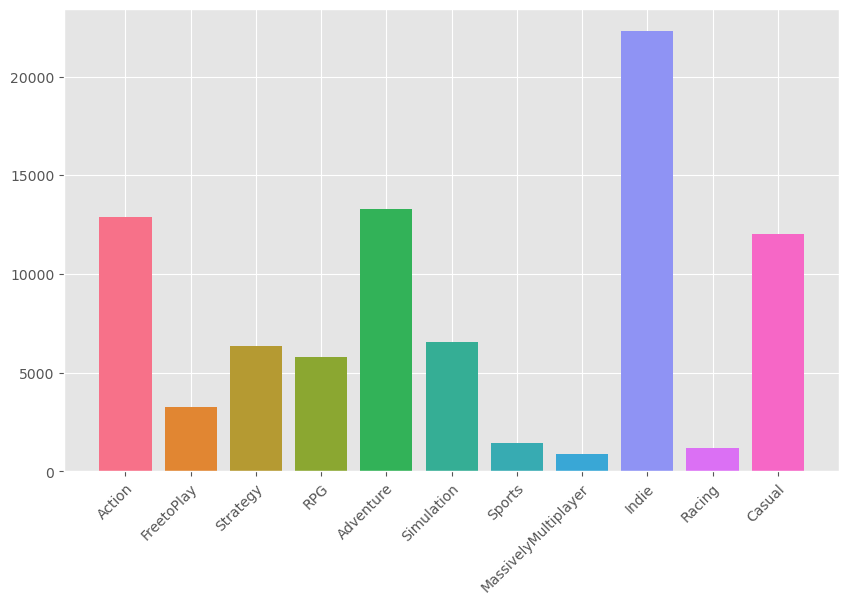

In [44]:
idx = np.arange(len(genres_counter))
palette = sns.color_palette("husl", len(genres_counter))

plt.bar(idx, list(genres_counter.values()), color=palette)
plt.xticks(idx, list(genres_counter.keys()),rotation=45,ha='right', rotation_mode='anchor')
plt.show()

As we can see Indie is the most dominant, followed by Action and Adventure with Casual being very close.

## **User Tags distribution**
<a id='User tags distribution'></a>

In [45]:
all_user_tags = list()
for game in gData['user_tags']:
    for g in game:
        all_user_tags.append(g)
        
user_tags_counter = Counter(all_user_tags)

print("how many diffrent user tags there are:",len(user_tags_counter))
user_tags_counter

how many diffrent user tags there are: 441


Counter({'FPS': 2094,
         'Shooter': 3227,
         'Multiplayer': 4772,
         'Competitive': 559,
         'Action': 13759,
         'Team-Based': 473,
         'eSports': 240,
         'Tactical': 1463,
         'First-Person': 4087,
         'PvP': 1659,
         'OnlineCo-Op': 1273,
         'Co-op': 2468,
         'Strategy': 7071,
         'Military': 731,
         'War': 992,
         'Difficult': 3379,
         'Trading': 208,
         'Realistic': 1708,
         'Fast-Paced': 989,
         'Moddable': 462,
         'FreetoPlay': 3444,
         'MOBA': 114,
         'RTS': 882,
         'TowerDefense': 648,
         'RPG': 6315,
         'Fantasy': 3884,
         'CharacterCustomization': 1336,
         'ReplayValue': 1292,
         'ActionRPG': 1274,
         'Simulation': 7189,
         'Souls-like': 433,
         'DarkFantasy': 917,
         'OpenWorld': 2501,
         'ThirdPerson': 2354,
         'Singleplayer': 17498,
         'Violent': 2160,
         'Atmospheri

In [46]:
user_tags_counter_l= user_tags_counter.most_common()

In [47]:
utc = dict(user_tags_counter_l)

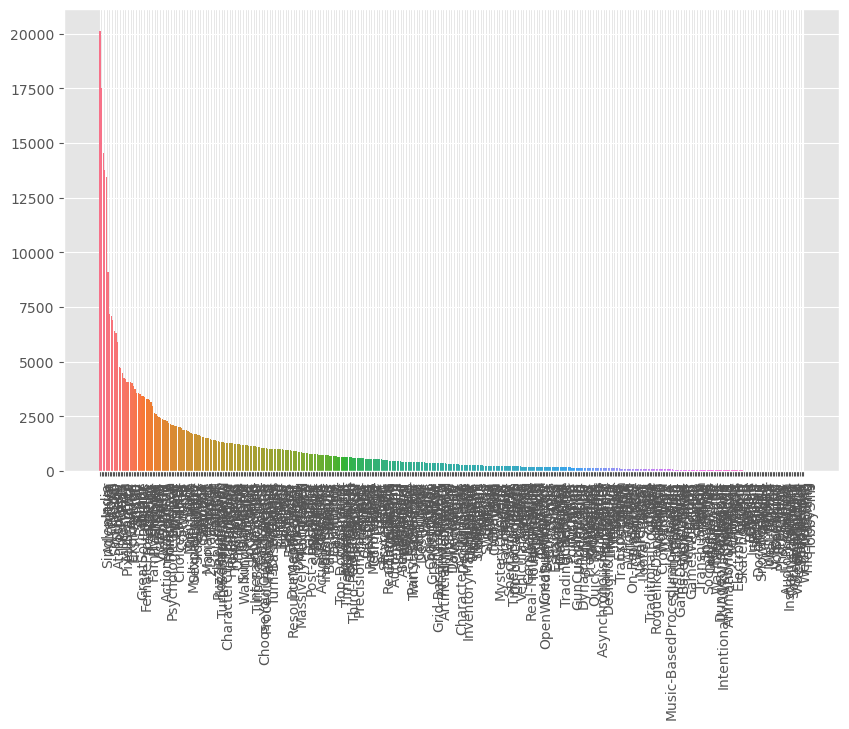

In [48]:

idx = np.arange(len(utc))
palette = sns.color_palette("husl", len(utc))

plt.bar(idx, list(utc.values()), color=palette)
plt.xticks(idx, list(utc.keys()),rotation=90,ha='right', rotation_mode='anchor')
plt.show()

As we can see there are too many type of user tags, so we will only show the top 50 on a bar plot

In [49]:
utc

{'Indie': 20117,
 'Singleplayer': 17498,
 'Adventure': 14540,
 'Action': 13759,
 'Casual': 13424,
 '2D': 9093,
 'Simulation': 7189,
 'Strategy': 7071,
 'Atmospheric': 6889,
 'Puzzle': 6406,
 'RPG': 6315,
 'StoryRich': 5888,
 'Multiplayer': 4772,
 'PixelGraphics': 4713,
 'Cute': 4476,
 'Colorful': 4250,
 'Exploration': 4203,
 'First-Person': 4087,
 '3D': 4082,
 'Anime': 4069,
 'Funny': 4029,
 'Fantasy': 3884,
 'Horror': 3755,
 'GreatSoundtrack': 3581,
 'Arcade': 3567,
 'FemaleProtagonist': 3542,
 'FreetoPlay': 3444,
 'Retro': 3430,
 'Difficult': 3379,
 'FamilyFriendly': 3298,
 'Platformer': 3295,
 'Shooter': 3227,
 'Sci-fi': 3137,
 'Relaxing': 2984,
 'VisualNovel': 2646,
 'Comedy': 2587,
 'OpenWorld': 2501,
 'Co-op': 2468,
 'Action-Adventure': 2416,
 'Point&Click': 2368,
 'ThirdPerson': 2354,
 'PsychologicalHorror': 2317,
 'Survival': 2291,
 'Mystery': 2196,
 'Violent': 2160,
 'FPS': 2094,
 'ChoicesMatter': 2084,
 'Stylized': 2079,
 'Controller': 2064,
 'Gore': 2014,
 'VR': 2011,
 'Dark

In [50]:

key_list=list()
for key in islice(utc, 50):
    print (key, utc[key])
    key_list.append(utc[key])
    
utc_slice=dict(zip(islice(utc, 50),key_list))    

Indie 20117
Singleplayer 17498
Adventure 14540
Action 13759
Casual 13424
2D 9093
Simulation 7189
Strategy 7071
Atmospheric 6889
Puzzle 6406
RPG 6315
StoryRich 5888
Multiplayer 4772
PixelGraphics 4713
Cute 4476
Colorful 4250
Exploration 4203
First-Person 4087
3D 4082
Anime 4069
Funny 4029
Fantasy 3884
Horror 3755
GreatSoundtrack 3581
Arcade 3567
FemaleProtagonist 3542
FreetoPlay 3444
Retro 3430
Difficult 3379
FamilyFriendly 3298
Platformer 3295
Shooter 3227
Sci-fi 3137
Relaxing 2984
VisualNovel 2646
Comedy 2587
OpenWorld 2501
Co-op 2468
Action-Adventure 2416
Point&Click 2368
ThirdPerson 2354
PsychologicalHorror 2317
Survival 2291
Mystery 2196
Violent 2160
FPS 2094
ChoicesMatter 2084
Stylized 2079
Controller 2064
Gore 2014


In [51]:
utc_slice

{'Indie': 20117,
 'Singleplayer': 17498,
 'Adventure': 14540,
 'Action': 13759,
 'Casual': 13424,
 '2D': 9093,
 'Simulation': 7189,
 'Strategy': 7071,
 'Atmospheric': 6889,
 'Puzzle': 6406,
 'RPG': 6315,
 'StoryRich': 5888,
 'Multiplayer': 4772,
 'PixelGraphics': 4713,
 'Cute': 4476,
 'Colorful': 4250,
 'Exploration': 4203,
 'First-Person': 4087,
 '3D': 4082,
 'Anime': 4069,
 'Funny': 4029,
 'Fantasy': 3884,
 'Horror': 3755,
 'GreatSoundtrack': 3581,
 'Arcade': 3567,
 'FemaleProtagonist': 3542,
 'FreetoPlay': 3444,
 'Retro': 3430,
 'Difficult': 3379,
 'FamilyFriendly': 3298,
 'Platformer': 3295,
 'Shooter': 3227,
 'Sci-fi': 3137,
 'Relaxing': 2984,
 'VisualNovel': 2646,
 'Comedy': 2587,
 'OpenWorld': 2501,
 'Co-op': 2468,
 'Action-Adventure': 2416,
 'Point&Click': 2368,
 'ThirdPerson': 2354,
 'PsychologicalHorror': 2317,
 'Survival': 2291,
 'Mystery': 2196,
 'Violent': 2160,
 'FPS': 2094,
 'ChoicesMatter': 2084,
 'Stylized': 2079,
 'Controller': 2064,
 'Gore': 2014}

## **User Tags distribution of Top 50**
<a id='Top 50 user tags distribution'></a>

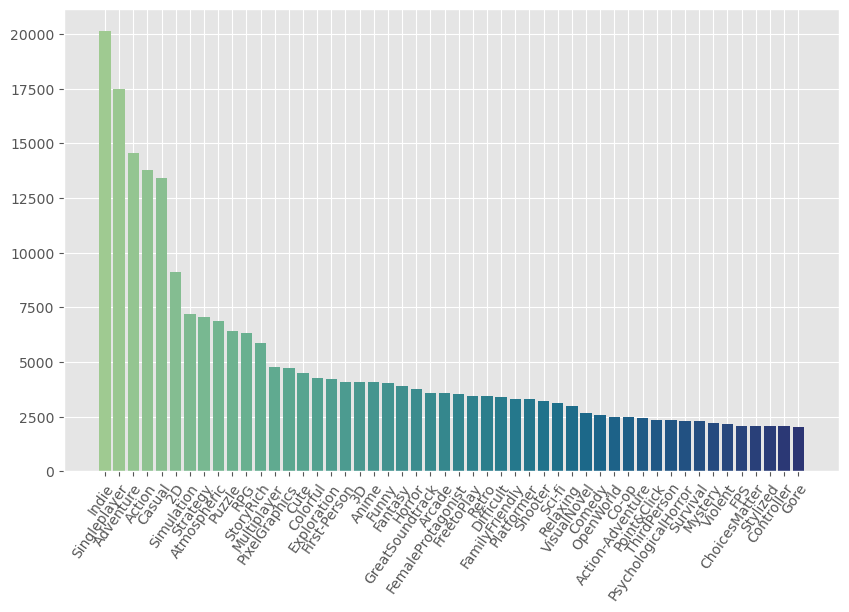

In [52]:
idx = np.arange(len(utc_slice))
palette = sns.color_palette("crest", len(utc_slice))

plt.bar(idx, list(utc_slice.values()), color=palette)
plt.xticks(idx, list(utc_slice.keys()),rotation=55,ha='right', rotation_mode='anchor')
plt.show()

Here we can see that from the top 50 user tags the most dominant one is Indie, similar to our genres bar plot

## **Languages distribution**
<a id='Language distribution'></a>

In [53]:
all_languages = list()
for game in gData['languages']:
    for g in game:
        all_languages.append(g)
        
languages_counter = Counter(all_languages)

print("how many diffrent laguages there are:",len(languages_counter))
languages_counter

how many diffrent laguages there are: 108


Counter({'English': 31454,
         'Czech': 1710,
         'Danish': 1154,
         'Dutch': 2214,
         'Finnish': 1083,
         'French': 10101,
         'German': 10519,
         'Hungarian': 1335,
         'Italian': 7259,
         'Japanese': 8046,
         'Korean': 5035,
         'Norwegian': 1072,
         'Polish': 4220,
         'Portuguese-Portugal': 2722,
         'Portuguese-Brazil': 5217,
         'Romanian': 937,
         'Russian': 9491,
         'SimplifiedChinese': 9197,
         'Spanish-Spain': 9297,
         'Swedish': 1395,
         'Thai': 1159,
         'TraditionalChinese': 4800,
         'Turkish': 2603,
         'Bulgarian': 791,
         'Ukrainian': 1351,
         'Greek': 903,
         'Spanish-LatinAmerica': 2023,
         'Vietnamese': 731,
         'Arabic': 1200,
         'Hindi': 122,
         'Latvian': 104,
         'Lithuanian': 103,
         'Slovak': 134,
         'Malay': 108,
         'Belarusian': 120,
         'Catalan': 130,
         'K

In [54]:
languages_counter_l= languages_counter.most_common()
langCounter = dict(languages_counter_l)

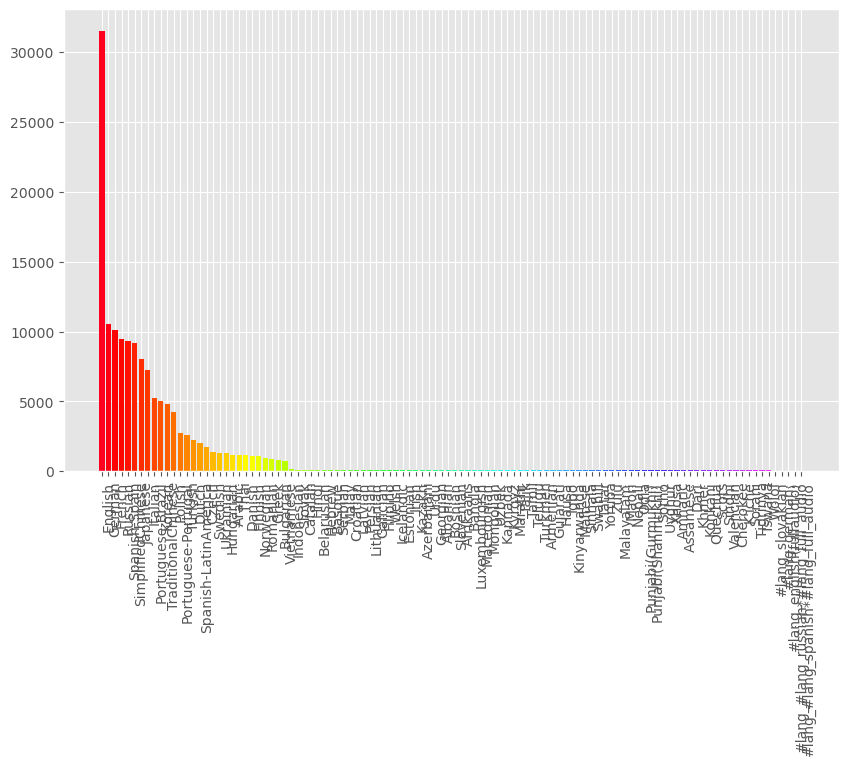

In [55]:

idx = np.arange(len(langCounter))
palette = sns.color_palette("gist_rainbow", len(langCounter))

plt.bar(idx, list(langCounter.values()), color=palette)
plt.xticks(idx, list(langCounter.keys()),rotation=90,ha='right', rotation_mode='anchor')
plt.show()

In [56]:
key_list=list()
for key in islice(langCounter, 50):
    print (key, langCounter[key])
    key_list.append(langCounter[key])
    
langCounter_slice=dict(zip(islice(langCounter, 50),key_list))    

English 31454
German 10519
French 10101
Russian 9491
Spanish-Spain 9297
SimplifiedChinese 9197
Japanese 8046
Italian 7259
Portuguese-Brazil 5217
Korean 5035
TraditionalChinese 4800
Polish 4220
Portuguese-Portugal 2722
Turkish 2603
Dutch 2214
Spanish-LatinAmerica 2023
Czech 1710
Swedish 1395
Ukrainian 1351
Hungarian 1335
Arabic 1200
Thai 1159
Danish 1154
Finnish 1083
Norwegian 1072
Romanian 937
Greek 903
Bulgarian 791
Vietnamese 731
Indonesian 147
Slovak 134
Catalan 130
Hindi 122
Belarusian 120
Hebrew 118
Basque 115
Serbian 110
Malay 108
Croatian 105
Latvian 104
Persian 104
Lithuanian 103
Galician 102
Filipino 101
Welsh 101
Icelandic 101
Estonian 100
Irish 99
Kazakh 98
Azerbaijani 98


## **Languages distribution of Top 50**
<a id='Top 50 language distribution'></a>

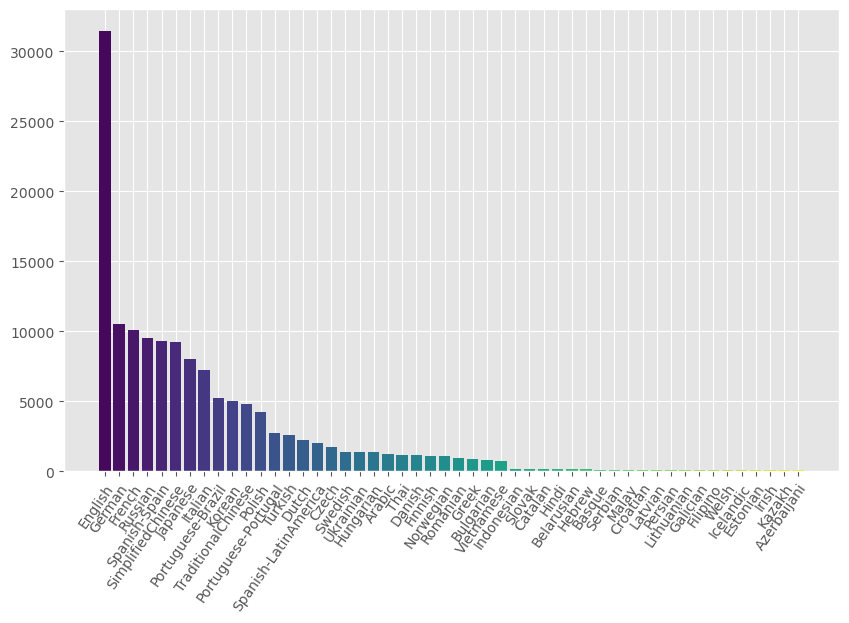

In [57]:
idx = np.arange(len(langCounter_slice))
palette = sns.color_palette("viridis", len(langCounter_slice))

plt.bar(idx, list(langCounter_slice.values()), color=palette)
plt.xticks(idx, list(langCounter_slice.keys()),rotation=55,ha='right', rotation_mode='anchor')
plt.show()

In [58]:
revType_uniq = get_possible_options_set(gData,"reviews_type")
revType_uniq

['Mixed',
 'OverwhelminglyNegative',
 'Positive',
 'OverwhelminglyPositive',
 'VeryPositive',
 'MostlyPositive',
 'VeryNegative',
 'Negative',
 'MostlyNegative']

<a id='conversion of review type to numeric'></a>
Here we are converting the review_type to a numeric value that we've decided upon. It'll help us later.

In [59]:
revType={
    "OverwhelminglyNegative":1 ,
    'MostlyNegative':2,
    "VeryNegative":3,
    "Negative":4,
    "Mixed":5,    
    "Positive":6,
    "VeryPositive":7,
    'MostlyPositive':8,
    "OverwhelminglyPositive":9
}

In [60]:
newRevType= list()
for game in gData["reviews_type"]:
    newRevType.append(revType[game[0]])
gCopy = gData.copy()
gCopy["reviews_type"]=newRevType    
gCopy["reviews_type"]

0        7
1        7
2        7
3        7
4        5
        ..
31449    4
31450    4
31451    6
31452    6
31453    6
Name: reviews_type, Length: 31454, dtype: int64

## **Scater plot of reviews to games**
<a id='Scater plot of reviews to games'></a>

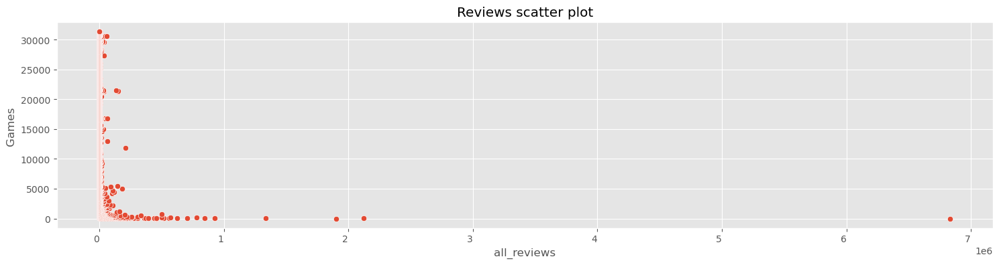

In [61]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy,y=range(0,len(gCopy['all_reviews'])),x='all_reviews', ax=ax)
f.set_title("Reviews scatter plot")
f.set_ylabel("Games ")
plt.xticks(rotation=0, ha='right', rotation_mode='anchor')
plt.show()

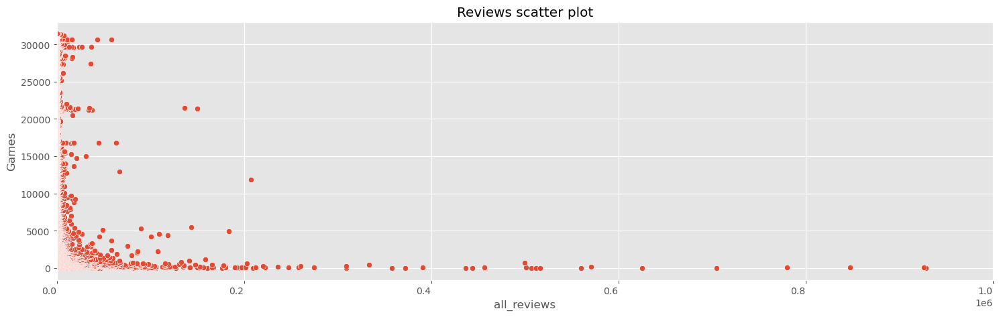

In [62]:
fig, ax = plt.subplots(figsize=(18, 5))
f = sns.scatterplot(data=gCopy,y=range(0,len(gCopy['all_reviews'])),x='all_reviews', ax=ax)
f.set_title("Reviews scatter plot")
f.set_ylabel("Games")
f.set_xlim(0, 1000000)
plt.xticks(rotation=0, ha='right', rotation_mode='anchor')
plt.show()


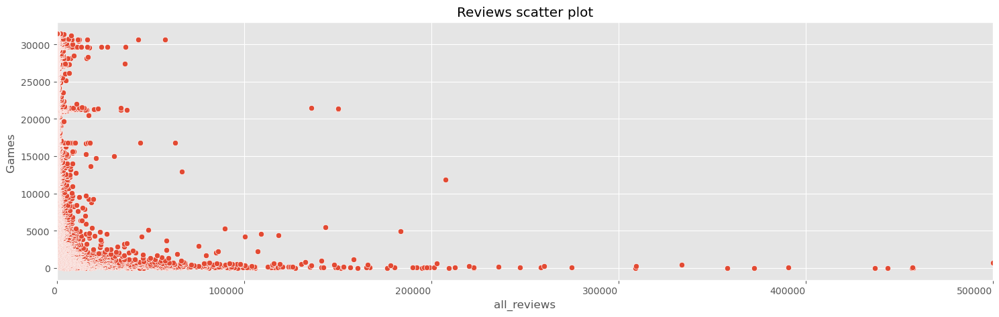

In [63]:
fig, ax = plt.subplots(figsize=(18, 5))
f = sns.scatterplot(data=gCopy,y=range(0,len(gCopy['all_reviews'])),x='all_reviews', ax=ax)
f.set_title("Reviews scatter plot")
f.set_ylabel("Games ")
f.set_xlim(0, 500000)
plt.xticks(rotation=0, ha='right', rotation_mode='anchor')
plt.show()


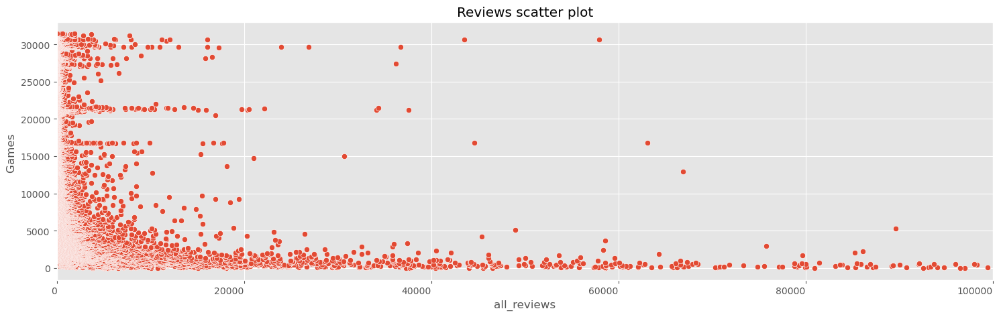

In [64]:
fig, ax = plt.subplots(figsize=(18, 5))
f = sns.scatterplot(data=gCopy,y=range(0,len(gCopy['all_reviews'])),x='all_reviews', ax=ax)
f.set_title("Reviews scatter plot")
f.set_ylabel("Games ")
f.set_xlim(0, 100000)
plt.xticks(rotation=0, ha='right', rotation_mode='anchor')
plt.show()


In [65]:
gCopy.describe()

,all_reviews,reviews_type,awards,price
count,3.145400e+04,31454.000000,31454.000000,31454.000000
mean,2.376562e+03,6.360876,0.147803,34.078233
std,4.618867e+04,1.382366,0.354910,39.493417
min,1.000000e+01,1.000000,0.000000,0.000000
25%,2.200000e+01,5.000000,0.000000,7.250000
50%,6.400000e+01,7.000000,0.000000,21.950000
75%,3.070000e+02,7.000000,0.000000,47.950000
max,6.833486e+06,9.000000,1.000000,749.950000


## **Review Type to Awards**
<a id='Review type to awards'></a>
eda that might help us later with the prediction model

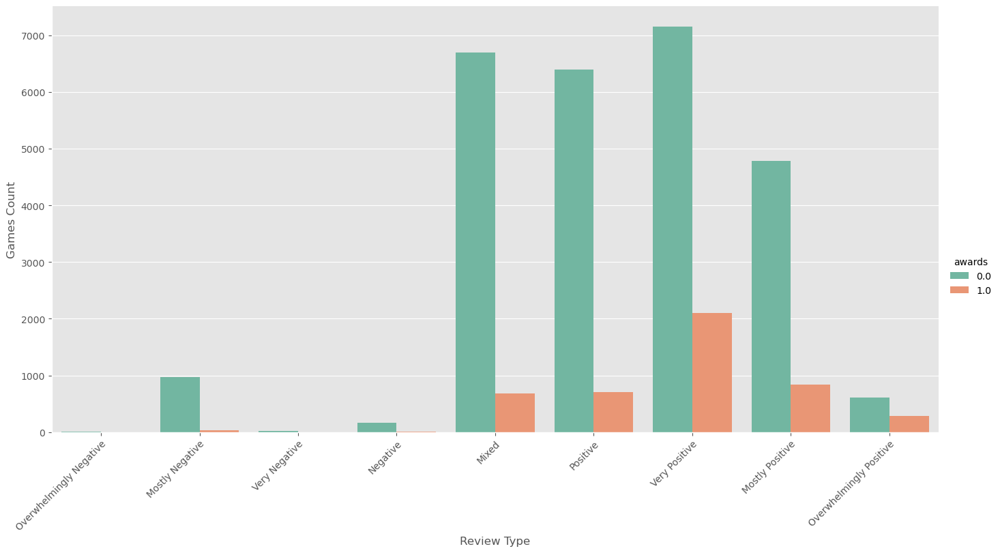

In [66]:

fg = sns.catplot(kind='count', data=gCopy,x='reviews_type', hue='awards', palette='Set2', height=7, aspect=2)
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
fg.set_axis_labels("Review Type", "Games Count")
fg.set_xticklabels(   ["Overwhelmingly Negative",
    'Mostly Negative',
    "Very Negative",
    "Negative",
    "Mixed",    
    "Positive",
    "Very Positive",
    'Mostly Positive',
    "Overwhelmingly Positive"])
fg.set_titles("{col_name} {col_var}")

plt.show()

## **Reviews Amount to Price**
<a id='Reviews amount to price'></a>
Trying to check if there is any correlation between the two and if there are any outliers to remove later on.

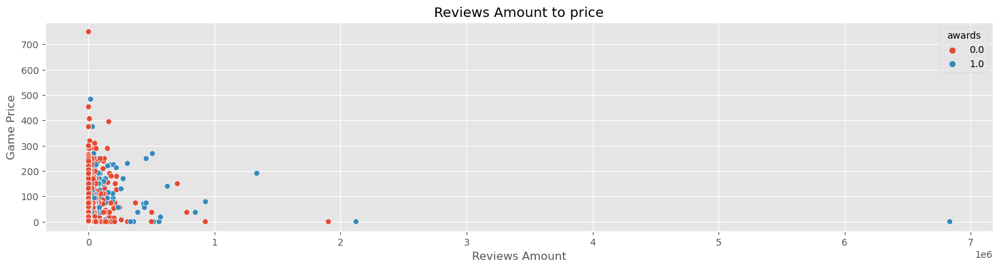

In [67]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
plt.show()

**going deeper in the resolution**


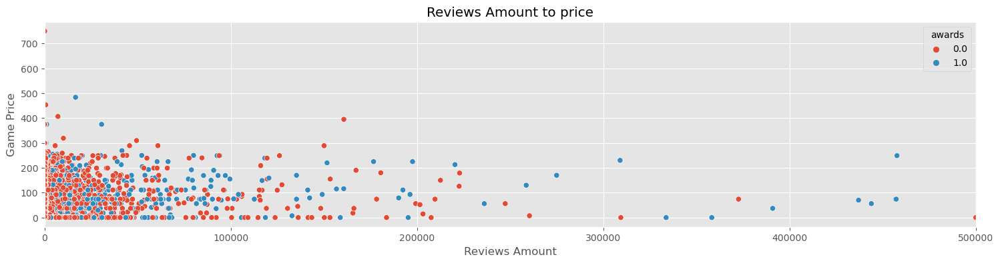

In [68]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
f.set_xlim(0,500000)
plt.show()

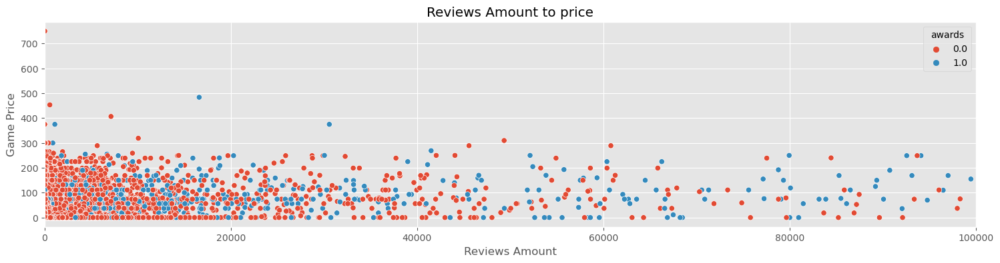

In [69]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
f.set_xlim(0,100000)
plt.show()

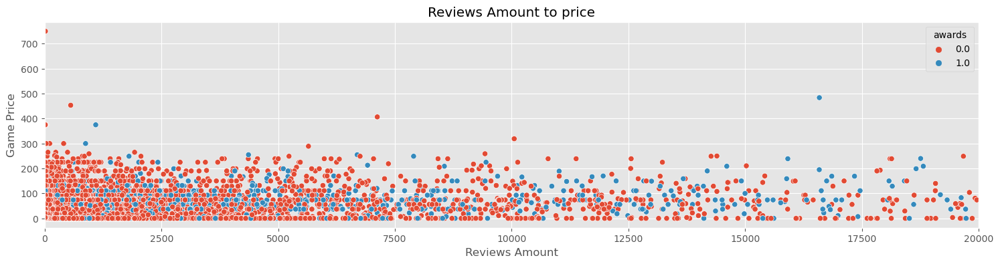

In [70]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
f.set_xlim(0,20000)
plt.show()

**we can see that there are not alot of games below 5k reviews with awards**

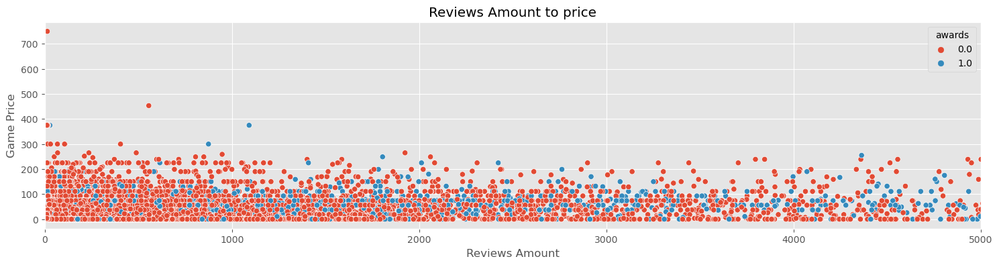

In [71]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
f.set_xlim(0,5000)
plt.show()

**<p>now we can see that there are more games that won awards with more then 5k reviews</p>
compared to those with below 5k reviews**


In [73]:
print("amount of games below 5k reviews:{}".format(len(gCopy[gCopy["all_reviews"]<5000])))
print("amount of games below 5k reviews with awards:{}".format(len(gCopy[gCopy["all_reviews"]<5000][gCopy[gCopy["all_reviews"]<5000]["awards"]==1])))

print("amount of games below 3k reviews:{}".format(len(gCopy[gCopy["all_reviews"]<3000])))
print("amount of games below 3k reviews with awards:{}".format(len(gCopy[gCopy["all_reviews"]<3000][gCopy[gCopy["all_reviews"]<3000]["awards"]==1])))

print("amount of games below 2k reviews:{}".format(len(gCopy[gCopy["all_reviews"]<2000])))
print("amount of games below 2k reviews with awards:{}".format(len(gCopy[gCopy["all_reviews"]<2000][gCopy[gCopy["all_reviews"]<2000]["awards"]==1])))

print("amount of games below 1k reviews:{}".format(len(gCopy[gCopy["all_reviews"]<1000])))
print("amount of games below 1k reviews with awards:{}".format(len(gCopy[gCopy["all_reviews"]<1000][gCopy[gCopy["all_reviews"]<1000]["awards"]==1])))

print("amount of games with more then 5k reviews:{}".format(len(gCopy[gCopy["all_reviews"]>5000])))
print("amount of games with more then 5k reviews with awards:{}".format(len(gCopy[gCopy["all_reviews"]>5000][gCopy[gCopy["all_reviews"]>5000]["awards"]==1])))

print("amount of games with more then 10k reviews:{}".format(len(gCopy[gCopy["all_reviews"]>10000])))
print("amount of games with more then 10k reviews with awards:{}".format(len(gCopy[gCopy["all_reviews"]>10000][gCopy[gCopy["all_reviews"]>10000]["awards"]==1])))

print("amount of games with more then 20k reviews:{}".format(len(gCopy[gCopy["all_reviews"]>20000])))
print("amount of games with more then 20k reviews with awards:{}".format(len(gCopy[gCopy["all_reviews"]>20000][gCopy[gCopy["all_reviews"]>20000]["awards"]==1])))

print("amount of games with more then 40k reviews:{}".format(len(gCopy[gCopy["all_reviews"]>40000])))
print("amount of games with more then 40k reviews with awards:{}".format(len(gCopy[gCopy["all_reviews"]>40000][gCopy[gCopy["all_reviews"]>40000]["awards"]==1])))

print("amount of games with more then 100k reviews:{}".format(len(gCopy[gCopy["all_reviews"]>100000])))
print("amount of games with more then 100k reviews with awards:{}".format(len(gCopy[gCopy["all_reviews"]>100000][gCopy[gCopy["all_reviews"]>100000]["awards"]==1])))


amount of games below 5k reviews:29879
amount of games below 5k reviews with awards:4101
amount of games below 3k reviews:29277
amount of games below 3k reviews with awards:3935
amount of games below 2k reviews:28642
amount of games below 2k reviews with awards:3751
amount of games below 1k reviews:27226
amount of games below 1k reviews with awards:3408
amount of games with more then 5k reviews:1574
amount of games with more then 5k reviews with awards:548
amount of games with more then 10k reviews:937
amount of games with more then 10k reviews with awards:365
amount of games with more then 20k reviews:529
amount of games with more then 20k reviews with awards:226
amount of games with more then 40k reviews:291
amount of games with more then 40k reviews with awards:136
amount of games with more then 100k reviews:105
amount of games with more then 100k reviews with awards:48


As we can see below 5k reviews the percentage of award winning games compared to the rest of the games are somewhere close to 14%. <br>As we can see above 5k reviews the percentage of award winning games compared to the rest of the games are somewhere close to 35%.<br>As we can see above 100k reviews the percentage of award winning games compared to the rest of the games are somewhere close to 46%.<br>
**There might be a connection between having more reviews and winning awards?**

In [74]:
gCopy[gCopy["all_reviews"]<1000][gCopy[gCopy["all_reviews"]<1000]["awards"]==1]

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
200,[A Little to the Left],"[Casual, Indie]",[SecretMode],[MaxInferno],[SecretMode],"[8Nov, 2022]","[Wholesome, Puzzle, Casual, Relaxing, Cute, Fu...",949.0,7,1.0,55.95,"[Single-player, SteamAchievements, Fullcontrol...","[English, French, Italian, German, Spanish-Spa...","[win, mac]"
556,[Demeo: PC Edition],"[Adventure, Indie, RPG, Strategy]",[ResolutionGames],[ResolutionGames],[ResolutionGames],"[15Dec, 2022]","[Adventure, Tabletop, RPG, Roguelite, Strategy...",371.0,7,1.0,110.95,"[Single-player, OnlineCo-op, Cross-PlatformMul...","[English, French, German, Spanish-Spain, Japan...",[win]
573,[KeyWe],"[Casual, Indie]",[FireshineGames],[Stonewheat&Sons],[FireshineGames],"[31Aug, 2021]","[PuzzlePlatformer, Co-op, Cute, Casual, Indie,...",626.0,7,1.0,92.95,"[Single-player, OnlineCo-op, Shared/SplitScree...","[English, French, Italian, German, Spanish-Spa...",[win]
600,[GigaBash],"[Action, Casual, Indie]",[noFranchise],[PassionRepublicGames],[PassionRepublicGames],"[4Aug, 2022]","[Superhero, Action, Fighting, Party, 4PlayerLo...",544.0,7,1.0,131.95,"[Single-player, OnlinePvP, Shared/SplitScreenP...","[English, French, Italian, German, Spanish-Spa...",[win]
620,[The Entropy Centre],[Adventure],[Playstack],[StubbyGames],[Playstack],"[3Nov, 2022]","[Adventure, Puzzle, Sci-fi, StoryRich, First-P...",959.0,7,1.0,92.95,"[Single-player, SteamAchievements, Fullcontrol...","[English, French, Italian, German, Spanish-Spa...",[win]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31321,[Bone Voyage],"[Adventure, FreetoPlay, Indie]",[noFranchise],[TeamCobblestone],[BredaUniversityofAppliedSciences],"[24Jun, 2019]","[FreetoPlay, Adventure, Indie, Singleplayer, T...",349.0,5,1.0,0.00,"[Single-player, PartialControllerSupport, Stea...",[English],[win]
31322,"[1,000 Heads Among the Trees]",[Indie],[noFranchise],[AaronOldenburg],[KISSltd],"[11Dec, 2015]","[Indie, Horror, Adventure]",39.0,5,1.0,18.50,"[Single-player, SteamAchievements, SteamTradin...",[English],"[win, mac]"
31333,"[Ortus Arena, strategy board game online, FOR ...","[Casual, Indie, Strategy]",[noFranchise],[FirebrushStudios],[PlugInDigital],"[28Sep, 2016]","[BoardGame, Strategy, Indie, Casual, Tabletop,...",40.0,5,1.0,0.00,"[Single-player, OnlinePvP, Cross-PlatformMulti...",[English],[win]
31355,[Electro Ride Prologue],"[Action, Casual, FreetoPlay, Indie, Racing, Si...",[ForestlightGames],[SylwesterOsik],[ForestlightGames],"[30May, 2020]","[Racing, Action, Casual, Sports, Indie, Simula...",175.0,5,1.0,0.00,"[Single-player, Fullcontrollersupport, SteamCl...","[English, French, Italian, German, Spanish-Spa...","[win, linux]"


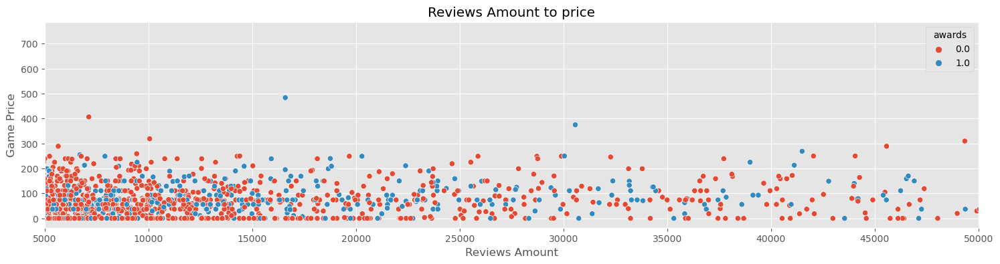

In [75]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
f.set_xlim(5000,50000)
plt.show()

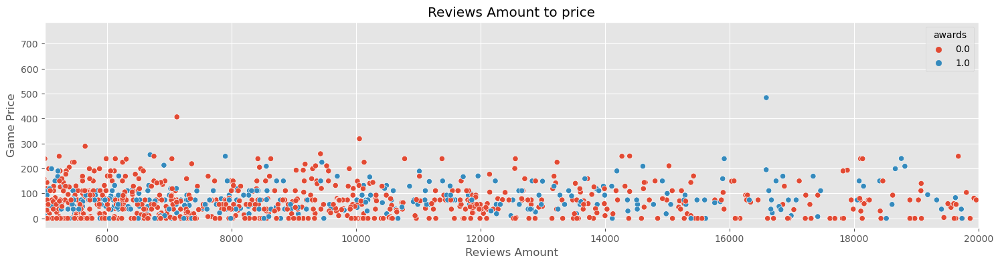

In [76]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
f.set_xlim(5000,20000)
plt.show()

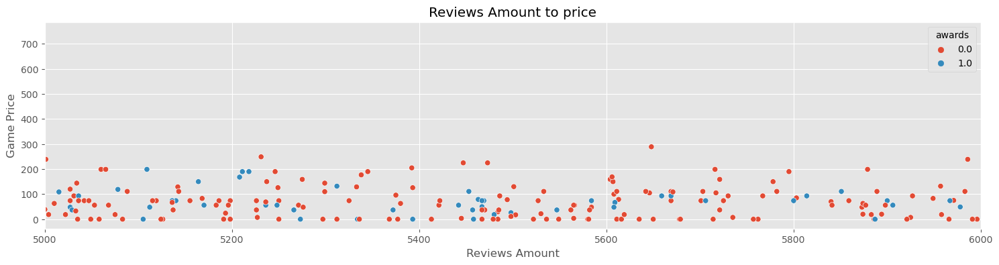

In [77]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
f.set_xlim(5000,6000)
plt.show()

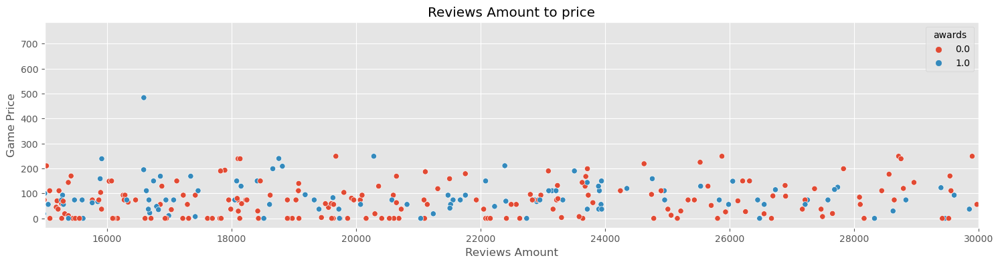

In [78]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
f.set_xlim(15000,30000)
plt.show()

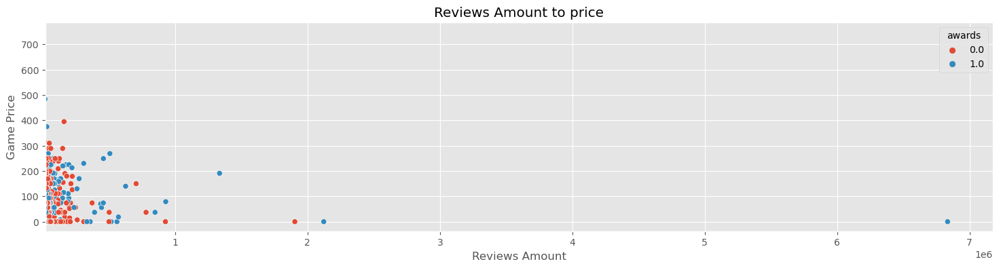

In [79]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
f.set_xlim(20000,)
plt.show()

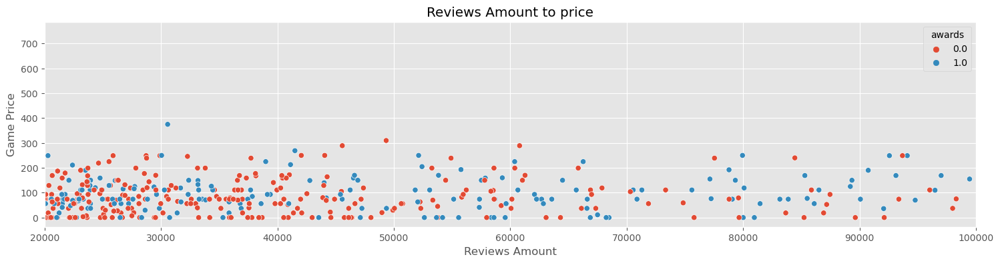

In [80]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
f.set_xlim(20000,100000)
plt.show()

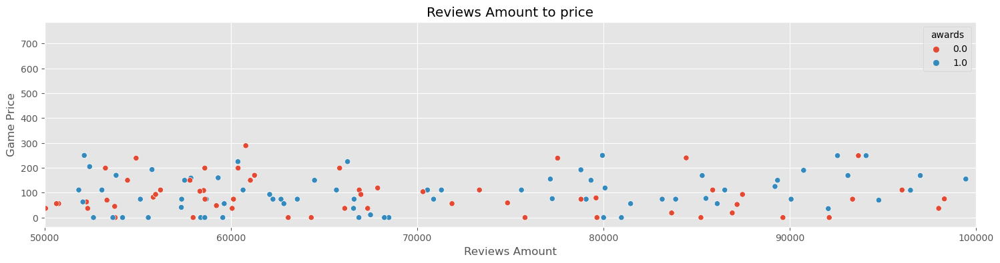

In [81]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.scatterplot(data=gCopy, x='all_reviews', y='price', hue='awards', ax=ax)
f.set_title("Reviews Amount to price")
f.set_xlabel("Reviews Amount")
f.set_ylabel("Game Price")
f.set_xlim(50000,100000)
plt.show()

#### Game Price Histogram
<a id='Game price histogram'></a>

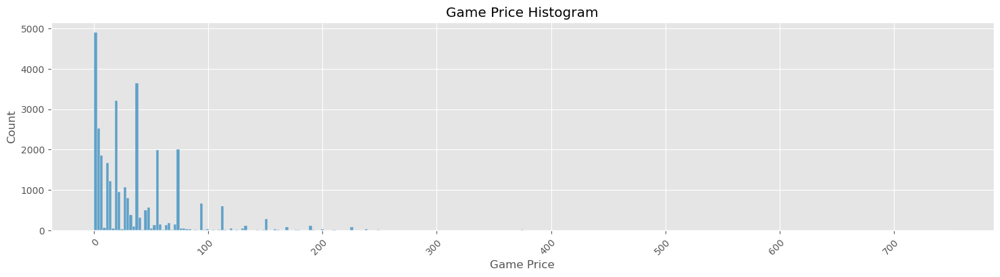

In [82]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.histplot(gCopy['price'], ax=ax)
f.set_title("Game Price Histogram")
f.set_xlabel("Game Price")
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.show()

We can see that there are a few games with absurd game prices. They might be OUTLIERS!

In [83]:
gCopy[gCopy['price']>300]

,game_name,genres,franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,languages,os_compatibility
4,[Call of Duty®: Modern Warfare® II],[Action],[CallofDuty],"[InfinityWard, RavenSoftware, Beenox, Treyarch...",[Activision],"[28Oct, 2022]","[FPS, Action, Shooter, Multiplayer, Military, ...",160623.0,5,0.0,395.00,"[Single-player, OnlinePvP, OnlineCo-op, Cross-...","[English, French, Italian, German, Spanish-Spa...",[win]
43,[FINAL FANTASY VII REMAKE INTERGRADE],"[Action, Adventure, RPG]",[FINALFANTASY],[SquareEnix],[SquareEnix],"[17Jun, 2022]","[RPG, ActionRPG, Action-Adventure, JRPG, Singl...",10055.0,7,0.0,319.00,"[Single-player, SteamAchievements, Fullcontrol...","[English, French, Italian, German, Spanish-Spa...",[win]
327,[Call to Arms - Gates of Hell: Ostfront],"[Action, Simulation, Strategy]",[noFranchise],"[BarbedwireStudios, Digitalmindsoft]",[Digitalmindsoft],"[11Jun, 2021]","[WorldWarII, Strategy, RealTimeTactics, RTS, H...",7122.0,7,0.0,406.70,"[Single-player, OnlinePvP, OnlineCo-op, SteamA...","[English, French, German, Spanish-Spain, Russi...",[win]
380,[Shadow of the Tomb Raider: Definitive Edition],"[Action, Adventure]",[TombRaider],"[Eidos-Montréal, CrystalDynamics, Nixxes, Fera...","[SquareEnix, FeralInteractive(Mac), Feralinter...","[14Sep, 2018]","[Adventure, Action, FemaleProtagonist, Singlep...",49338.0,7,0.0,309.85,"[Single-player, SteamAchievements, Fullcontrol...","[English, French, Italian, German, Spanish-Spa...","[win, mac, linux]"
734,[Just Cause 4 Reloaded],"[Action, Adventure]",[JustCause],[AvalancheStudios],[SquareEnix],"[4Dec, 2018]","[OpenWorld, Action, Destruction, Singleplayer,...",16591.0,5,1.0,483.80,"[Single-player, SteamAchievements, Fullcontrol...","[English, French, Italian, German, Spanish-Spa...",[win]
735,[HITMAN™ 2],[Action],[Hitman],[IOInteractiveA/S],[IOInteractiveA/S],"[13Nov, 2018]","[Stealth, Assassin, Action, Singleplayer, Thir...",30566.0,7,1.0,374.95,"[Single-player, OnlineCo-op, SteamAchievements...","[English, French, Italian, German, Spanish-Spa...",[win]
1081,[SAMURAI SHODOWN],[Action],[noFranchise],[SNKCORPORATION],[SNKCORPORATION],"[14Jun, 2021]","[Action, 2DFighter, 3D, PvP, Singleplayer, Mul...",555.0,8,0.0,453.35,"[Single-player, OnlinePvP, Shared/SplitScreenP...","[English, French, Italian, German, Spanish-Spa...",[win]
4392,[ChessBase 16 Steam Edition],[Strategy],[noFranchise],[ChessBaseGmbH],[ChessBaseGmbH],"[20Apr, 2021]","[Strategy, Chess, BoardGame, Tactical, 2D, 3D,...",27.0,6,0.0,374.95,[Single-player],"[English, French, Italian, German, Spanish-Spa...",[win]
6666,[Edna & Harvey: The Breakout],"[Adventure, Indie]",[noFranchise],[DaedalicEntertainment],[DaedalicEntertainment],"[25Oct, 2013]","[Point&Click, Adventure, Indie, Comedy, Single...",1091.0,7,1.0,374.95,"[SteamAchievements, SteamTradingCards, SteamCl...","[English, German, French, Russian, Traditional...",[win]
8655,[Last Village VIP Game],"[Action, Adventure]",[noFranchise],[AKStudio],[AKStudio],"[16Aug, 2021]","[Action, Action-Adventure, Shooter, HeroShoote...",27.0,6,1.0,374.95,"[Single-player, SteamAchievements, PartialCont...","[English, French, Italian, German, Spanish-Spa...","[win, linux]"


In [84]:
print(f"mean: {gCopy['price'].mean()}")
print(f"median: {gCopy['price'].median()}")

mean: 34.07823256818214
median: 21.95


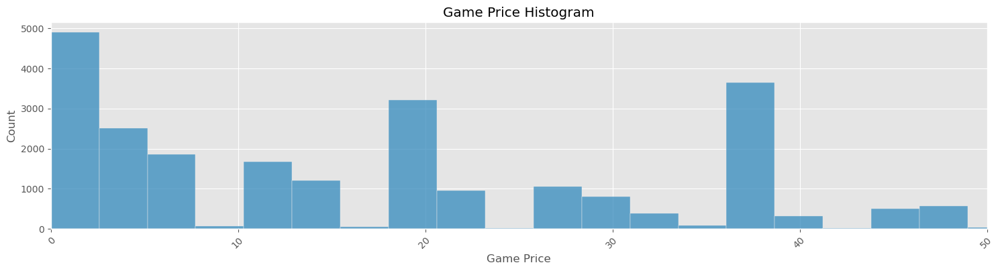

In [85]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.histplot(gCopy['price'], ax=ax)
f.set_title("Game Price Histogram")
f.set_xlabel("Game Price")
f.set_xlim(0,50)
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.show()

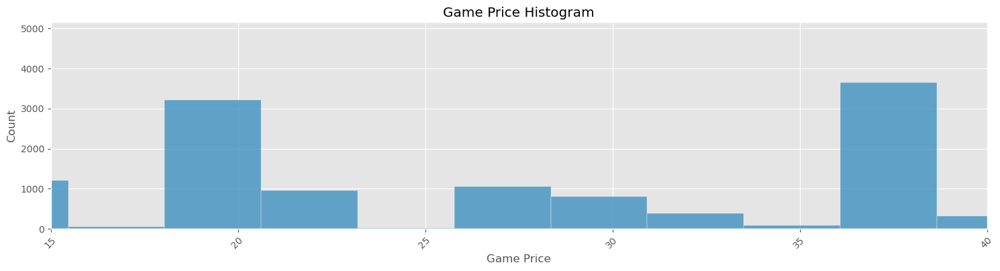

In [86]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.histplot(gCopy['price'], ax=ax)
f.set_title("Game Price Histogram")
f.set_xlabel("Game Price")
f.set_xlim(15,40)
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.show()

In [87]:
df_processed_copy=gCopy.copy()
df_processed_copy[['day_month', 'year']] = df_processed_copy['publication_date'].apply(pd.Series)
df_processed_copy["year"]=pd.to_numeric(df_processed_copy["year"])

In [127]:
##boxPlot for numberics
def display_numeric_boxplots(df, excluded):
    numeric_columns = df.select_dtypes(['float64', 'int64']).columns
    excluded = set(excluded)
    for col in numeric_columns:
        if col in excluded:
            continue
        sns.boxplot(x=df[col])
        plt.show()


In [91]:
df_processed_copy[df_processed_copy["year"]>2009].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30096 entries, 0 to 31453
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   game_name         30096 non-null  object 
 1   genres            30096 non-null  object 
 2   franchise         30096 non-null  object 
 3   developer         30096 non-null  object 
 4   publisher         30096 non-null  object 
 5   publication_date  30096 non-null  object 
 6   user_tags         30096 non-null  object 
 7   all_reviews       30096 non-null  float64
 8   reviews_type      30096 non-null  int64  
 9   awards            30096 non-null  float64
 10  price             30096 non-null  float64
 11  game_features     30096 non-null  object 
 12  languages         30096 non-null  object 
 13  os_compatibility  30096 non-null  object 
 14  day_month         30096 non-null  object 
 15  year              30096 non-null  float64
dtypes: float64(4), int64(1), object(11)
memo

In [101]:
gCount=0
gAwarded=0
gCount1=0
gAwarded1=0
for g in gCopy.index:
    if(len(gCopy.genres[g])<6):
        #print(gCopy.game_name[g])
        gCount = gCount +1
        if((gCopy.awards[g])==1):
            gAwarded = gAwarded+1
    if(len(gCopy.genres[g])>5):
        #print(gCopy.game_name[g])
        gCount1 = gCount1 +1
        if((gCopy.awards[g])==1):
            gAwarded1 = gAwarded1+1        
print("Number of games with less then 6 genres: {} \n Number of that got awards:{}".format(gCount,gAwarded))
print((gAwarded*100)/gCount)
print("Number of games with more then 5 genres: {} \n Number of that got awards:{}".format(gCount1,gAwarded1))
print((gAwarded1*100)/gCount1)

print(((gAwarded1+gAwarded)*100)/(gCount1+gCount))

Number of games with less then 6 genres: 30614 
 Number of that got awards:4559
14.891879532240152
Number of games with more then 5 genres: 840 
 Number of that got awards:90
10.714285714285714
14.780314109493228


<a id='Boxplots for price'></a>

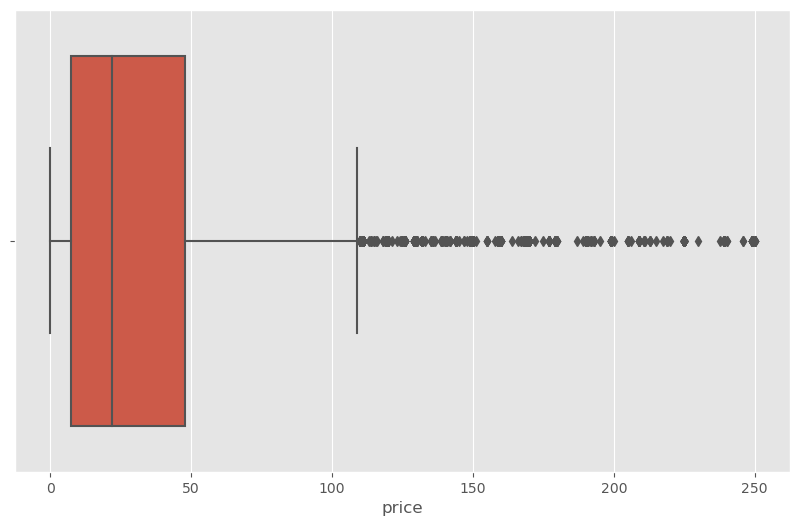

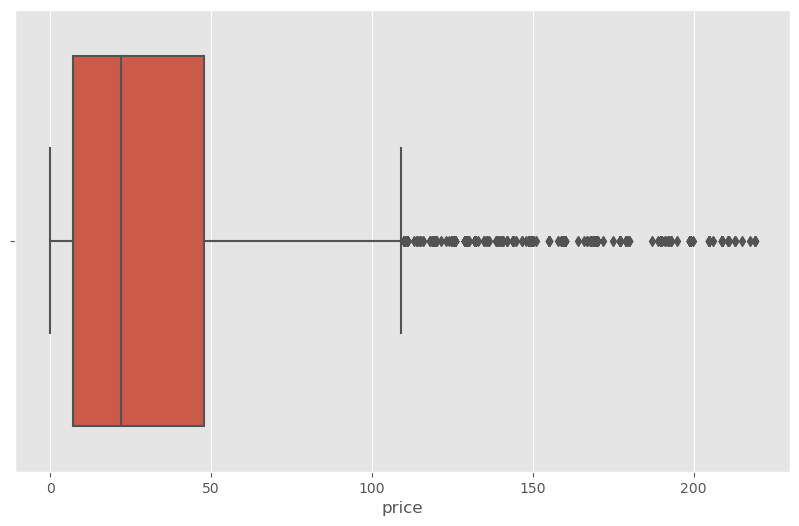

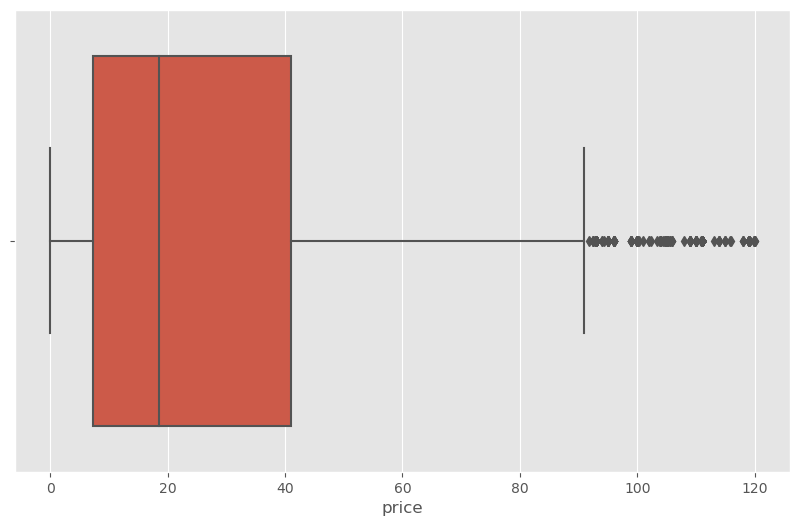

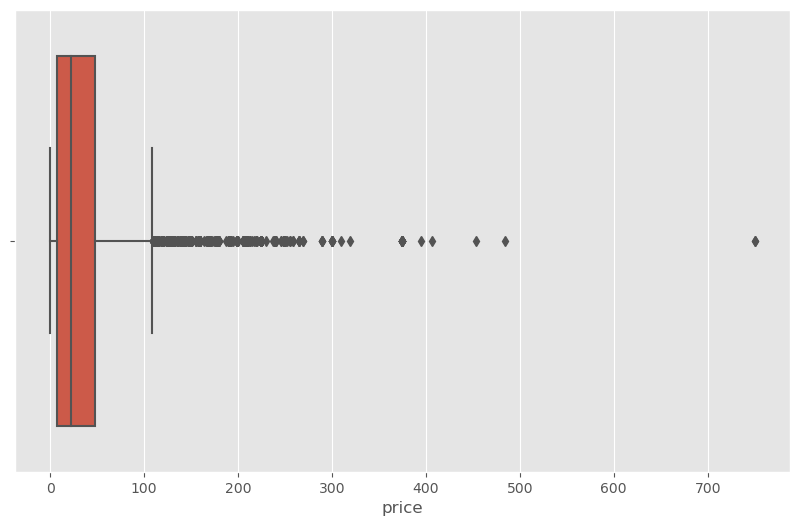

In [126]:
g250=gCopy[gCopy["price"]<250]
display_numeric_boxplots(g250, ["awards","reviews_type","year","all_reviews"])
g220=gCopy[gCopy["price"]<220]
display_numeric_boxplots(g220, ["awards","reviews_type","year","all_reviews"])
g120=gCopy[gCopy["price"]<120]
display_numeric_boxplots(g120, ["awards","reviews_type","year","all_reviews"])
display_numeric_boxplots(gCopy, ["awards","reviews_type","year","all_reviews"])

<a id='More game price histograms'></a>

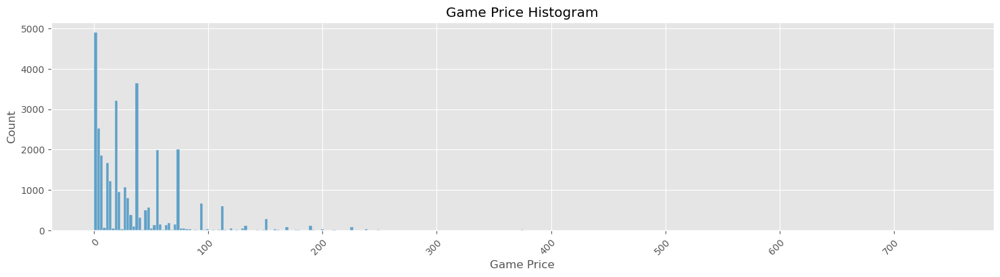

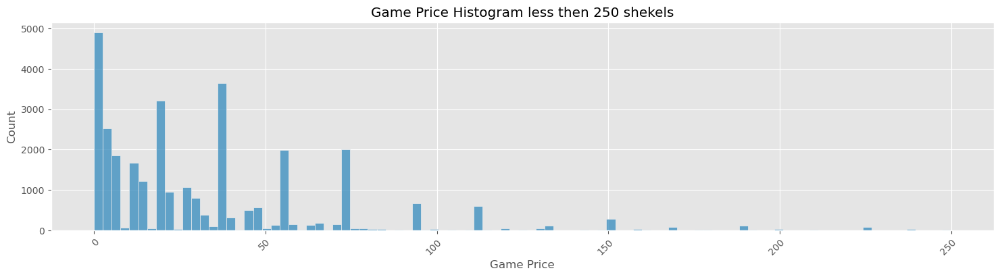

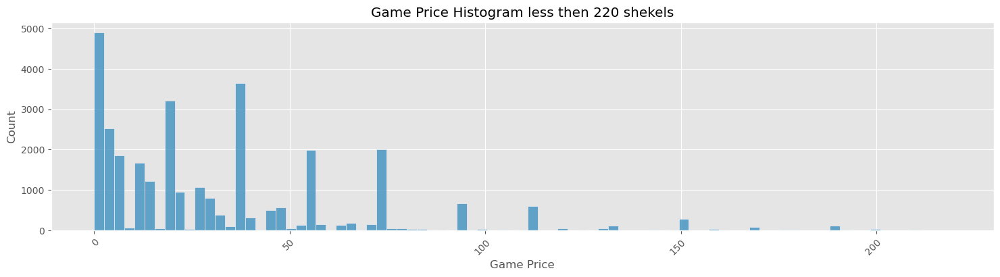

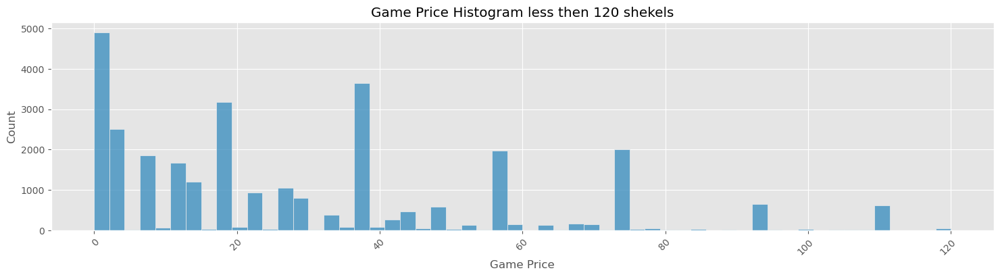

In [123]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.histplot(gCopy['price'], ax=ax)
f.set_title("Game Price Histogram")
f.set_xlabel("Game Price")
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.show()
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.histplot(g250['price'], ax=ax)
f.set_title("Game Price Histogram less then 250 shekels")
f.set_xlabel("Game Price")
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.show()
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.histplot(g220['price'], ax=ax)
f.set_title("Game Price Histogram less then 220 shekels")
f.set_xlabel("Game Price")
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.show()
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.histplot(g120['price'], ax=ax)
f.set_title("Game Price Histogram less then 120 shekels")
f.set_xlabel("Game Price")
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.show()

In [237]:
print("Amount of games that cost 250 and less shekels:{}".format(len(g250)))
print("Amount of games that cost more then 250 shekels:{}".format(len(gCopy[gCopy["price"]>250])))
print("Amount of games that cost 220 and less shekels:{}".format(len(g220)))
print("Amount of games that cost more then 220 shekels:{}".format(len(gCopy[gCopy["price"]>220])))
print("Amount of games that cost 120 and less shekels:{}".format(len(g120)))
print("Amount of games that cost more then 120 shekels:{}".format(len(gCopy[gCopy["price"]>120])))
gCopy[(gCopy["price"]>280)].describe()


Amount of games that cost 250 and less shekels:31407
Amount of games that cost more then 250 shekels:47
Amount of games that cost 220 and less shekels:31263
Amount of games that cost more then 220 shekels:190
Amount of games that cost 120 and less shekels:30356
Amount of games that cost more then 120 shekels:1084


,all_reviews,reviews_type,awards,price
count,36.000000,36.000000,36.000000,36.000000
mean,14995.111111,6.500000,0.138889,372.844444
std,37726.470564,0.971008,0.350736,104.527969
min,10.000000,5.000000,0.000000,289.000000
25%,13.000000,6.000000,0.000000,299.950000
50%,28.500000,6.500000,0.000000,374.950000
75%,6016.500000,7.000000,0.000000,374.950000
max,160623.000000,8.000000,1.000000,749.950000


We can see that there are a number of games that have too high cost, which don't make sense
when most games will cost at most 60$, so we will be removing them.

In [244]:
gCopy = gCopy[gCopy["price"]<280]
gCopy.describe()

,all_reviews,reviews_type,awards,price
count,3.141800e+04,31418.000000,31418.000000,31418.000000
mean,2.362103e+03,6.360717,0.147813,33.690061
std,4.619599e+04,1.382770,0.354921,37.652234
min,1.000000e+01,1.000000,0.000000,0.000000
25%,2.200000e+01,5.000000,0.000000,7.250000
50%,6.400000e+01,7.000000,0.000000,21.950000
75%,3.060000e+02,7.000000,0.000000,47.950000
max,6.833486e+06,9.000000,1.000000,269.000000


Because a game can support a lot of languages we've decided to add two new columns:<br>
english_support- 1 if it supports English and 0 if not.<br>supported_languages(number)- total number of languages a game can support. 

In [245]:
ngData=gCopy.copy()
loc = ngData.columns.get_loc("languages")+1

   
english_support_list = list()
supported_languages_list = list()
for game in ngData.index:
    english_support= ngData["languages"][game].count("English")
    supported_languages = len(ngData["languages"][game])
    english_support_list.append(english_support)
    supported_languages_list.append(supported_languages)

ngData.insert(loc, "english_support", english_support_list)
ngData.insert(loc+1, "supported_languages", supported_languages_list)    

In [246]:
print("How many games with no support for english: {}".format(len(ngData[ngData["english_support"]==0])))
print("How many games with support for more then 6 languages: {}".format(len(ngData[ngData["supported_languages"]>6])))
print("How many games with support for more then 10 languages: {}".format(len(ngData[ngData["supported_languages"]>10])))
print("Games with support for more then 100 languages: {}".format(len(ngData[ngData["supported_languages"]>100])))
ngData.describe()

How many games with no support for english: 0
How many games with support for more then 6 languages: 7336
How many games with support for more then 10 languages: 3561
Games with support for more then 100 languages: 82


,all_reviews,reviews_type,awards,price,english_support,supported_languages
count,3.141800e+04,31418.000000,31418.000000,31418.000000,31418.0,31418.000000
mean,2.362103e+03,6.360717,0.147813,33.690061,1.0,4.623942
std,4.619599e+04,1.382770,0.354921,37.652234,0.0,7.322095
min,1.000000e+01,1.000000,0.000000,0.000000,1.0,1.000000
25%,2.200000e+01,5.000000,0.000000,7.250000,1.0,1.000000
50%,6.400000e+01,7.000000,0.000000,21.950000,1.0,2.000000
75%,3.060000e+02,7.000000,0.000000,47.950000,1.0,6.000000
max,6.833486e+06,9.000000,1.000000,269.000000,1.0,103.000000


Adding new column total_features- the total features a game supports

In [248]:
ngData1 = ngData.copy()
loc = ngData1.columns.get_loc("game_features")+1

total_features_list = list()

for game in ngData1.index:
    total_features = len(ngData1["game_features"][game])
    total_features_list.append(total_features)

ngData1.insert(loc, "total_features", total_features_list)
ngData1.describe()

,all_reviews,reviews_type,awards,price,total_features,english_support,supported_languages
count,3.141800e+04,31418.000000,31418.000000,31418.000000,31418.000000,31418.0,31418.000000
mean,2.362103e+03,6.360717,0.147813,33.690061,3.521007,1.0,4.623942
std,4.619599e+04,1.382770,0.354921,37.652234,2.188121,0.0,7.322095
min,1.000000e+01,1.000000,0.000000,0.000000,1.000000,1.0,1.000000
25%,2.200000e+01,5.000000,0.000000,7.250000,2.000000,1.0,1.000000
50%,6.400000e+01,7.000000,0.000000,21.950000,3.000000,1.0,2.000000
75%,3.060000e+02,7.000000,0.000000,47.950000,5.000000,1.0,6.000000
max,6.833486e+06,9.000000,1.000000,269.000000,18.000000,1.0,103.000000


We added new coloumn to has_franchise- 1 if a game is part of a franchise 0 if not.

In [414]:
df_processed_copy=ngData1.copy()
locX = df_processed_copy.columns.get_loc("franchise")+1
hasAward=list()
for game in df_processed_copy['franchise']:
    if game[0]=='noFranchise':
        hasAward.append(0)
    else:
        hasAward.append(1)
df_processed_copy.insert(locX, "has_franchise", hasAward)
genreDf=df_processed_copy.copy()
genreDf.head(5)

,game_name,genres,franchise,has_franchise,developer,publisher,publication_date,user_tags,all_reviews,reviews_type,awards,price,game_features,total_features,languages,english_support,supported_languages,os_compatibility
0,[Counter-Strike: Global Offensive],"[Action, FreetoPlay]",[noFranchise],0,"[Valve, HiddenPathEntertainment]",[Valve],"[21Aug, 2012]","[FPS, Shooter, Multiplayer, Competitive, Actio...",6833486.0,7,1.0,0.0,"[SteamAchievements, Fullcontrollersupport, Ste...",10,"[English, Czech, Danish, Dutch, Finnish, Frenc...",1,28,"[win, mac, linux]"
1,[Dota 2],"[Action, FreetoPlay, Strategy]",[Dota],1,[Valve],[Valve],"[9Jul, 2013]","[FreetoPlay, MOBA, Multiplayer, Strategy, eSpo...",1903396.0,7,0.0,0.0,"[SteamTradingCards, SteamWorkshop, SteamVRColl...",5,"[English, Bulgarian, Czech, Danish, Dutch, Fin...",1,28,"[win, mac, linux]"
2,[ELDEN RING],"[Action, RPG]",[BandaiNamcoEntertainment],1,[FromSoftwareInc.],"[FromSoftwareInc., BandaiNamcoEntertainment]","[25Feb, 2022]","[Souls-like, DarkFantasy, RPG, OpenWorld, Diff...",457621.0,7,1.0,249.0,"[Single-player, OnlinePvP, OnlineCo-op, SteamA...",8,"[English, French, Italian, German, Spanish-Spa...",1,14,[win]
3,[Apex Legends™],"[Action, Adventure, FreetoPlay]",[ApexLegends],1,[RespawnEntertainment],[ElectronicArts],"[4Nov, 2020]","[FreetoPlay, Multiplayer, BattleRoyale, Shoote...",559929.0,7,1.0,0.0,"[OnlinePvP, OnlineCo-op, SteamAchievements, Fu...",6,"[English, French, Italian, German, Spanish-Spa...",1,13,[win]
5,[Red Dead Redemption 2],"[Action, Adventure]",[RedDeadRedemption],1,[RockstarGames],[RockstarGames],"[5Dec, 2019]","[OpenWorld, StoryRich, Adventure, Western, Act...",308953.0,7,1.0,230.0,"[Single-player, OnlinePvP, OnlineCo-op, SteamA...",8,"[English, French, Italian, German, Spanish-Spa...",1,13,[win]


Adding genre count, user tag count and popular tag columns

In [ ]:
genre_count=list()
user_tag_count=list()
popular_tag=list()

for idx in genreDf.index:
    genre_count.append(len(genreDf["genres"][idx]))
    user_tag_count.append(len(genreDf["user_tags"][idx]))
    popular_tag.append(genreDf["user_tags"][idx][0])

loc_genres = genreDf.columns.get_loc("genres")+1    
loc_user_tags = genreDf.columns.get_loc("user_tags")+1   

genreDf.insert(loc_genres, "genre_count", genre_count)
genreDf.insert(loc_user_tags, "popular_tag", popular_tag)
genreDf.insert(loc_user_tags+1, "user_tag_count", user_tag_count)


In [455]:
genreDf = genreDf[genreDf.popular_tag != ""]


In [456]:
genreDf.head(10)

,game_name,genres,genre_count,franchise,has_franchise,developer,publisher,publication_date,popular_tag,user_tag_count,user_tags,all_reviews,reviews_type,awards,price,game_features,total_features,languages,english_support,supported_languages,os_compatibility
0,[Counter-Strike: Global Offensive],"[Action, FreetoPlay]",2,[noFranchise],0,"[Valve, HiddenPathEntertainment]",[Valve],"[21Aug, 2012]",FPS,20,"[FPS, Shooter, Multiplayer, Competitive, Actio...",6833486.0,7,1.0,0.00,"[SteamAchievements, Fullcontrollersupport, Ste...",10,"[English, Czech, Danish, Dutch, Finnish, Frenc...",1,28,"[win, mac, linux]"
1,[Dota 2],"[Action, FreetoPlay, Strategy]",3,[Dota],1,[Valve],[Valve],"[9Jul, 2013]",FreetoPlay,20,"[FreetoPlay, MOBA, Multiplayer, Strategy, eSpo...",1903396.0,7,0.0,0.00,"[SteamTradingCards, SteamWorkshop, SteamVRColl...",5,"[English, Bulgarian, Czech, Danish, Dutch, Fin...",1,28,"[win, mac, linux]"
2,[ELDEN RING],"[Action, RPG]",2,[BandaiNamcoEntertainment],1,[FromSoftwareInc.],"[FromSoftwareInc., BandaiNamcoEntertainment]","[25Feb, 2022]",Souls-like,20,"[Souls-like, DarkFantasy, RPG, OpenWorld, Diff...",457621.0,7,1.0,249.00,"[Single-player, OnlinePvP, OnlineCo-op, SteamA...",8,"[English, French, Italian, German, Spanish-Spa...",1,14,[win]
3,[Apex Legends™],"[Action, Adventure, FreetoPlay]",3,[ApexLegends],1,[RespawnEntertainment],[ElectronicArts],"[4Nov, 2020]",FreetoPlay,20,"[FreetoPlay, Multiplayer, BattleRoyale, Shoote...",559929.0,7,1.0,0.00,"[OnlinePvP, OnlineCo-op, SteamAchievements, Fu...",6,"[English, French, Italian, German, Spanish-Spa...",1,13,[win]
5,[Red Dead Redemption 2],"[Action, Adventure]",2,[RedDeadRedemption],1,[RockstarGames],[RockstarGames],"[5Dec, 2019]",OpenWorld,20,"[OpenWorld, StoryRich, Adventure, Western, Act...",308953.0,7,1.0,230.00,"[Single-player, OnlinePvP, OnlineCo-op, SteamA...",8,"[English, French, Italian, German, Spanish-Spa...",1,13,[win]
7,[God of War],"[Action, Adventure, RPG]",3,[PlayStationStudios],1,[SantaMonicaStudio],[PlayStationPCLLC],"[14Jan, 2022]",Action,20,"[Action, Singleplayer, Adventure, StoryRich, M...",58598.0,9,0.0,199.00,"[Single-player, SteamAchievements, Fullcontrol...",5,"[English, French, Italian, German, Spanish-Spa...",1,18,[win]
8,[War Thunder],"[Action, FreetoPlay, MassivelyMultiplayer, Sim...",4,[noFranchise],0,[GaijinEntertainment],[GaijinDistributionKFT],"[15Aug, 2013]",FreetoPlay,20,"[FreetoPlay, VehicularCombat, Combat, VR, Worl...",358185.0,8,1.0,0.00,"[Single-player, MMO, OnlinePvP, OnlineCo-op, C...",11,"[English, German, French, Italian, Spanish-Spa...",1,18,"[win, mac, linux]"
9,[Grand Theft Auto V],"[Action, Adventure]",2,[GrandTheftAuto],1,[RockstarNorth],[RockstarGames],"[14Apr, 2015]",OpenWorld,20,"[OpenWorld, Action, Multiplayer, Crime, Automo...",1334993.0,7,1.0,191.00,"[Single-player, OnlinePvP, OnlineCo-op, SteamA...",8,"[English, French, Italian, German, Spanish-Spa...",1,13,[win]
10,[High On Life],"[Action, Adventure]",2,[noFranchise],0,"[SquanchGames, Inc.]","[SquanchGames, Inc.]","[13Dec, 2022]",FPS,20,"[FPS, Comedy, Adventure, Singleplayer, Action-...",5447.0,7,0.0,224.95,"[Single-player, SteamAchievements, Fullcontrol...",3,"[English, French, Italian, German, Spanish-Lat...",1,5,[win]
11,[Cyberpunk 2077],[RPG],1,[noFranchise],0,[CDPROJEKTRED],[CDPROJEKTRED],"[10Dec, 2020]",Cyberpunk,20,"[Cyberpunk, OpenWorld, Nudity, RPG, Singleplay...",506750.0,8,1.0,269.00,"[Single-player, SteamAchievements, SteamTradin...",5,"[English, French, Italian, German, Spanish-Spa...",1,18,[win]


Spliting the publication date to day_month and a year coloumns

In [457]:
genreDf_copy=genreDf.copy()

loc_pDate = genreDf.columns.get_loc("publication_date")+1  
day_month =list()
year =list()

genreDf_copy[['day_month', 'year']] = genreDf_copy['publication_date'].apply(pd.Series)
genreDf_copy["year"]=pd.to_numeric(genreDf_copy["year"])

day_month=genreDf_copy["day_month"]
year=genreDf_copy["year"]
del genreDf_copy["day_month"]
del genreDf_copy["year"]
genreDf_copy.insert(loc_pDate, "day_month", day_month)
genreDf_copy.insert(loc_pDate+1, "year", year)
del genreDf_copy["publication_date"]


In [458]:
newYear = list()
for i in genreDf_copy.index:
    if(pd.isna(genreDf_copy["year"][i])):
        yearNum=int("2"+genreDf_copy[genreDf_copy["year"].isnull()].day_month[i].split("2",1)[1])
        newYear.append(yearNum)
    else:
        newYear.append(genreDf_copy["year"][i])
genreDf_copy["year"]=newYear

In [459]:
genreDf_copy.describe()

,genre_count,has_franchise,year,user_tag_count,all_reviews,reviews_type,awards,price,total_features,english_support,supported_languages
count,31389.00000,31389.000000,31389.000000,31389.000000,3.138900e+04,31389.000000,31389.000000,31389.000000,31389.000000,31389.0,31389.000000
mean,2.73204,0.284813,2017.892128,13.475230,2.364019e+03,6.360031,0.147886,33.678293,3.522062,1.0,4.626175
std,1.25442,0.451333,4.216347,6.451034,4.621728e+04,1.382802,0.354993,37.640310,2.188632,0.0,7.324928
min,1.00000,0.000000,1970.000000,1.000000,1.000000e+01,1.000000,0.000000,0.000000,1.000000,1.0,1.000000
25%,2.00000,0.000000,2016.000000,7.000000,2.200000e+01,5.000000,0.000000,7.250000,2.000000,1.0,1.000000
50%,3.00000,0.000000,2019.000000,15.000000,6.400000e+01,7.000000,0.000000,21.950000,3.000000,1.0,2.000000
75%,3.00000,1.000000,2021.000000,20.000000,3.060000e+02,7.000000,0.000000,47.950000,5.000000,1.0,6.000000
max,11.00000,1.000000,2024.000000,20.000000,6.833486e+06,9.000000,1.000000,269.000000,18.000000,1.0,103.000000


Cleaning finished, saving our data frame

In [463]:
makeCSV(genreDf_copy,"CleanData")

## EDA again after more cleaning ##
<a id='EDA again after more cleaning'></a>

In [10]:
fixed_data = openCSV('CleanData.csv')


In [11]:
display(fixed_data)

,game_name,genres,genre_count,franchise,has_franchise,developer,publisher,day_month,year,popular_tag,user_tag_count,user_tags,all_reviews,reviews_type,awards,price,game_features,total_features,languages,english_support,supported_languages,os_compatibility
0,[Counter-Strike: Global Offensive],"[Action, FreetoPlay]",2,[noFranchise],0,"[Valve, HiddenPathEntertainment]",[Valve],[21Aug],2012.0,[FPS],20,"[FPS, Shooter, Multiplayer, Competitive, Actio...",6833486.0,7,1.0,0.0,"[SteamAchievements, Fullcontrollersupport, Ste...",10,"[English, Czech, Danish, Dutch, Finnish, Frenc...",1,28,"[win, mac, linux]"
1,[Dota 2],"[Action, FreetoPlay, Strategy]",3,[Dota],1,[Valve],[Valve],[9Jul],2013.0,[FreetoPlay],20,"[FreetoPlay, MOBA, Multiplayer, Strategy, eSpo...",1903396.0,7,0.0,0.0,"[SteamTradingCards, SteamWorkshop, SteamVRColl...",5,"[English, Bulgarian, Czech, Danish, Dutch, Fin...",1,28,"[win, mac, linux]"
2,[ELDEN RING],"[Action, RPG]",2,[BandaiNamcoEntertainment],1,[FromSoftwareInc.],"[FromSoftwareInc., BandaiNamcoEntertainment]",[25Feb],2022.0,[Souls-like],20,"[Souls-like, DarkFantasy, RPG, OpenWorld, Diff...",457621.0,7,1.0,249.0,"[Single-player, OnlinePvP, OnlineCo-op, SteamA...",8,"[English, French, Italian, German, Spanish-Spa...",1,14,[win]
3,[Apex Legends™],"[Action, Adventure, FreetoPlay]",3,[ApexLegends],1,[RespawnEntertainment],[ElectronicArts],[4Nov],2020.0,[FreetoPlay],20,"[FreetoPlay, Multiplayer, BattleRoyale, Shoote...",559929.0,7,1.0,0.0,"[OnlinePvP, OnlineCo-op, SteamAchievements, Fu...",6,"[English, French, Italian, German, Spanish-Spa...",1,13,[win]
4,[Red Dead Redemption 2],"[Action, Adventure]",2,[RedDeadRedemption],1,[RockstarGames],[RockstarGames],[5Dec],2019.0,[OpenWorld],20,"[OpenWorld, StoryRich, Adventure, Western, Act...",308953.0,7,1.0,230.0,"[Single-player, OnlinePvP, OnlineCo-op, SteamA...",8,"[English, French, Italian, German, Spanish-Spa...",1,13,[win]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31384,[三国志奇侠传],"[Adventure, FreetoPlay, RPG, Simulation]",4,[noFranchise],0,[炎黄工作室],[炎黄工作室],[4Feb],2021.0,[Adventure],17,"[Adventure, Simulation, RPG, Action-Adventure,...",21.0,4,0.0,0.0,[Single-player],1,"[English, SimplifiedChinese]",1,2,[win]
31385,[风暴行动],"[Action, Adventure, FreetoPlay, Indie, Simulat...",5,[noFranchise],0,[孤单工作室],[孤单工作室],[14Nov],2022.0,[Adventure],20,"[Adventure, Action, Simulation, Action-Adventu...",12.0,4,0.0,0.0,[Single-player],1,"[English, SimplifiedChinese]",1,2,[win]
31386,[The Adventures of Crackhead Jack: Overdose Ed...,"[Adventure, Indie, RPG]",3,[noFranchise],0,[vfjekgd],[vfjekgd],[21Oct],2020.0,[RPG],20,"[RPG, Psychedelic, 2D, Party-BasedRPG, RPGMake...",10.0,6,0.0,18.5,"[Single-player, SteamAchievements, PartialCont...",4,[English],1,1,[win]
31387,[Walking In The Abyss],"[Action, Indie]",2,[noFranchise],0,[StudioGuirdy],[StudioGuirdy],[17Oct],2022.0,[Horror],10,"[Horror, Action, SurvivalHorror, Psychological...",10.0,6,0.0,3.5,"[Single-player, SteamAchievements]",2,"[English, Portuguese-Brazil]",1,2,[win]


In [15]:
fixed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31389 entries, 0 to 31388
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   game_name            31389 non-null  object 
 1   genres               31389 non-null  object 
 2   genre_count          31389 non-null  int64  
 3   franchise            31389 non-null  object 
 4   has_franchise        31389 non-null  int64  
 5   developer            31389 non-null  object 
 6   publisher            31389 non-null  object 
 7   day_month            31389 non-null  object 
 8   year                 31389 non-null  float64
 9   popular_tag          31389 non-null  object 
 10  user_tag_count       31389 non-null  int64  
 11  user_tags            31389 non-null  object 
 12  all_reviews          31389 non-null  float64
 13  reviews_type         31389 non-null  int64  
 14  awards               31389 non-null  float64
 15  price                31389 non-null 

In [16]:
fixed_data.describe()

,genre_count,has_franchise,year,user_tag_count,all_reviews,reviews_type,awards,price,total_features,english_support,supported_languages
count,31389.00000,31389.000000,31389.000000,31389.000000,3.138900e+04,31389.000000,31389.000000,31389.000000,31389.000000,31389.0,31389.000000
mean,2.73204,0.284813,2017.892128,13.475230,2.364019e+03,6.360031,0.147886,33.678293,3.522062,1.0,4.626175
std,1.25442,0.451333,4.216347,6.451034,4.621728e+04,1.382802,0.354993,37.640310,2.188632,0.0,7.324928
min,1.00000,0.000000,1970.000000,1.000000,1.000000e+01,1.000000,0.000000,0.000000,1.000000,1.0,1.000000
25%,2.00000,0.000000,2016.000000,7.000000,2.200000e+01,5.000000,0.000000,7.250000,2.000000,1.0,1.000000
50%,3.00000,0.000000,2019.000000,15.000000,6.400000e+01,7.000000,0.000000,21.950000,3.000000,1.0,2.000000
75%,3.00000,1.000000,2021.000000,20.000000,3.060000e+02,7.000000,0.000000,47.950000,5.000000,1.0,6.000000
max,11.00000,1.000000,2024.000000,20.000000,6.833486e+06,9.000000,1.000000,269.000000,18.000000,1.0,103.000000


Let's see how the same histogram we looked at before for prices has changed after we removed the problematic prices.

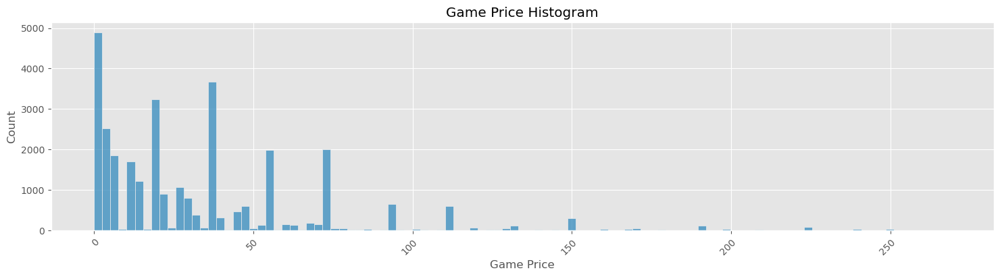

In [17]:
fig, ax = plt.subplots(figsize=(18, 4))
f = sns.histplot(fixed_data['price'], ax=ax)
f.set_title("Game Price Histogram")
f.set_xlabel("Game Price")
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.show()

We want to check if there is any correlation between all_review, reviews_type and awards. Let's see using a heatmap:

<AxesSubplot:>

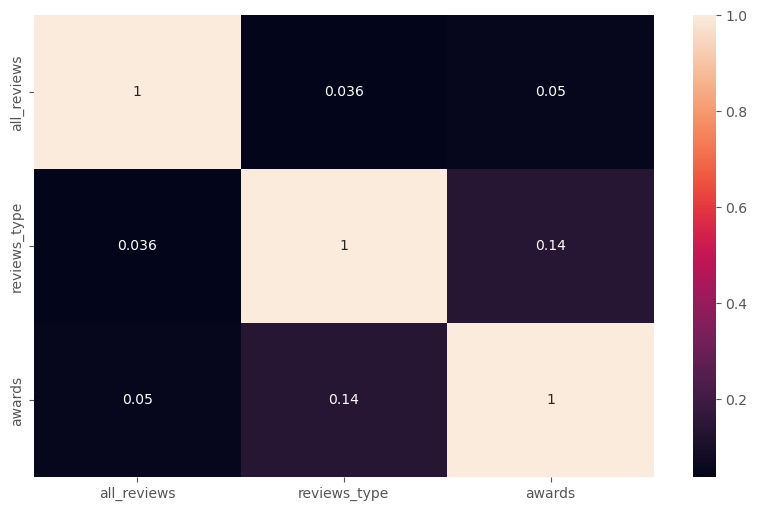

In [18]:
data_noEnglish_col=fixed_data.copy()
del data_noEnglish_col["english_support"]
corr_df_reviews_to_awards=data_noEnglish_col[["all_reviews","reviews_type","awards"]].corr()
sns.heatmap(corr_df_reviews_to_awards, annot=True)

Let's see if there is any correlation between prices and awards.

<AxesSubplot:>

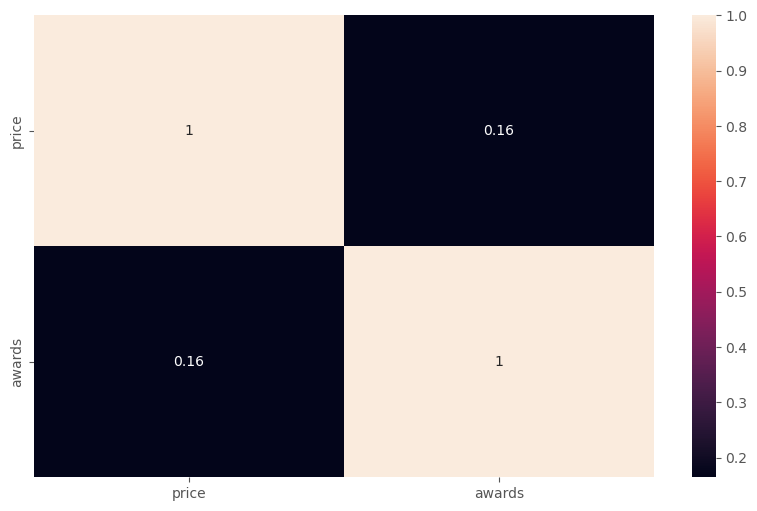

In [19]:
corr_df_price_to_awards=data_noEnglish_col[["price","awards"]].corr()
sns.heatmap(corr_df_price_to_awards, annot=True)

There's almost no correlation between prices and awards or all_review, reviews_type and awards.

<AxesSubplot:>

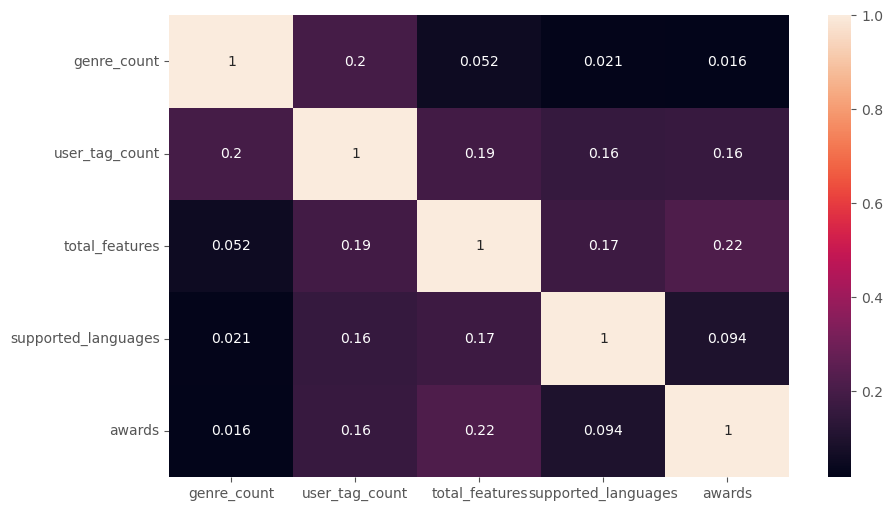

In [20]:
corr_df_spicy_to_awards=data_noEnglish_col[["genre_count","user_tag_count","total_features","supported_languages","awards"]].corr()
sns.heatmap(corr_df_spicy_to_awards, annot=True)

<AxesSubplot:>

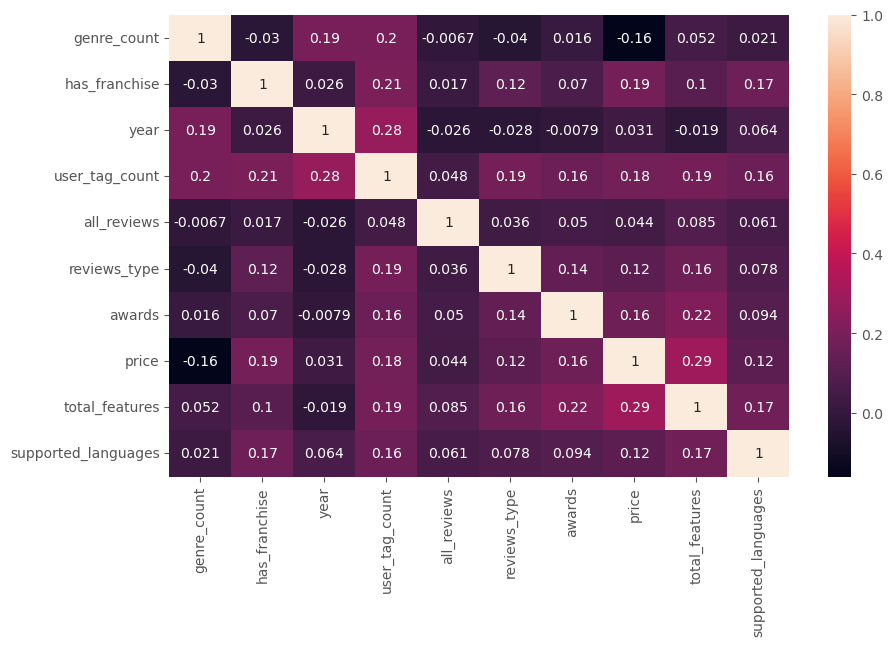

In [21]:

sns.heatmap(data_noEnglish_col.corr(), annot=True)

We can see that there is some correlation between total_features and price and user_tag and year

Let's look at the percentage of total games that won awards

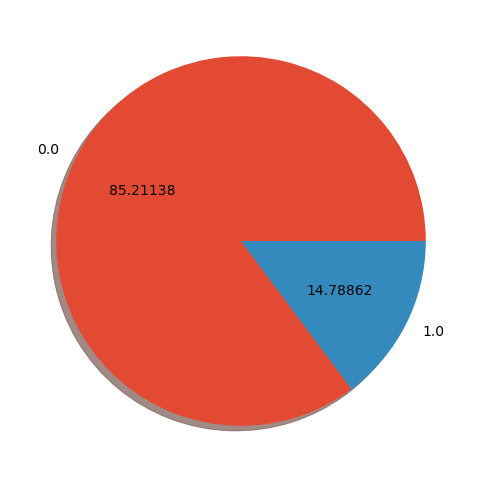

In [22]:
v_counts = fixed_data["awards"].value_counts()
total = len(v_counts)
fig = plt.figure()
plt.pie(v_counts, labels=v_counts.index, autopct='%.5f', shadow=True);

a histogram showing games that won an award and those that have not, through game publication years.

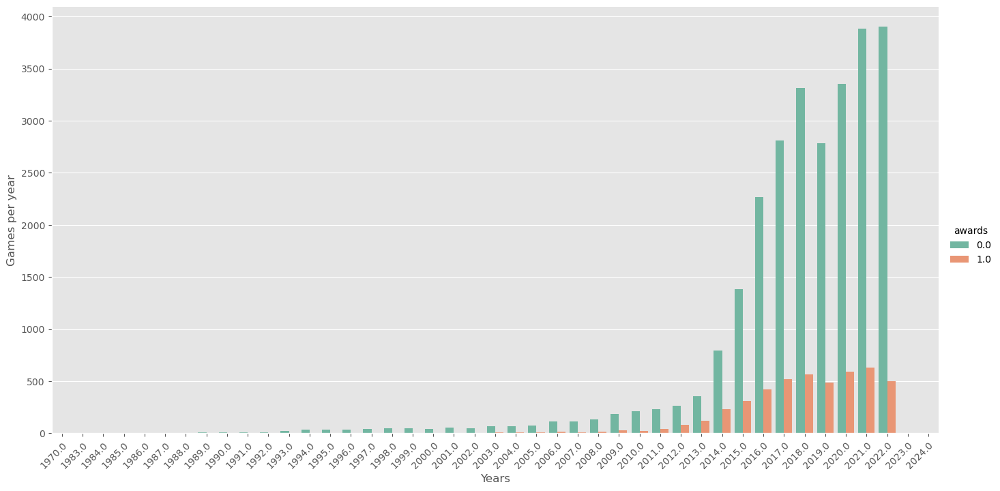

In [23]:
fg = sns.catplot(kind='count', data=fixed_data,x="year", hue='awards', palette='Set2', height=7, aspect=2)
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
fg.set_axis_labels("Years", "Games per year")
#fg.set_xticklabels(   )
fg.set_titles("{col_name} {col_var}")
plt.show()

Winning awards to user tag count Histogram

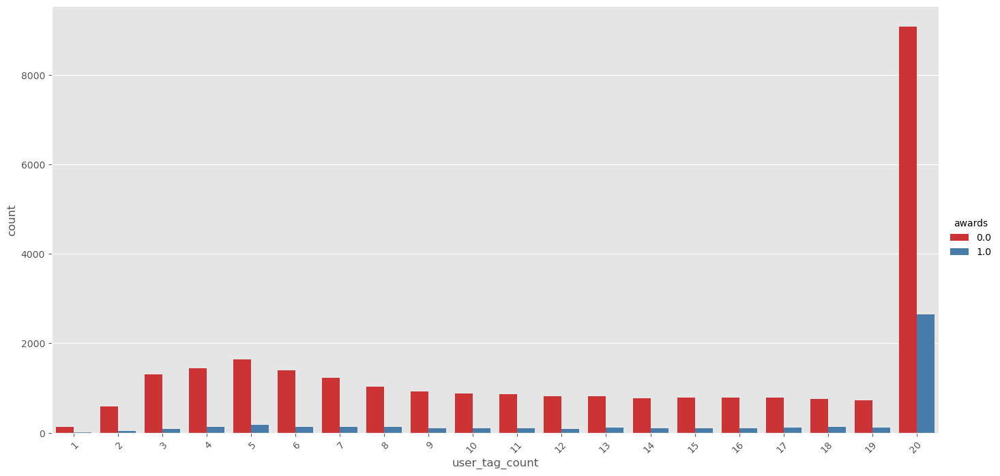

In [24]:
fg = sns.catplot(kind='count', data=fixed_data,x="user_tag_count", hue='awards', palette='Set1', height=7, aspect=2)
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')

#fg.set_xticklabels(   )
fg.set_titles("{col_name} {col_var}")
plt.show()

In [26]:
fixed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31389 entries, 0 to 31388
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   game_name            31389 non-null  object 
 1   genres               31389 non-null  object 
 2   genre_count          31389 non-null  int64  
 3   franchise            31389 non-null  object 
 4   has_franchise        31389 non-null  int64  
 5   developer            31389 non-null  object 
 6   publisher            31389 non-null  object 
 7   day_month            31389 non-null  object 
 8   year                 31389 non-null  float64
 9   popular_tag          31389 non-null  object 
 10  user_tag_count       31389 non-null  int64  
 11  user_tags            31389 non-null  object 
 12  all_reviews          31389 non-null  float64
 13  reviews_type         31389 non-null  int64  
 14  awards               31389 non-null  float64
 15  price                31389 non-null 

## Machine Learning Model ##
<a id='Machine learning'></a>

In [12]:
#!pip install pydotplus
#!pip install graphviz
#!pip install pydot


## Preprocessing
<a id='Preprocessing'></a>

This function converts categorial to numerial with specific attention to user tag because it's a list.

In [85]:
def processData(df,features):
    df_ml=df[features]
    split_df = pd.DataFrame(df_ml['popular_tag'].tolist())
    df_combined = pd.concat([df_ml, split_df], axis=1)
    df_combined = df_combined.drop('popular_tag', axis=1)
    df_combined.rename(columns = {0:'popular_tag'}, inplace = True)
    
    cat_columns = df_combined.select_dtypes(['object']).columns
    df_combined[cat_columns] = df_combined[cat_columns].apply(lambda x: pd.factorize(x)[0])
    
    return df_combined

In [13]:
df_ml=fixed_data[["genre_count","has_franchise","year","popular_tag",
                  "user_tag_count","all_reviews","reviews_type","awards",
                  "total_features","supported_languages","price"]]


In [14]:
df_ml

,genre_count,has_franchise,year,popular_tag,user_tag_count,all_reviews,reviews_type,awards,total_features,supported_languages,price
0,2,0,2012.0,[FPS],20,6833486.0,7,1.0,10,28,0.0
1,3,1,2013.0,[FreetoPlay],20,1903396.0,7,0.0,5,28,0.0
2,2,1,2022.0,[Souls-like],20,457621.0,7,1.0,8,14,249.0
3,3,1,2020.0,[FreetoPlay],20,559929.0,7,1.0,6,13,0.0
4,2,1,2019.0,[OpenWorld],20,308953.0,7,1.0,8,13,230.0
...,...,...,...,...,...,...,...,...,...,...,...
31384,4,0,2021.0,[Adventure],17,21.0,4,0.0,1,2,0.0
31385,5,0,2022.0,[Adventure],20,12.0,4,0.0,1,2,0.0
31386,3,0,2020.0,[RPG],20,10.0,6,0.0,4,1,18.5
31387,2,0,2022.0,[Horror],10,10.0,6,0.0,2,2,3.5


In [15]:
split_df = pd.DataFrame(df_ml['popular_tag'].tolist())
df_combined = pd.concat([df_ml, split_df], axis=1)
df_combined = df_combined.drop('popular_tag', axis=1)
df_combined.rename(columns = {0:'popular_tag'}, inplace = True)

In [16]:
df_combined

,genre_count,has_franchise,year,user_tag_count,all_reviews,reviews_type,awards,total_features,supported_languages,price,popular_tag
0,2,0,2012.0,20,6833486.0,7,1.0,10,28,0.0,FPS
1,3,1,2013.0,20,1903396.0,7,0.0,5,28,0.0,FreetoPlay
2,2,1,2022.0,20,457621.0,7,1.0,8,14,249.0,Souls-like
3,3,1,2020.0,20,559929.0,7,1.0,6,13,0.0,FreetoPlay
4,2,1,2019.0,20,308953.0,7,1.0,8,13,230.0,OpenWorld
...,...,...,...,...,...,...,...,...,...,...,...
31384,4,0,2021.0,17,21.0,4,0.0,1,2,0.0,Adventure
31385,5,0,2022.0,20,12.0,4,0.0,1,2,0.0,Adventure
31386,3,0,2020.0,20,10.0,6,0.0,4,1,18.5,RPG
31387,2,0,2022.0,10,10.0,6,0.0,2,2,3.5,Horror


In [17]:
df_fd=df_combined.copy()

cat_columns = df_fd.select_dtypes(['object']).columns
df_fd[cat_columns] = df_fd[cat_columns].apply(lambda x: pd.factorize(x)[0])
df_fd.head(10)

,genre_count,has_franchise,year,user_tag_count,all_reviews,reviews_type,awards,total_features,supported_languages,price,popular_tag
0,2,0,2012.0,20,6833486.0,7,1.0,10,28,0.00,0
1,3,1,2013.0,20,1903396.0,7,0.0,5,28,0.00,1
2,2,1,2022.0,20,457621.0,7,1.0,8,14,249.00,2
3,3,1,2020.0,20,559929.0,7,1.0,6,13,0.00,1
4,2,1,2019.0,20,308953.0,7,1.0,8,13,230.00,3
5,3,1,2022.0,20,58598.0,9,0.0,5,18,199.00,4
6,4,0,2013.0,20,358185.0,8,1.0,11,18,0.00,1
7,2,1,2015.0,20,1334993.0,7,1.0,8,13,191.00,3
8,2,0,2022.0,20,5447.0,7,0.0,3,5,224.95,0
9,1,0,2020.0,20,506750.0,8,1.0,5,18,269.00,5


## Decisions Tree ML
<a id='Decisions tree ml'></a>
The method we chose for our machine learning model was decisions tree.
Reasons we chose this model:<br>
<br>    -This this is a classification model</br>
<br>    -Its simple and intuitive.</br>
<br>    -Using random forest for simulating cross validation</br>

In [167]:
def splitData(df,features,label,split_random_state):
    """Split a subset of the titanic dataset, given by the features, into train and test sets."""
    df_predictors = df[features].values
    df_labels = df[label].values

    # Split into training and test sets
    XTrain, XTest, yTrain, yTest = train_test_split(df_predictors, df_labels, random_state=split_random_state)
    return XTrain, XTest, yTrain, yTest

In [24]:
from IPython.display import Image, display  
import pydotplus 
from scipy import misc

def renderTree(ze_tree, features):
    # hacky solution of writing to files and reading again
    # necessary due to library bugs
    filename = "temp.dot"
    with open(filename, 'w') as f:
        f = tree.export_graphviz(ze_tree, 
                                 out_file=f, 
                                 feature_names=features, 
                                 class_names=["Fail", "Success"],  
                                 filled=True, 
                                 rounded=True,
                                 special_characters=True)
  
    dot_data = ""
    with open(filename, 'r') as f:
        dot_data = f.read()

    graph = pydotplus.graph_from_dot_data(dot_data)
    image_name = "temp.png"
   
    graph.write_png(image_name)  
    display(Image(filename=image_name))

## First Model Attempt
<a id='First model attempt'></a>
Let's start with one feature and see if we need to make improvements. <br>

Accuracy on training data =  0.8537870098976255
Accuracy on test data =  0.8470948012232415


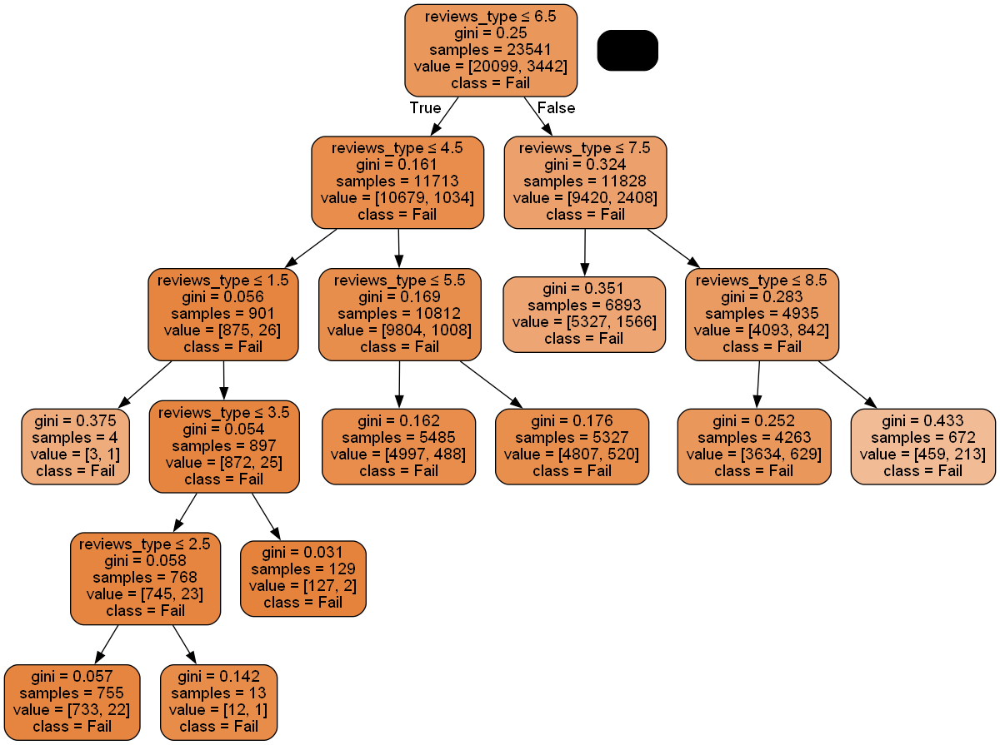

In [41]:
decisionTree = tree.DecisionTreeClassifier()

features = ["reviews_type"
           ]

XTrain, XTest, yTrain, yTest = splitData(df_fd, features, ["awards"],42)
# fit the tree with the traing data
decisionTree = decisionTree.fit(XTrain, yTrain)

# predict with the training data
y_pred_train = decisionTree.predict(XTrain)
# measure accuracy
print('Accuracy on training data = ', 
      metrics.accuracy_score(y_true = yTrain, y_pred = y_pred_train))

# predict with the test data
y_pred = decisionTree.predict(XTest)
# measure accuracy
print('Accuracy on test data = ', 
      metrics.accuracy_score(y_true = yTest, y_pred = y_pred))

renderTree(decisionTree, features)

## Second Model Attempt
<a id='Second model attempt'></a>
Let's try with more features and different parameters.

Accuracy on training data =  0.8685272503292129
Accuracy on test data =  0.8412334352701325
f_measure score=  0.2420924574209246
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.817948 to fit



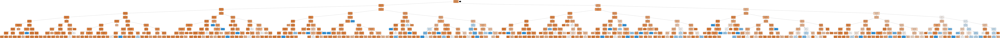

In [122]:
decisionTree = tree.DecisionTreeClassifier(max_depth=9, min_samples_split=20)

features = ["genre_count"
            ,"has_franchise"
            ,"year"
            ,"popular_tag"
            ,"user_tag_count"
            ,"all_reviews"
            ,"reviews_type"
            ,"total_features"
            ,"supported_languages"
            ,"price"]

XTrain, XTest, yTrain, yTest = splitData(df_fd, features, ["awards"],42)
# fit the tree with the traing data
decisionTree = decisionTree.fit(XTrain, yTrain)

# predict with the training data
y_pred_train = decisionTree.predict(XTrain)
# measure accuracy
print('Accuracy on training data = ', 
      metrics.accuracy_score(y_true = yTrain, y_pred = y_pred_train))

# predict with the test data
y_pred = decisionTree.predict(XTest)
# measure accuracy
print('Accuracy on test data = ', 
      metrics.accuracy_score(y_true = yTest, y_pred = y_pred))
print('f_measure score= ',  f1_score(yTest, y_pred))
renderTree(decisionTree, features)

### Let's see if we can improve the model even more.
We will start with adding a column of how many awards the developer of the game already has.

In [83]:
data_dev = pd.DataFrame(fixed_data['developer'].tolist())
df_combined = pd.concat([fixed_data, data_dev[0]], axis=1)
df_combined = df_combined.drop('developer', axis=1)
df_combined.rename(columns = {0:'developer'}, inplace = True)

p_df = df_combined[df_combined["awards"] == 1].groupby(by="developer").sum()[["awards"]]

developers_awards_count = dict(zip(p_df.index, p_df["awards"].tolist()))
def get_developers_awards_count(developer, developers_awards_count):
    if developer in developers_awards_count:
        return developers_awards_count[developer]
    return 0
df_combined["game_developer_awards_count"] = df_combined["developer"].apply(lambda developer: get_developers_awards_count(developer, developers_awards_count))



In [86]:
feats=["genre_count","has_franchise","year","popular_tag",
                  "user_tag_count","all_reviews","reviews_type","awards",
                  "total_features","supported_languages","price","game_developer_awards_count"]
processed_data=processData(df_combined,feats)

Accuracy on training data =  0.9228579924387239
Accuracy on test data =  0.9051987767584098
f_measure score=  0.7111801242236024


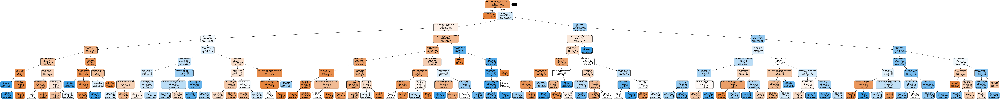

In [120]:
decisionTree = tree.DecisionTreeClassifier(max_depth=8, min_samples_split=12)

features = ["genre_count"
            ,"has_franchise"
            ,"year"
            ,"popular_tag"
            ,"user_tag_count"
            ,"all_reviews"
            ,"reviews_type"
            ,"total_features"
            ,"supported_languages"
            ,"price"
            ,"game_developer_awards_count"]

XTrain, XTest, yTrain, yTest = splitData(processed_data, features, ["awards"],42)
# fit the tree with the traing data
decisionTree = decisionTree.fit(XTrain, yTrain)

# predict with the training data
y_pred_train = decisionTree.predict(XTrain)
# measure accuracy
print('Accuracy on training data = ', 
      metrics.accuracy_score(y_true = yTrain, y_pred = y_pred_train))

# predict with the test data
y_pred = decisionTree.predict(XTest)
# measure accuracy
print('Accuracy on test data = ', 
      metrics.accuracy_score(y_true = yTest, y_pred = y_pred))
print('f_measure score= ',  f1_score(yTest, y_pred))
renderTree(decisionTree, features)


We can see that we got an improvement of 6% to the model, but we might have over-fitting. 

### Optimization
<a id='Optimization'></a>
We will try changing the depth and the min sample split to try and improve the prediction accuracy.

In [93]:
parameters = {'max_depth': range(2, 15), "min_samples_split": range(5, 50) }
dt = tree.DecisionTreeClassifier()

clf = GridSearchCV(dt, parameters, scoring=make_scorer(metrics.accuracy_score, greater_is_better=True))
clf.fit(XTrain, yTrain)

print("best parameter set is:",clf.best_params_," and its score was",clf.best_score_)

best parameter set is: {'max_depth': 8, 'min_samples_split': 20}  and its score was 0.9109636854751102


Let's try predicting again with the suggested max depth and see if there's any improvement.

Accuracy on training data =  0.9211163501975277
Accuracy on test data =  0.9064729867482161
f_measure score=  0.7135050741608118


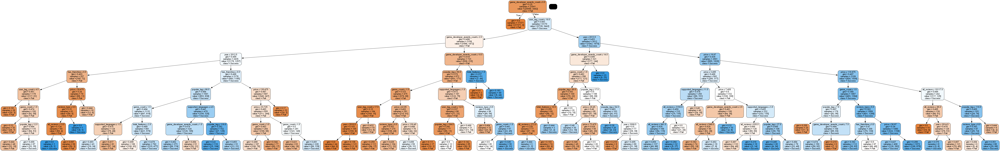

In [123]:
decisionTree = tree.DecisionTreeClassifier(max_depth=8,min_samples_split=50)

features = ["genre_count"
            ,"has_franchise"
            ,"year"
            ,"popular_tag"
            ,"user_tag_count"
            ,"all_reviews"
            ,"reviews_type"
            ,"total_features"
            ,"supported_languages"
            ,"price"
            ,"game_developer_awards_count"]

XTrain, XTest, yTrain, yTest = splitData(processed_data, features, ["awards"],42)
# fit the tree with the traing data
decisionTree = decisionTree.fit(XTrain, yTrain)

# predict with the training data
y_pred_train = decisionTree.predict(XTrain)
# measure accuracy
print('Accuracy on training data = ', 
      metrics.accuracy_score(y_true = yTrain, y_pred = y_pred_train))

# predict with the test data
y_pred = decisionTree.predict(XTest)
# measure accuracy
print('Accuracy on test data = ', 
      metrics.accuracy_score(y_true = yTest, y_pred = y_pred))
print('f_measure score= ',  f1_score(yTest, y_pred))
renderTree(decisionTree, features)


We can see there is **very** slight improvement 

## Prediction Model- Random Forest
<a id='Prediction model- random forest'></a>

One decision tree might not be enough to predict if a game will win an award, so we will try if we can get better prediction results using the Random Forest prediction model. <br>
**Why pick random forest?** <br>
Improved performance (the wisdom of crowds)<br>
Improved robustness :its less likely to overfit since it relies on many random trees 
<br><br> Explanation can be read <a href="https://towardsdatascience.com/random-forest-models-why-are-they-better-than-single-decision-trees-70494c29ccd1/">here<a><br>



In [125]:
#using random forest
features = ["genre_count"
            ,"has_franchise"
            ,"year"
            ,"popular_tag"
            ,"user_tag_count"
            ,"all_reviews"
            ,"reviews_type"
            ,"total_features"
            ,"supported_languages"
            ,"price"
            ,"game_developer_awards_count"]

XTrain, XTest, yTrain, yTest = splitData(processed_data, features, ["awards"],42)

forest =  RandomForestClassifier(bootstrap=True, n_estimators=50, random_state=0)

trained_forest = forest.fit(XTrain, yTrain.ravel()) 

y_pred_train = trained_forest.predict(XTrain)
print('Accuracy on training data= ', metrics.accuracy_score(y_true = yTrain, y_pred = y_pred_train))

y_pred = trained_forest.predict(XTest)
print('Accuracy on test data= ', metrics.accuracy_score(y_true = yTest, y_pred = y_pred))
print('f_measure score= ',  f1_score(yTest, y_pred))

Accuracy on training data=  1.0
Accuracy on test data=  0.9119520897043832
f_measure score=  0.7208080808080808


Lets see if we can improve it more, see if there is any feature we can try to remove a feature that has the least weight.

In [126]:
featuresDF = pd.DataFrame({"features": features, "weights": trained_forest.feature_importances_})
featuresDF.sort_values("weights", ascending=False)

,features,weights
10,game_developer_awards_count,0.465165
5,all_reviews,0.088350
9,price,0.080252
3,popular_tag,0.065792
2,year,0.060076
7,total_features,0.053232
8,supported_languages,0.053053
4,user_tag_count,0.050701
0,genre_count,0.039778
6,reviews_type,0.030144


In [128]:
features = ["genre_count"
            ,"year"
            ,"popular_tag"
            ,"user_tag_count"
            ,"all_reviews"
            ,"reviews_type"
            ,"total_features"
            ,"supported_languages"
            ,"price"
            ,"game_developer_awards_count"]

XTrain, XTest, yTrain, yTest = splitData(processed_data, features, ["awards"],42)

forest =  RandomForestClassifier(bootstrap=True, n_estimators=50, random_state=0)

trained_forest = forest.fit(XTrain, yTrain.ravel()) 

y_pred_train = trained_forest.predict(XTrain)
print('Accuracy on training data= ', metrics.accuracy_score(y_true = yTrain, y_pred = y_pred_train))

y_pred = trained_forest.predict(XTest)
print('Accuracy on test data= ', metrics.accuracy_score(y_true = yTest, y_pred = y_pred))
print('f_measure score= ',  f1_score(yTest, y_pred))

Accuracy on training data=  1.0
Accuracy on test data=  0.9087665647298675
f_measure score=  0.7101214574898786


we can see that removing the feature with the lowest weight , didnt really improve our model

### Let's try adding a new feature again

Next we will add new column with the mean of the review type of each developer across their games.

In [152]:
data_dev1 = pd.DataFrame(df_combined['developer'].tolist())
df_combined1 = pd.concat([df_combined, data_dev1[0]], axis=1)
df_combined1 = df_combined1.drop('developer', axis=1)
df_combined1.rename(columns = {0:'developer'}, inplace = True)

p_df1 = df_combined1[df_combined1["reviews_type"]>-1].groupby(by="developer").mean()[["reviews_type"]]

developers_by_reviewsType_mean = dict(zip(p_df1.index, p_df1["reviews_type"].tolist()))

def get_developers_by_reviewsType_mean(developer, developers_by_reviewsType_mean):
    if developer in developers_by_reviewsType_mean:
        return developers_by_reviewsType_mean[developer]
    return 0
df_combined1["developers_by_reviewsType_mean"] = df_combined1["developer"].apply(lambda developer: get_developers_by_reviewsType_mean(developer, developers_by_reviewsType_mean))
feats=["genre_count","has_franchise","year","popular_tag",
                  "user_tag_count","all_reviews","reviews_type","awards",
                  "total_features","supported_languages","price","game_developer_awards_count","developers_by_reviewsType_mean"]
processed_data=processData(df_combined1,feats)


In [153]:
processed_data

,genre_count,has_franchise,year,user_tag_count,all_reviews,reviews_type,awards,total_features,supported_languages,price,game_developer_awards_count,developers_by_reviewsType_mean,popular_tag
0,2,0,2012.0,20,6833486.0,7,1.0,10,28,0.0,3.0,8.074074,0
1,3,1,2013.0,20,1903396.0,7,0.0,5,28,0.0,3.0,8.074074,1
2,2,1,2022.0,20,457621.0,7,1.0,8,14,249.0,1.0,7.000000,2
3,3,1,2020.0,20,559929.0,7,1.0,6,13,0.0,4.0,6.500000,1
4,2,1,2019.0,20,308953.0,7,1.0,8,13,230.0,1.0,6.333333,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
31384,4,0,2021.0,17,21.0,4,0.0,1,2,0.0,0.0,6.000000,13
31385,5,0,2022.0,20,12.0,4,0.0,1,2,0.0,0.0,4.000000,13
31386,3,0,2020.0,20,10.0,6,0.0,4,1,18.5,0.0,6.000000,17
31387,2,0,2022.0,10,10.0,6,0.0,2,2,3.5,0.0,6.000000,12


lets see if there is any improvment

In [189]:
features = ["genre_count"
            ,"has_franchise"
            ,"year"
            ,"popular_tag"
            ,"user_tag_count"
            ,"all_reviews"
            ,"reviews_type"
            ,"total_features"
            ,"supported_languages"
            ,"price"
            ,"game_developer_awards_count"
            ,"developers_by_reviewsType_mean"]

XTrain, XTest, yTrain, yTest = splitData(processed_data, features, ["awards"],42)

forest =  RandomForestClassifier(bootstrap=True, n_estimators=66, random_state=0)

trained_forest = forest.fit(XTrain, yTrain.ravel()) 

y_pred_train = trained_forest.predict(XTrain)
print('Accuracy on training data= ', metrics.accuracy_score(y_true = yTrain, y_pred = y_pred_train))

y_pred = trained_forest.predict(XTest)
print('Accuracy on test data= ', metrics.accuracy_score(y_true = yTest, y_pred = y_pred))
print('f_measure score= ',  f1_score(yTest, y_pred))

Accuracy on training data=  1.0
Accuracy on test data=  0.9290265035677879
f_measure score=  0.77181482998771


In [162]:
featuresDF = pd.DataFrame({"features": features, "weights": trained_forest.feature_importances_})
featuresDF.sort_values("weights", ascending=False)

,features,weights
10,game_developer_awards_count,0.462926
11,developers_by_reviewsType_mean,0.089809
5,all_reviews,0.074362
9,price,0.062458
3,popular_tag,0.052507
2,year,0.048428
7,total_features,0.046509
8,supported_languages,0.043866
4,user_tag_count,0.043440
0,genre_count,0.032575


As we can see we did can an improvement of 5% to the f_measure and the accuracy of the test data (by 1%).

Let's see if different configurations yield better results.

In [155]:
# some hyper-params tuning
parameters = {
    'bootstrap':[True],
    'n_estimators':[50, 51, 53,55, 100, 101, 501, 1000],
    'random_state':[0],
    'max_features':['sqrt', 'log2', 'auto']
}
rf = RandomForestClassifier()
clf = GridSearchCV(rf, parameters, scoring=make_scorer(metrics.accuracy_score, greater_is_better=True))
clf.fit(XTrain, yTrain.ravel())
print("best parameter set is:",clf.best_params_," and its score was",clf.best_score_)

best parameter set is: {'bootstrap': True, 'max_features': 'sqrt', 'n_estimators': 1000, 'random_state': 0}  and its score was 0.9355591969173439


In [192]:
features = ["genre_count"
            ,"has_franchise"
            ,"year"
            ,"popular_tag"
            ,"user_tag_count"
            ,"all_reviews"
            ,"reviews_type"
            ,"total_features"
            ,"supported_languages"
            ,"price"
            ,"game_developer_awards_count"
            ,"developers_by_reviewsType_mean"]

XTrain, XTest, yTrain, yTest = splitData(processed_data, features, ["awards"],42)

forest =  RandomForestClassifier(bootstrap=True, n_estimators=55, random_state=0,max_features='sqrt')

trained_forest = forest.fit(XTrain, yTrain.ravel()) 

y_pred_train = trained_forest.predict(XTrain)
print('Accuracy on training data= ', metrics.accuracy_score(y_true = yTrain, y_pred = y_pred_train))

y_pred = trained_forest.predict(XTest)
print('Accuracy on test data= ', metrics.accuracy_score(y_true = yTest, y_pred = y_pred))
print('f_measure score= ',  f1_score(yTest, y_pred))

Accuracy on training data=  1.0
Accuracy on test data=  0.9297910295616718
f_measure score=  0.7761072734660707


We can a slight improvement with the f_measure_score (by ~0.5%)

In [193]:
def manual_different_test_groups_accuracy_calc(split_random_state: int):
    features = ["genre_count"
            ,"has_franchise"
            ,"year"
            ,"popular_tag"
            ,"user_tag_count"
            ,"all_reviews"
            ,"reviews_type"
            ,"total_features"
            ,"supported_languages"
            ,"price"
            ,"game_developer_awards_count"
            ,"developers_by_reviewsType_mean"]

    XTrain, XTest, yTrain, yTest = splitData(processed_data, features, ["awards"], split_random_state)

    forest =  RandomForestClassifier(bootstrap=True, n_estimators=55, random_state=0, max_features='sqrt')

    trained_forest = forest.fit(XTrain, yTrain.ravel()) 

    y_pred_train = trained_forest.predict(XTrain)
    print('Accuracy on training data= ', metrics.accuracy_score(y_true = yTrain, y_pred = y_pred_train))

    y_pred = trained_forest.predict(XTest)
    print('Accuracy on test data= ', metrics.accuracy_score(y_true = yTest, y_pred = y_pred))

    print('f_measure score= ',  f1_score(yTest, y_pred))

    
split_random_states = [0,50,80,100,125,150,200,250,333,500,555,600,666,700,777,800,850,900,950,1000]

for random_state in split_random_states:
    print("--------")
    print("random_state= ", random_state)
    manual_different_test_groups_accuracy_calc(random_state)
    print("--------")

--------
random_state=  0
Accuracy on training data=  0.9999575209209465
Accuracy on test data=  0.9357798165137615
f_measure score=  0.7840616966580978
--------
--------
random_state=  50
Accuracy on training data=  1.0
Accuracy on test data=  0.9342507645259939
f_measure score=  0.7798634812286689
--------
--------
random_state=  80
Accuracy on training data=  0.9999575209209465
Accuracy on test data=  0.9288990825688074
f_measure score=  0.7680798004987532
--------
--------
random_state=  100
Accuracy on training data=  1.0
Accuracy on test data=  0.9357798165137615
f_measure score=  0.7882352941176473
--------
--------
random_state=  125
Accuracy on training data=  1.0
Accuracy on test data=  0.9323394495412844
f_measure score=  0.779759435918706
--------
--------
random_state=  150
Accuracy on training data=  1.0
Accuracy on test data=  0.933868501529052
f_measure score=  0.7843788948899045
--------
--------
random_state=  200
Accuracy on training data=  1.0
Accuracy on test data=

# Conclusion:
<a id='Conclusion'></a>
To predict if a game will get an award, we need familiarity with the dataset, (For example: Knowing the average price range of games to destinguish the outliers and take appropriate actions) and some creativity for creating new columns from old ones to improve the prediction model accuracy. (For example: Connecting between the popularity of the developer, by his previously won awards, and the chances of their product winning an award again).<br>
Observing the results, we think we got a pretty good model with high accuracy. 

###### credits
<a id='Credits'></a>

Some of the functions we have used from Campus.co.il Intro To Data Science: <br><a href="https://www.selenium.dev/documentation/webdriver/actions_api/wheel/">-Selenium</a> <br>-Decisions Tree<br>-Graph Plotting<br>